
<h1 align='center'> <font color='grey'><font size=7>⏳💰Case Study: <font color="orange"><b>AdEase</font> - Time Series Forcasting💰⏳</b></font> </font></h1>

<h2 align='right'>Analysed by : <font color='#fa7f22'><b> KASI </b></font></h2>

> ### ❕About:
Ad Ease is an ads and marketing based company helping businesses elicit maximum clicks @ minimum cost. AdEase is an ad infrastructure to help businesses promote themselves easily, effectively, and economically. The interplay of 3 AI modules - Design, Dispense, and Decipher, come together to make it this an end-to-end 3 step process digital advertising solution for all.

> ### 🤔Problem Statement:
You are working in the Data Science team of Ad ease trying to understand the per page view report for different wikipedia pages for 550 days, and forecasting the number of views so that you can predict and optimize the ad placement for your clients. You are provided with the data of 145k wikipedia pages and daily view count for each of them. Your clients belong to different regions and need data on how their ads will perform on pages in different languages.


> ### 🗒️Dataset:

https://drive.google.com/drive/folders/1mdgQscjqnCtdg7LGItomyK0abN6lcHBb


> ### 📖Data Dictionary:

There are two csv files given

- train_1.csv: In the csv file, each row corresponds to a particular article and each column corresponds to a particular date. The values are the number of visits on that date.

The page name contains data in this format:

SPECIFIC NAME _ LANGUAGE.wikipedia.org _ ACCESS TYPE _ ACCESS ORIGIN

having information about the page name, the main domain, the device type used to access the page, and also the request origin(spider or browser agent)


- Exog_Campaign_eng: This file contains data for the dates which had a campaign or significant event that could affect the views for that day. The data is just for pages in English.

There’s 1 for dates with campaigns and 0 for remaining dates. It is to be treated as an exogenous variable for models when training and forecasting data for pages in English



> ### 📒 Methodology:

- Exploratory data analysis

- Time Series forecasting- ARIMA, SARIMAX, and Prophet


> ### ⁉️ Questionnaire:

1. Defining the problem statements and where can this and modifications of this be used?

2. Write 3 inferences you made from the data visualizations

3. What does the decomposition of series do?

4. What level of differencing gave you a stationary series?

5. Difference between arima, sarima & sarimax.

6. Compare the number of views in different languages

7. What other methods other than grid search would be suitable to get the model for all languages?

## 📚Import Libraries <a id="imp_lib"></a>

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

import statsmodels.api as sm

## 🥸Data Wrangling<a id="data_wrangling"></a>

In [4]:
exog = pd.read_csv("Exog_Campaign_eng.csv")
exog.head()

,Exog
0,0
1,0
2,0
3,0
4,0


In [5]:
exog.shape

(550, 1)

In [6]:
exog["Exog"]

0      0
1      0
2      0
3      0
4      0
      ..
545    1
546    1
547    1
548    0
549    0
Name: Exog, Length: 550, dtype: int64

In [7]:
exog["Exog"].value_counts()

Exog
0    496
1     54
Name: count, dtype: int64

In [8]:
Data = pd.read_csv(r"train_1.csv")
Data.shape

(145063, 551)

In [9]:
Data.sample(6)

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
100338,Дания_ru.wikipedia.org_all-access_all-agents,1248.0,1192.0,1059.0,1005.0,1167.0,1235.0,1228.0,1172.0,1277.0,...,2073.0,1889.0,1780.0,2010.0,1980.0,1864.0,1693.0,1728.0,1528.0,1287.0
140190,Tennis_de.wikipedia.org_all-access_all-agents,924.0,1350.0,1395.0,1741.0,875.0,1656.0,1775.0,2056.0,1219.0,...,485.0,300.0,279.0,454.0,346.0,340.0,400.0,534.0,845.0,363.0
136533,山根千佳_ja.wikipedia.org_all-access_spider,2.0,2.0,2.0,2.0,2.0,5.0,3.0,4.0,6.0,...,8.0,5.0,17.0,2.0,7.0,7.0,7.0,14.0,3.0,8.0
12556,Multidimensional_scaling_en.wikipedia.org_desk...,291.0,277.0,206.0,117.0,152.0,277.0,362.0,337.0,283.0,...,314.0,193.0,121.0,124.0,169.0,253.0,236.0,241.0,209.0,128.0
98714,Медаль_Альберта_(Королевское_общество_искусств...,12.0,7.0,4.0,9.0,18.0,8.0,11.0,4.0,24.0,...,10.0,22.0,10.0,18.0,16.0,12.0,14.0,13.0,3.0,14.0
123183,三浦祐太朗_ja.wikipedia.org_all-access_all-agents,1701.0,1378.0,763.0,1516.0,1360.0,779.0,763.0,3465.0,2232.0,...,540.0,895.0,451.0,336.0,266.0,486.0,360.0,327.0,331.0,406.0


In [10]:
df = Data.copy(deep=True)

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
2015-07-01,124323.0,1195.856567,72753.518671,0.0,13.0,109.0,524.0,20381245.0
2015-07-02,124247.0,1204.003638,74215.145424,0.0,13.0,108.0,519.0,20752194.0
2015-07-03,124519.0,1133.675969,69610.224744,0.0,12.0,105.0,504.0,19573967.0
2015-07-04,124409.0,1170.437324,72573.513699,0.0,13.0,105.0,487.0,20439645.0
2015-07-05,124404.0,1217.769300,73796.116656,0.0,14.0,113.0,540.0,20772109.0
...,...,...,...,...,...,...,...,...
2016-12-27,141362.0,1678.301870,92324.820056,0.0,23.0,162.0,668.0,26916991.0
2016-12-28,141241.0,1633.965605,91858.307668,0.0,24.0,163.0,654.0,27025053.0
2016-12-29,141237.0,1684.307717,90142.656814,0.0,23.0,160.0,649.0,26073819.0
2016-12-30,141428.0,1467.943378,81554.814146,0.0,23.0,154.0,635.0,24363967.0


In [12]:
df.columns

Index(['Page', '2015-07-01', '2015-07-02', '2015-07-03', '2015-07-04',
       '2015-07-05', '2015-07-06', '2015-07-07', '2015-07-08', '2015-07-09',
       ...
       '2016-12-22', '2016-12-23', '2016-12-24', '2016-12-25', '2016-12-26',
       '2016-12-27', '2016-12-28', '2016-12-29', '2016-12-30', '2016-12-31'],
      dtype='object', length=551)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145063 entries, 0 to 145062
Columns: 551 entries, Page to 2016-12-31
dtypes: float64(550), object(1)
memory usage: 609.8+ MB


In [14]:
df.isnull().sum()

Page              0
2015-07-01    20740
2015-07-02    20816
2015-07-03    20544
2015-07-04    20654
              ...  
2016-12-27     3701
2016-12-28     3822
2016-12-29     3826
2016-12-30     3635
2016-12-31     3465
Length: 551, dtype: int64

In [15]:
df.isnull().any(axis=1).sum()

27786

In [16]:
df.Page.sample(20)

165               Wanted_zh.wikipedia.org_all-access_spider
126296    Электронная_сигарета_ru.wikipedia.org_all-acce...
101131    Кловерфилд,_10_ru.wikipedia.org_all-access_all...
35718         Seth_Curry_en.wikipedia.org_all-access_spider
65495     Eddie_Redmayne_de.wikipedia.org_desktop_all-ag...
67171        3._Februar_de.wikipedia.org_desktop_all-agents
13722     Category:Sex_positions_commons.wikimedia.org_a...
135385               成田凌_ja.wikipedia.org_all-access_spider
125500    Клинтон,_Челси_ru.wikipedia.org_all-access_spider
13950     File:Adobe_Photoshop_CS6_icon.svg_commons.wiki...
69578     Anne_Hathaway_es.wikipedia.org_desktop_all-agents
13414     Category:Cleavage_(breasts)_commons.wikimedia....
134943               阿部寛_ja.wikipedia.org_all-access_spider
18507     В_поисках_Дори_ru.wikipedia.org_mobile-web_all...
103467    Карлсен,_Магнус_ru.wikipedia.org_desktop_all-a...
113430    The_Clock_that_Went_Backward_en.wikipedia.org_...
63346               楊千霈_zh.wikipedia.org

In [17]:
df.columns

Index(['Page', '2015-07-01', '2015-07-02', '2015-07-03', '2015-07-04',
       '2015-07-05', '2015-07-06', '2015-07-07', '2015-07-08', '2015-07-09',
       ...
       '2016-12-22', '2016-12-23', '2016-12-24', '2016-12-25', '2016-12-26',
       '2016-12-27', '2016-12-28', '2016-12-29', '2016-12-30', '2016-12-31'],
      dtype='object', length=551)

## 🔴Null Treatment <a id="null_treatment"></a>

% data working with: 84.79%


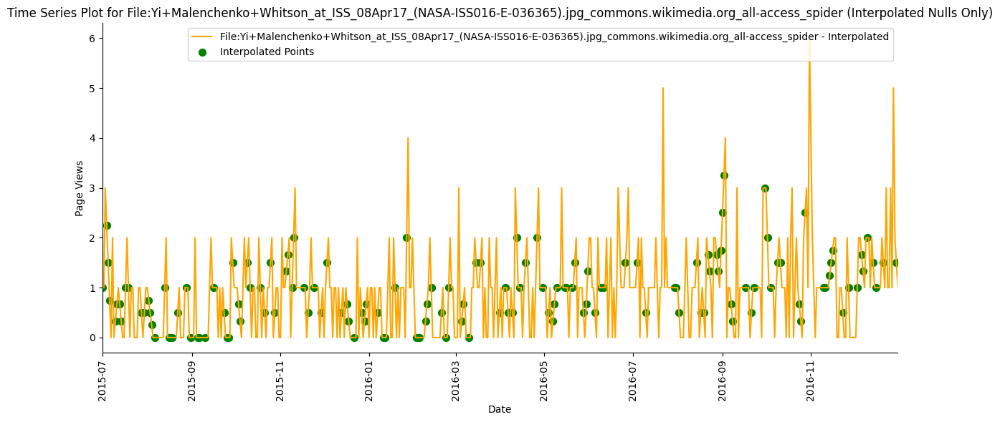

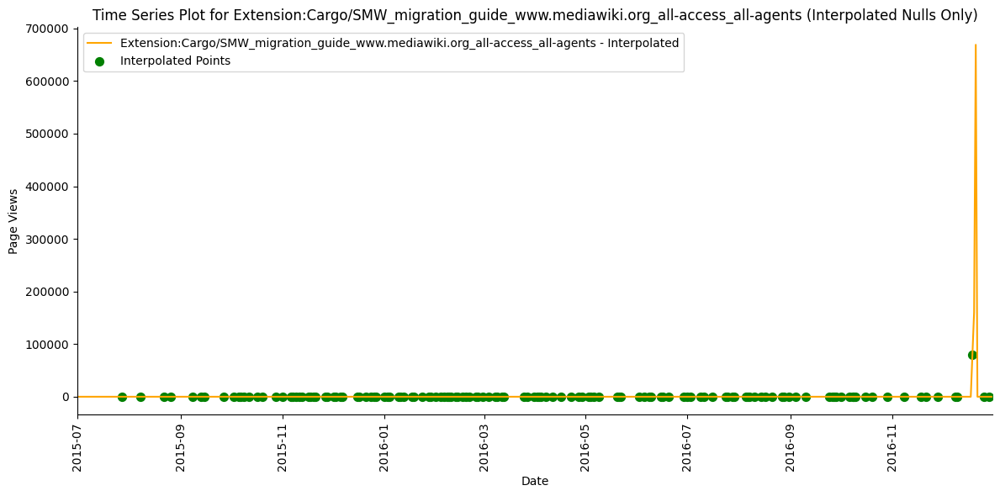

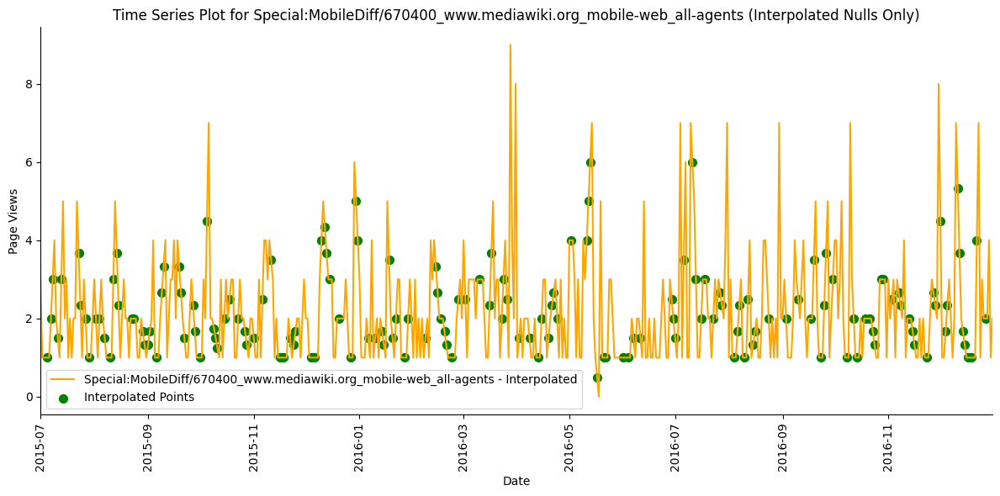

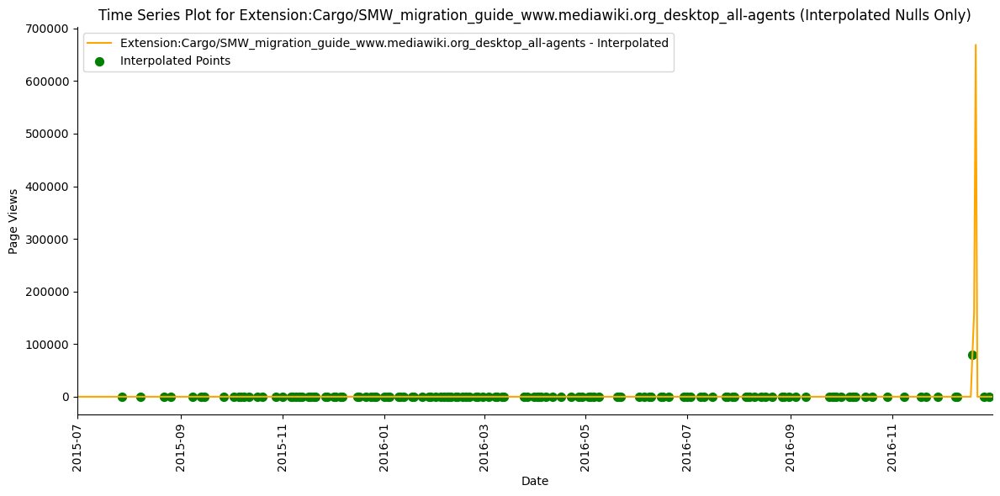

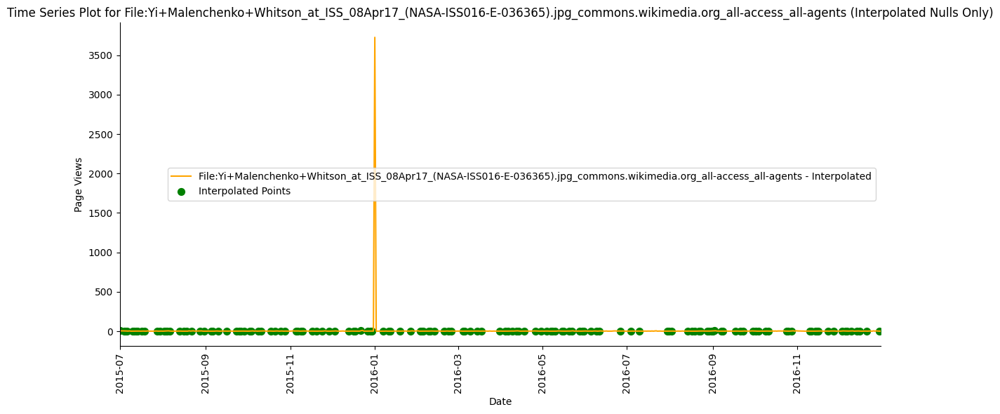

...

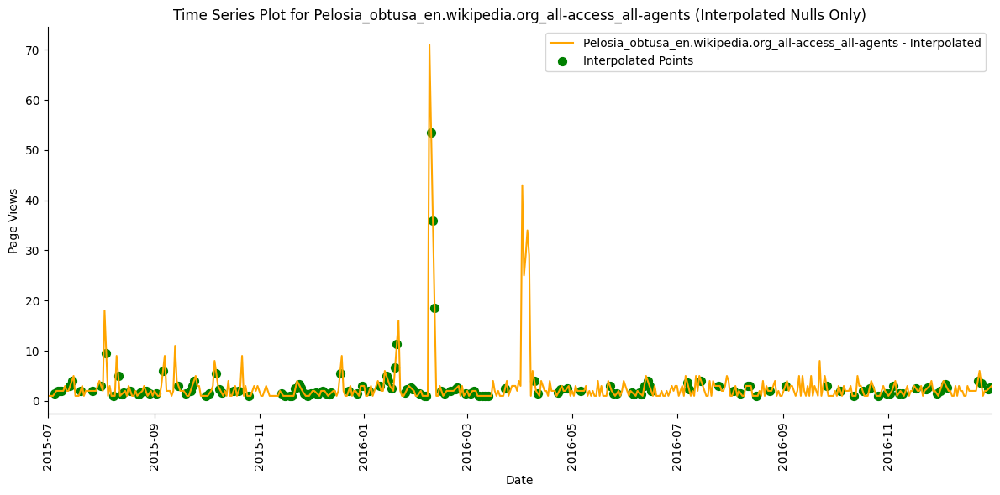

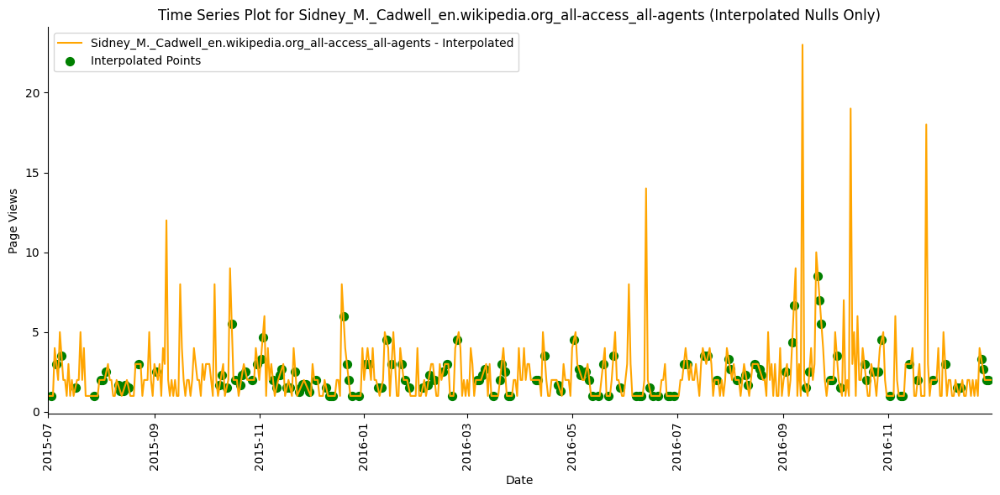

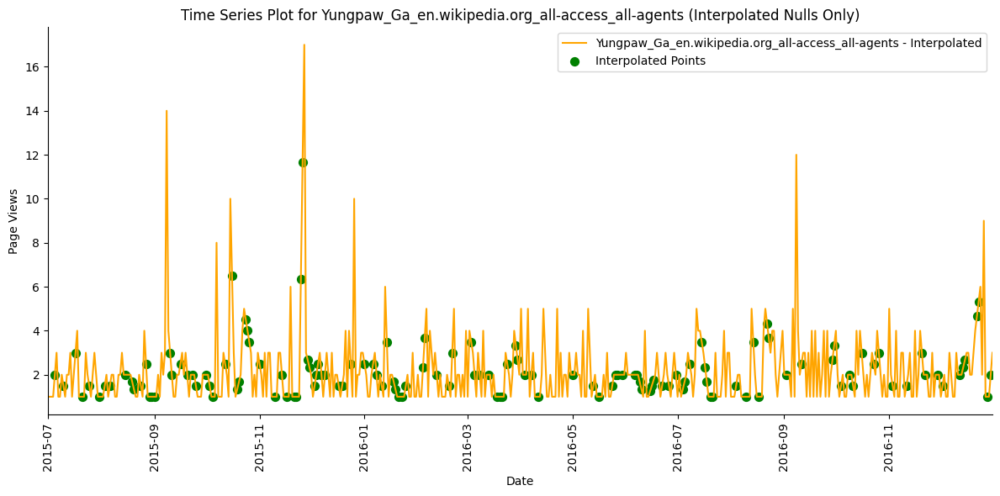

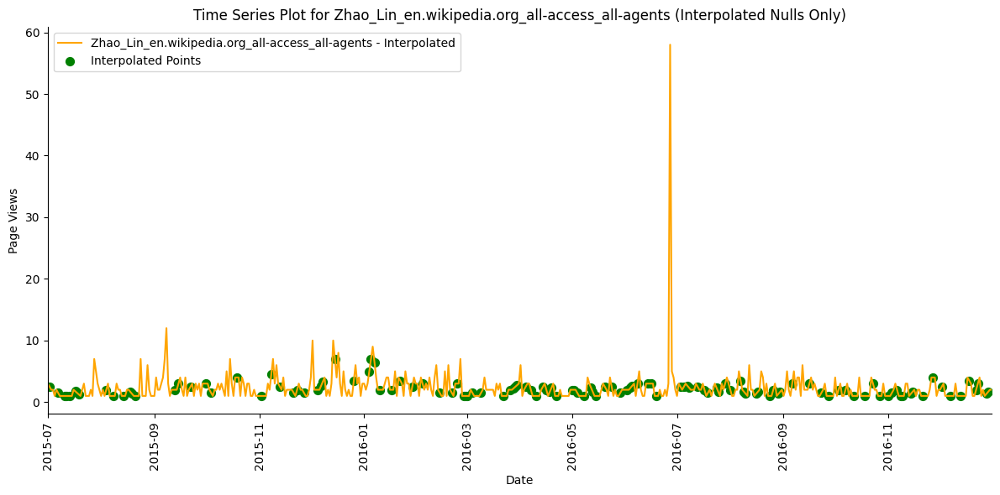

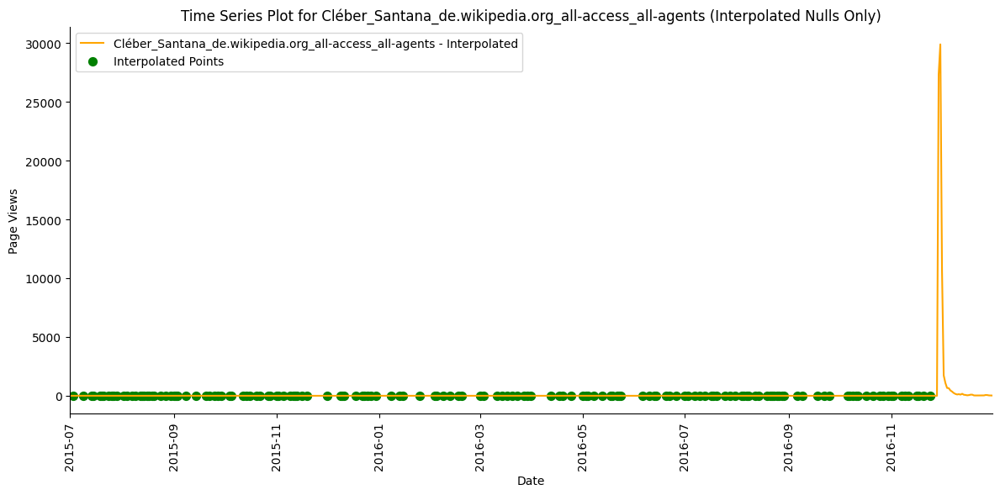

In [18]:
import re

# Step 1: Create a copy of the data
data_copy = df.copy()

# Step 2: Track consecutive nulls per row
max_consecutive_nulls = 3
d_nulldata_consecutive_days = data_copy.iloc[:, 1:].copy()
d_nulldata_consecutive_days.replace(np.nan, -1, inplace=True)

# Convert non-null values to 1 and nulls to 0
for col in d_nulldata_consecutive_days.columns:
    d_nulldata_consecutive_days.loc[d_nulldata_consecutive_days[col] > -1, col] = 1
d_nulldata_consecutive_days.replace(-1, 0, inplace=True)

# Convert each row to a binary string
d_nulldata_consecutive_days = d_nulldata_consecutive_days.apply(
    lambda x: ''.join([str(int(j)) for j in list(x.values)]), axis=1
)

# Identify max consecutive 0s (nulls)
d_nulldata_consecutive_days = d_nulldata_consecutive_days.apply(
    lambda x: [len(j) for j in re.findall(r'[0]+', x)]
)
d_nulldata_consecutive_days1 = d_nulldata_consecutive_days.apply(lambda x: max(x) if len(x) else 0)

# Step 3: Filter data based on allowed consecutive nulls
data_filtered = data_copy.loc[d_nulldata_consecutive_days1 <= max_consecutive_nulls].copy()
print(f"% data working with: {100 * len(data_filtered) / len(data_copy):.2f}%")

# Step 4: Select rows with many nulls overall (for visualization)
max_null_data = data_filtered.loc[
    d_nulldata_consecutive_days.apply(lambda x: len(x)) > 100, :
].copy()

if max_null_data.shape[0] == 0:
    print("No pages with sufficient null values to plot.")
else:
    # Step 5: Prepare for plotting
    max_null_data.set_index('Page', inplace=True)
    max_null_data_t = max_null_data.transpose()
    max_null_data_t.index = pd.to_datetime(max_null_data_t.index, errors='coerce')

    # Step 6: Plot only where interpolation is done
    for page in max_null_data_t.columns:
        df_temp = max_null_data_t[[page]].copy()
        
        # Track nulls before interpolation
        null_mask = df_temp[page].isna()

        # Skip pages with no nulls
        if null_mask.sum() == 0:
            continue

        # Interpolation (in-place)
        df_temp[page] = df_temp[page].interpolate(method='linear').ffill().bfill()

        # Plotting
        plt.figure(figsize=(12, 6))
        plt.plot(df_temp.index, df_temp[page], label=f'{page} - Interpolated', color='orange')
        plt.scatter(df_temp.index[null_mask], df_temp.loc[null_mask, page], 
                    color='green', s=50, label='Interpolated Points')
        plt.xlabel('Date')
        plt.ylabel('Page Views')
        plt.title(f'Time Series Plot for {page} (Interpolated Nulls Only)')
        plt.legend()
        plt.xticks(rotation=90)
        sns.despine()
        plt.tight_layout()
        plt.xlim(df_temp.index.min(), df_temp.index.max())
        sns.despine()
        plt.show()

    # Step 7: Apply interpolation to full dataset
    data_filtered.iloc[:, 1:] = data_filtered.iloc[:, 1:].interpolate(
        method='linear', axis=1).ffill(axis=1).bfill(axis=1)

    # Reset index if needed
    data_filtered.reset_index(drop=True, inplace=True)

    # Final interpolated data
    df = data_filtered.copy()


In [19]:
df.isna().sum().sum()

0

> There are no Nulls in the dataset.

In [20]:
df.Page[1]

'2PM_zh.wikipedia.org_all-access_spider'

In [21]:
# access type and access origin.
temp = df["Page"].str.extract(r"wikipedia\.org_([A-Za-z-_]+)")[0]
temp = temp.str.split("_", expand=True)
temp = pd.concat([temp,df], axis=1).rename(columns={0:"access_type",1:"access_origin"})
lang = temp["Page"].str.extract(r"_([A-Za-z]{2}).wikipedia.org_")
temp = pd.concat([lang,temp], axis=1).rename(columns={0:"language"})
temp["Page"]=temp["Page"].str.replace(r"(_[A-Za-z]{2}.wikipedia.[A-Za-z_-]+)","",regex=True)
temp = temp.rename(columns={"Page":"title"})
df = temp.copy()
df.head()

,language,access_type,access_origin,title,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,zh,all-access,spider,2NE1,18.0,11.0,5.0,13.0,14.0,9.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,zh,all-access,spider,2PM,11.0,14.0,15.0,18.0,11.0,13.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,zh,all-access,spider,3C,1.0,0.0,1.0,1.0,0.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,zh,all-access,spider,4minute,35.0,13.0,10.0,94.0,4.0,26.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,zh,all-access,spider,5566,12.0,7.0,4.0,5.0,20.0,8.0,...,16.0,27.0,8.0,17.0,32.0,19.0,23.0,17.0,17.0,50.0


In [22]:
df.columns

Index(['language', 'access_type', 'access_origin', 'title', '2015-07-01',
       '2015-07-02', '2015-07-03', '2015-07-04', '2015-07-05', '2015-07-06',
       ...
       '2016-12-22', '2016-12-23', '2016-12-24', '2016-12-25', '2016-12-26',
       '2016-12-27', '2016-12-28', '2016-12-29', '2016-12-30', '2016-12-31'],
      dtype='object', length=554)

In [23]:
df["language"].unique()

array(['zh', 'fr', 'en', nan, 'ru', 'de', 'ja', 'es'], dtype=object)

In [24]:
language_dict = {"es":"spanish", "zh":"chinese", "ru":"russian", "fr":"french", "de":"german", "en":"english", "ja":"japanese"}
df["language"] = df["language"].map(language_dict)
df["language"] = df["language"].fillna("unknown language")
df["language"].value_counts()

language
english             20334
japanese            18598
german              16517
french              16065
russian             13569
chinese             13510
spanish             12943
unknown language    11460
Name: count, dtype: int64

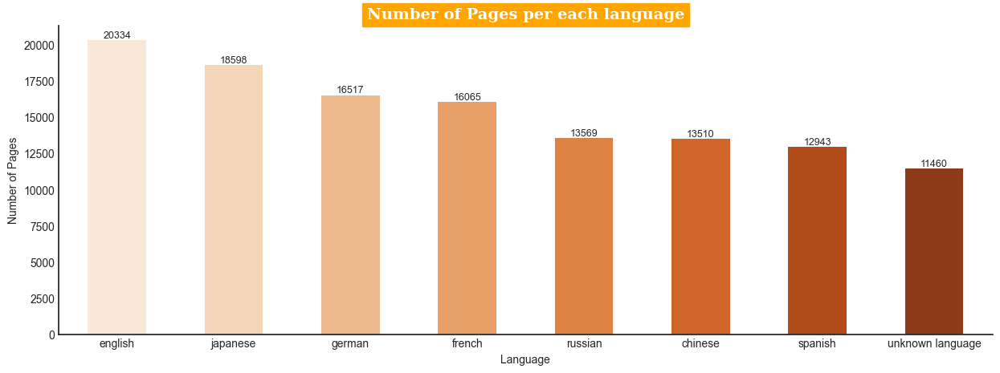

In [153]:
plt.figure(figsize=(15, 5))
# plt.style.use('seaborn-bright_v_0.8')
language_counts = df.groupby("language")["title"].count().sort_values(ascending=False)
ax = sns.barplot(x=language_counts.index, y=language_counts.values, palette="Oranges",width=0.5)
#ax.bar_label(ax.containers[0], fontsize=9, fontweight='bold')
for i, val in enumerate(language_counts.values):
    ax.text(i, val + 1, str(val), ha='center', va='bottom', fontsize=9)
plt.xlabel("Language")
plt.ylabel("Number of Pages")
plt.title(f'Number of Pages per each language',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='orange',color='w')
sns.despine()
plt.show()

In [29]:
(df["language"].value_counts(normalize=True) * 100).round(2)

language
english             16.53
japanese            15.12
german              13.43
french              13.06
russian             11.03
chinese             10.98
spanish             10.52
unknown language     9.32
Name: proportion, dtype: float64

In [30]:
df.sample(3)

,language,access_type,access_origin,title,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
99910,japanese,all-access,all-agents,小林さんちのメイドラゴン,20.0,25.0,21.0,22.0,22.0,27.0,...,701.0,737.0,1232.0,973.0,836.0,919.0,942.0,1736.0,1396.0,1005.0
74428,spanish,all-access,all-agents,Bastian_Schweinsteiger,446.0,422.0,371.0,388.0,382.0,439.0,...,306.0,271.0,305.0,208.0,313.0,420.0,1039.0,1206.0,541.0,454.0
89910,chinese,mobile-web,all-agents,吳思賢_(藝人),41.0,30.0,38.0,37.0,44.0,36.0,...,557.0,480.0,684.0,486.0,397.0,377.0,295.0,291.0,287.0,7949.0


In [31]:
df.isna().sum()

language             0
access_type      11460
access_origin    11460
title                0
2015-07-01           0
                 ...  
2016-12-27           0
2016-12-28           0
2016-12-29           0
2016-12-30           0
2016-12-31           0
Length: 554, dtype: int64

In [32]:
# Forward fill individually for 'access_type'
df['access_type'] = df['access_type'].ffill()

# Forward fill individually for 'access_origin'
df['access_origin'] = df['access_origin'].ffill()


In [33]:
df.columns

Index(['language', 'access_type', 'access_origin', 'title', '2015-07-01',
       '2015-07-02', '2015-07-03', '2015-07-04', '2015-07-05', '2015-07-06',
       ...
       '2016-12-22', '2016-12-23', '2016-12-24', '2016-12-25', '2016-12-26',
       '2016-12-27', '2016-12-28', '2016-12-29', '2016-12-30', '2016-12-31'],
      dtype='object', length=554)

In [34]:
print(f"There are {round(df.isnull().any(axis=1).sum()/df.shape[0]*100,2)}% null rows of data")

There are 0.0% null rows of data


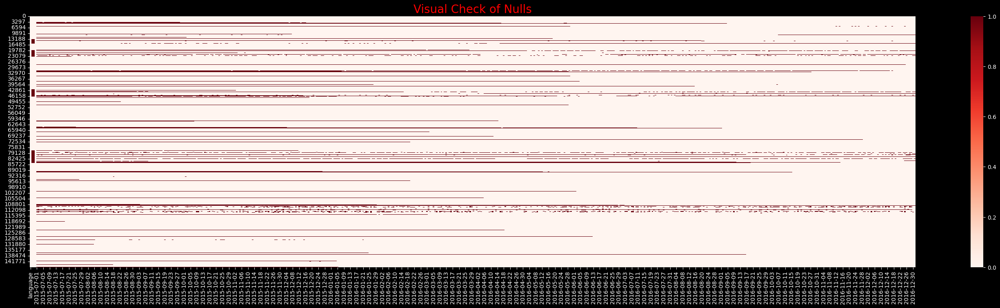

In [ ]:
plt.figure(figsize=(35,8))
plt.style.use('dark_background')
sns.heatmap(df.isnull(),cmap='Reds')
plt.title('Visual Check of Nulls',fontsize=20,color='red')
plt.show()

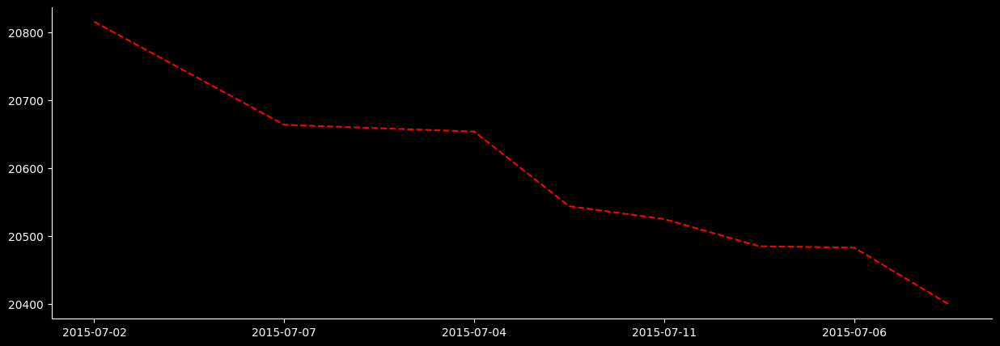

In [ ]:
plt.figure(figsize=(15, 5))
indexes = df.isna().sum().sort_values(ascending=False).head(10).index
df.isna().sum()[indexes].plot(color='red', linestyle='dashed')
sns.despine()
plt.show()

💡Observation:

- The number of nulls for more recent data is less.

- It may happen as more webpages have been developed over time, so for those pages there are nulls in the previous years.

- We should have dropped the rows having more than 300 null values and will replace the remaining null values with 0 befor the extraction, Now we will drop the nulls and proceed.

In [25]:
df.dtypes

language          object
access_type       object
access_origin     object
title             object
2015-07-01       float64
                  ...   
2016-12-27       float64
2016-12-28       float64
2016-12-29       float64
2016-12-30       float64
2016-12-31       float64
Length: 554, dtype: object

In [26]:
df.columns

Index(['language', 'access_type', 'access_origin', 'title', '2015-07-01',
       '2015-07-02', '2015-07-03', '2015-07-04', '2015-07-05', '2015-07-06',
       ...
       '2016-12-22', '2016-12-23', '2016-12-24', '2016-12-25', '2016-12-26',
       '2016-12-27', '2016-12-28', '2016-12-29', '2016-12-30', '2016-12-31'],
      dtype='object', length=554)

In [163]:
df.isna().sum().sum()

0

In [ ]:
# # METHOD - 1
# # # dropping the rows having more than 300 nulls and filling the rest with 0

# # METHOD-2
# # df.dropna(thresh = 300, inplace = True)
# # df.fillna(0, inplace = True)

# # METHOD-3
# df.dropna(inplace = True)

#data is cleaned and ready for analysis using the interpolation above.

In [164]:
df.sample(3)

,language,access_type,access_origin,title,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
88129,chinese,mobile-web,all-agents,香港火警分級制度,18.0,27.0,15.0,10.0,17.0,11.0,...,17.0,24.0,40.0,17.0,26.0,24.0,47.0,77.0,34.0,29.0
85769,russian,desktop,all-agents,Форс-мажоры,583.0,731.0,667.0,558.0,631.0,619.0,...,462.0,451.0,448.0,484.0,523.0,509.0,469.0,457.0,421.0,231.0
50780,chinese,desktop,all-agents,立榮航空873號班機爆炸事件,21.0,29.0,37.0,9.0,15.0,13.0,...,11.0,14.0,11.0,12.0,12.0,17.0,15.0,14.0,17.0,26.0


In [35]:
df.isna().sum().sum()

0

### 🧐**Exploratory Data Analysis** <a id="eda"></a>

In [36]:
df.access_type.value_counts()

access_type
all-access    60310
mobile-web    34767
desktop       27919
Name: count, dtype: int64

In [37]:
df.access_type.value_counts(dropna=False, normalize=True).round(2)

access_type
all-access    0.49
mobile-web    0.28
desktop       0.23
Name: proportion, dtype: float64

In [38]:
df.access_origin.value_counts()

access_origin
all-agents    95910
spider        27086
Name: count, dtype: int64

In [39]:
df.access_origin.value_counts(dropna=False, normalize=True).round(2)

access_origin
all-agents    0.78
spider        0.22
Name: proportion, dtype: float64

In [169]:
df.isna().sum().sum()

0

💡Observation:

- There are no nulls for more recent data

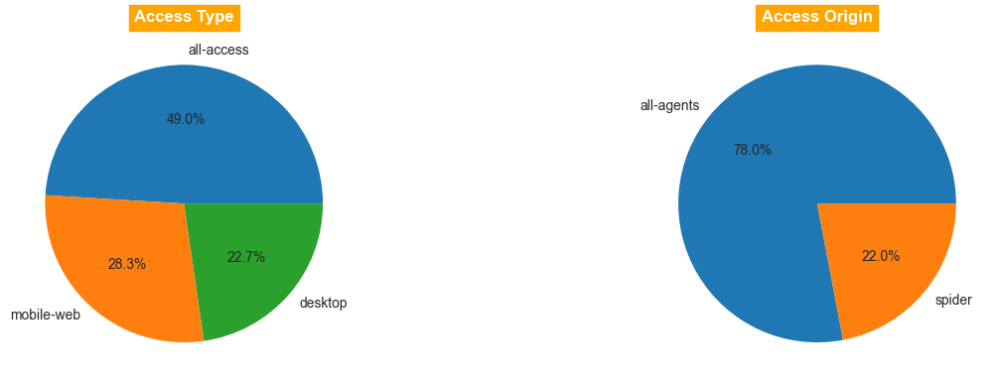

In [170]:
import matplotlib.pyplot as plt

# Value counts
type_counts = df.access_type.value_counts()
origin_counts = df.access_origin.value_counts()

# Plot
plt.figure(figsize=(15,4))

# Access Type Pie Chart
plt.subplot(121)
plt.pie(type_counts, labels=type_counts.index, autopct='%1.1f%%')
plt.title('Access Type', fontsize=12, fontweight='bold',
          backgroundcolor='orange', color='white')

# Access Origin Pie Chart
plt.subplot(122)
plt.pie(origin_counts, labels=origin_counts.index, autopct='%1.1f%%')
plt.title('Access Origin', fontsize=12, fontweight='bold',
          backgroundcolor='orange', color='white')



plt.tight_layout()
plt.show()


In [171]:
df.groupby("language").describe().T

language                chinese       english        french        german  \
2015-07-01 count   13510.000000  2.033400e+04  1.606500e+04  1.651700e+04   
           mean      306.685122  4.153245e+03  5.266534e+02  8.027850e+02   
           std      2583.151519  1.760499e+05  1.653575e+04  2.925135e+04   
           min         0.000000  0.000000e+00  0.000000e+00  0.000000e+00   
           25%        15.000000  3.100000e+01  1.300000e+01  1.100000e+01   
...                         ...           ...           ...           ...   
2016-12-31 min         0.000000  0.000000e+00  0.000000e+00  0.000000e+00   
           25%        22.000000  4.400000e+01  2.300000e+01  2.100000e+01   
           50%       105.000000  5.560000e+02  1.750000e+02  1.420000e+02   
           75%       319.000000  2.943750e+03  4.990000e+02  4.860000e+02   
           max    264023.000000  2.614954e+07  1.541414e+06  3.286214e+06   

language               japanese       russian       spanish  unknown language  
2015-07-01 count   18598.000000  1.356900e+04  1.294300e+04      11460.000000  
           mean      637.662921  6.965580e+02  1.179959e+03        129.341623  
           std      4443.980173  1.547876e+04  2.023354e+04       1721.955126  
           min         0.000000  0.000000e+00  0.000000e+00          0.000000  
           25%        14.000000  2.400000e+01  3.000000e+01          3.000000  
...                         ...           ...           ...               ...  
2016-12-31 min         0.000000  0.000000e+00  0.000000e+00          0.000000  
           25%        63.000000  3.700000e+01  2.600000e+01          4.000000  
           50%       232.000000  2.300000e+02  1.600000e+02         16.000000  
           75%       721.000000  6.200000e+02  5.690000e+02         68.000000  
           max    608083.000000  1.141299e+06  1.045617e+06     172621.000000  

[4400 rows x 8 columns]

In [172]:
df.language.unique()

array(['chinese', 'french', 'english', 'unknown language', 'russian',
       'german', 'japanese', 'spanish'], dtype=object)

In [43]:
# Exclude non-numeric columns before applying mean
agg_TS_data = df.groupby("language").mean(numeric_only=True).T.round(1)

In [44]:
agg_TS_data.head(10)

language,chinese,english,french,german,japanese,russian,spanish,unknown language
2015-07-01,306.7,4153.2,526.7,802.8,637.7,696.6,1180.0,129.3
2015-07-02,307.1,4141.2,530.0,791.9,732.2,708.6,1127.7,135.8
2015-07-03,305.1,3930.5,509.7,760.0,661.3,656.7,1037.1,128.3
2015-07-04,307.9,4099.9,544.6,697.4,830.8,617.7,973.7,109.5
2015-07-05,328.5,4236.1,534.7,810.8,797.0,657.5,1058.9,121.4
2015-07-06,330.2,4551.8,557.1,892.4,694.6,708.3,1206.7,138.9
2015-07-07,329.7,4307.8,538.4,865.5,675.6,692.0,1176.1,147.3
2015-07-08,336.6,4063.9,528.5,878.1,671.6,688.8,1141.5,153.8
2015-07-09,335.0,4160.2,522.9,845.4,654.6,705.5,1119.8,134.1
2015-07-10,348.6,4136.7,493.5,787.8,680.1,808.0,1017.8,135.5


In [175]:
# Ensure the index is in datetime format
agg_TS_data.index = pd.to_datetime(agg_TS_data.index)

In [176]:
agg_TS_data

language,chinese,english,french,german,japanese,russian,spanish,unknown language
2015-07-01,306.7,4153.2,526.7,802.8,637.7,696.6,1180.0,129.3
2015-07-02,307.1,4141.2,530.0,791.9,732.2,708.6,1127.7,135.8
2015-07-03,305.1,3930.5,509.7,760.0,661.3,656.7,1037.1,128.3
2015-07-04,307.9,4099.9,544.6,697.4,830.8,617.7,973.7,109.5
2015-07-05,328.5,4236.1,534.7,810.8,797.0,657.5,1058.9,121.4
...,...,...,...,...,...,...,...,...
2016-12-27,365.7,6746.8,853.1,1141.0,811.9,1023.9,1089.7,184.6
2016-12-28,370.9,6535.6,780.6,1083.7,813.4,965.6,1129.2,215.0
2016-12-29,341.8,7003.1,765.8,1052.6,891.1,929.3,1081.4,179.5
2016-12-30,343.7,5778.8,721.8,1003.6,984.5,830.6,821.7,183.9


In [177]:
agg_TS_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 550 entries, 2015-07-01 to 2016-12-31
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   chinese           550 non-null    float64
 1   english           550 non-null    float64
 2   french            550 non-null    float64
 3   german            550 non-null    float64
 4   japanese          550 non-null    float64
 5   russian           550 non-null    float64
 6   spanish           550 non-null    float64
 7   unknown language  550 non-null    float64
dtypes: float64(8)
memory usage: 38.7 KB


In [178]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


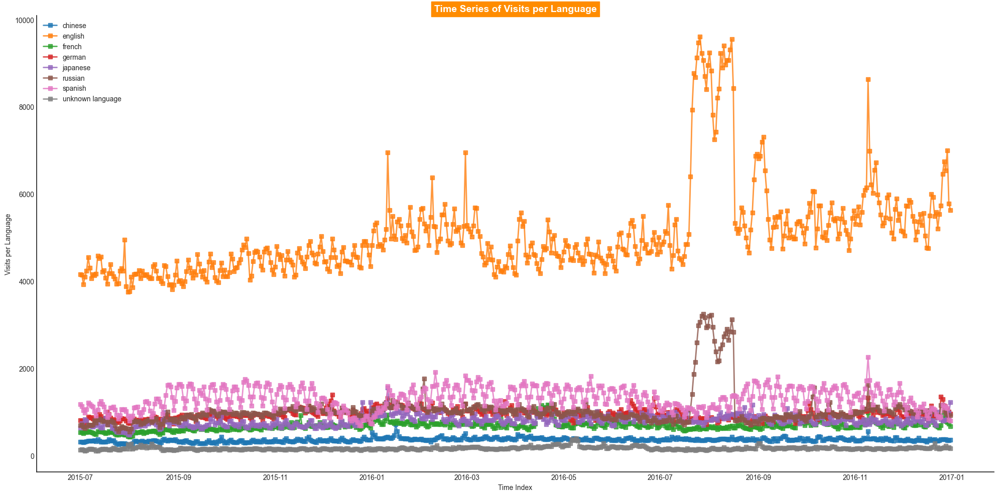

In [179]:
# Visualizing Time Series for Each Language with Markers
plt.figure(figsize=(20, 10))
plt.style.use('default')
plt.style.use('seaborn-v0_8-white')

for column in agg_TS_data.columns:
    plt.plot(agg_TS_data.index, agg_TS_data[column], label=column, linewidth=2, alpha=0.8, marker='s')

plt.xlabel("Time Index")
plt.ylabel("Visits per Language")
plt.title('Time Series of Visits per Language', fontsize=14, fontweight='bold',
          backgroundcolor='darkorange', color='white')

plt.legend(loc='upper left')
plt.tight_layout()
plt.grid(False)
sns.despine()
plt.show()


In [180]:
agg_TS_data.mean(axis=0).sort_values(ascending=False)/agg_TS_data.mean(axis=0).sort_values(ascending=False).sum()*100

language
english             48.904728
spanish             12.539465
russian             10.028118
german               9.134361
japanese             7.741891
french               6.575220
chinese              3.479961
unknown language     1.596256
dtype: float64

💡OBSERVATION:  
- Most viewed page by languges are **english(51.9%), spanish(12.1%), russian(9.7%), german(8.9%), japanese(7.4%), french(6.41%),chinese(3.39%)**

----
### ✔️Stationarity [Augmented Dickey-Fuller (ADF) test]: <a id="checking_stationary"></a>
===========================================================  
checking if the data is stationary  


Null Hypothesis: The series is non-stationary.

Alternate Hypothesis: The series is stationary.

Significance level = 0.05
If p_value < 0.05 (alpha) is less than the critical value, then we can reject the null hypothesis (the series is stationary)

In [181]:
# function for Dickey Fuller test
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    df_output = pd.Series(dftest[0:4], index=['Test Statistic','p-value','No of Lags Used','Number of Observations Used'])
    for key, value in dftest[4].items():
       df_output['Critical Value (%s)' %key] = value
    print (df_output)

In [182]:
df["language"].unique()

array(['chinese', 'french', 'english', 'unknown language', 'russian',
       'german', 'japanese', 'spanish'], dtype=object)

In [183]:
# Perform ADF test for each language
for lang in df.language.unique():
    print(f"Language: {lang}")
    
    ts = agg_TS_data[lang].dropna()  # Drop missing values if any
    result = sm.tsa.stattools.adfuller(ts)
    p_value = result[1]
    
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {p_value:.4f}")
    
    if p_value <= 0.05:
        print("✅ Time Series is Stationary\n")
    else:
        print("❌ Time Series is NOT Stationary\n")
print("\n")

Language: chinese
ADF Statistic: -2.4747
p-value: 0.1218
❌ Time Series is NOT Stationary

Language: french
ADF Statistic: -3.0830
p-value: 0.0278
✅ Time Series is Stationary

Language: english
ADF Statistic: -2.4757
p-value: 0.1215
❌ Time Series is NOT Stationary

Language: unknown language
ADF Statistic: -3.9650
p-value: 0.0016
✅ Time Series is Stationary

Language: russian
ADF Statistic: -3.9769
p-value: 0.0015
✅ Time Series is Stationary

Language: german
ADF Statistic: -2.4508
p-value: 0.1279
❌ Time Series is NOT Stationary

Language: japanese
ADF Statistic: -2.8695
p-value: 0.0490
✅ Time Series is Stationary

Language: spanish
ADF Statistic: -2.9521
p-value: 0.0396
✅ Time Series is Stationary





> 💡Insights from the ADF test results:

1. **Stationary Languages:** Out of 7 languages, `4 (French, Russian, Japanese, and Spanish)` exhibit stationarity (p-value < 0.05), making them suitable for direct time series modeling without differencing.

2. **Non-Stationary Languages:** `Chinese, English, and German` show non-stationary behavior (p-value > 0.05), indicating the need for transformations like differencing or decomposition before applying forecasting models.

**The p-value is greater than 5%, so we fail to reject the null hypothesis. Therefore, the time series is non stationary.**

## 🧑🏼‍🔧Decomposition and Differencing the time-series <a id="toc_6"></a>
## 📊ACF and PACF:


**Decomposing a time series involves breaking it down into its constituent components, typically trend, seasonality, and noise. This process is valuable for understanding the underlying patterns and extracting useful information from the data.**

$y_{t}$ =  $T_{t}$ +  $S_{t}$  +  $R_{t}$

where
- $y_{t}$ = actual value in time series
- $T_{t}$ = trend in time series
- $S_{t}$ = seasonality in time series
- $R_{t}$ = residuals of time series

In [184]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

DARK_ORANGE = '#FF8C00'

# Stationarity check using ADF Test
def check_stationarity(timeseries):
    result = adfuller(timeseries.dropna())
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    
    if result[1] > 0.05:
        print("❌ The time series is NON-stationary.\n")
        return True
    else:
        print("✅ The time series is STATIONARY.\n")
        return False

# Seasonal decomposition
def plot_decomposition(timeseries, model='additive', title=''):
    decomposition = seasonal_decompose(timeseries, model=model)
    
    fig, axes = plt.subplots(4, 1, figsize=(15, 8), sharex=True)
    decomposition.observed.plot(ax=axes[0], title='Observed', color=DARK_ORANGE)
    decomposition.trend.plot(ax=axes[1], title='Trend', color=DARK_ORANGE)
    decomposition.seasonal.plot(ax=axes[2], title='Seasonal', color=DARK_ORANGE)
    decomposition.resid.plot(ax=axes[3], title='Residual', color=DARK_ORANGE)
    
    plt.suptitle(f"Seasonal Decomposition - {title}", fontsize=14, fontweight='bold',
                 backgroundcolor=DARK_ORANGE, color='white')
    plt.tight_layout()
    sns.despine()
    plt.show()

# ACF & PACF plots
def plot_acf_pacf(timeseries, lags=40, title=''):
    fig, axes = plt.subplots(2, 1, figsize=(15, 8))
    
    plot_acf(timeseries.dropna(), lags=lags, ax=axes[0], color=DARK_ORANGE)
    axes[0].set_title(f'Autocorrelation Function - {title}')
    
    plot_pacf(timeseries.dropna(), lags=lags, ax=axes[1], color=DARK_ORANGE)
    axes[1].set_title(f'Partial Autocorrelation Function - {title}')
    
    plt.tight_layout()
    sns.despine()
    plt.show()

# Master function to run all TS analysis
def analyze_timeseries(timeseries, lags=40, model='additive', title=''):
    timeseries.index = pd.to_datetime(timeseries.index)

    print(f"\n🔍 Analyzing Time Series: {title}")
    print("Checking stationarity...\n")

    for i in range(0, 4):
        if i == 0:
            ts_diff = timeseries
        else:
            ts_diff = timeseries.diff(i).dropna()
        print(f"Differencing {i} time(s):")
        is_nonstationary = check_stationarity(ts_diff)
        if not is_nonstationary:
            break

    print("📉 Decomposing the time series...")
    plot_decomposition(timeseries, model=model, title=title)

    print("📊 Plotting ACF and PACF...")
    plot_acf_pacf(timeseries, lags=lags, title=title)


🔤 LANGUAGE    :   chinese

🔍 Analyzing Time Series: chinese
Checking stationarity...

Differencing 0 time(s):
ADF Statistic: -2.4747
p-value: 0.1218
❌ The time series is NON-stationary.

Differencing 1 time(s):
ADF Statistic: -7.5772
p-value: 0.0000
✅ The time series is STATIONARY.

📉 Decomposing the time series...


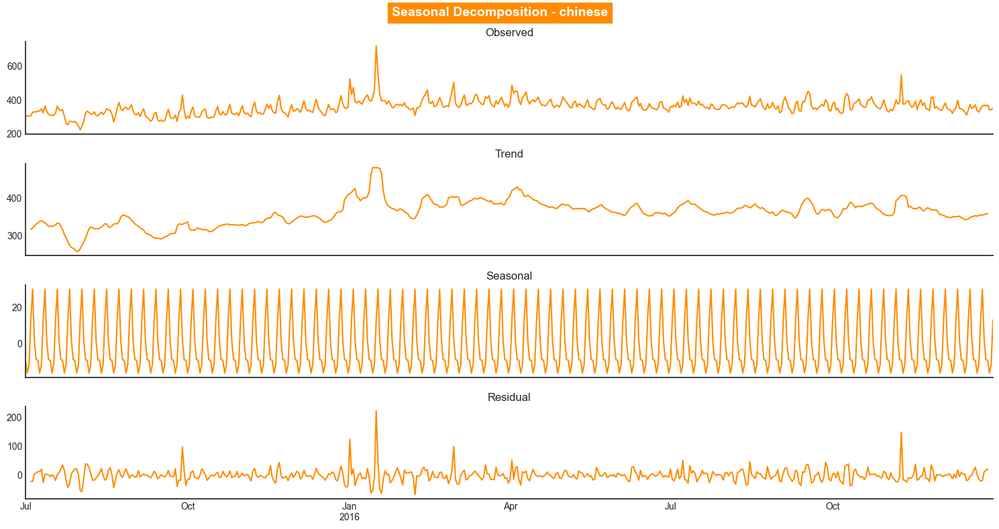

📊 Plotting ACF and PACF...


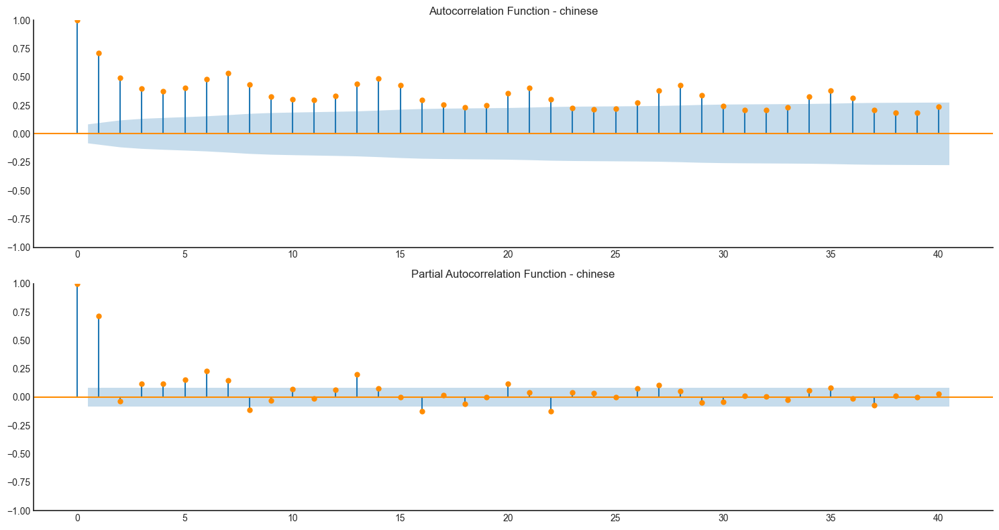

🔤 LANGUAGE    :   english

🔍 Analyzing Time Series: english
Checking stationarity...

Differencing 0 time(s):
ADF Statistic: -2.4757
p-value: 0.1215
❌ The time series is NON-stationary.

Differencing 1 time(s):
ADF Statistic: -8.2874
p-value: 0.0000
✅ The time series is STATIONARY.

📉 Decomposing the time series...


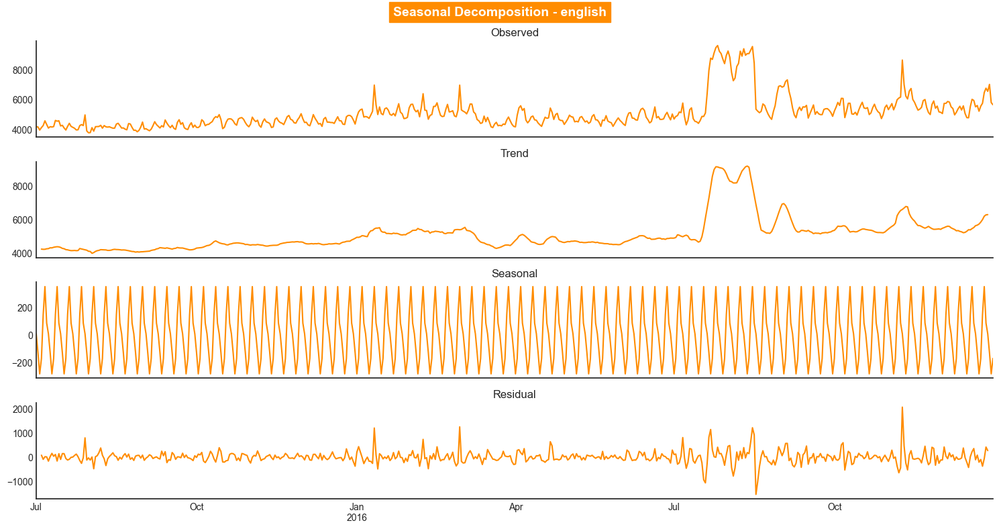

📊 Plotting ACF and PACF...


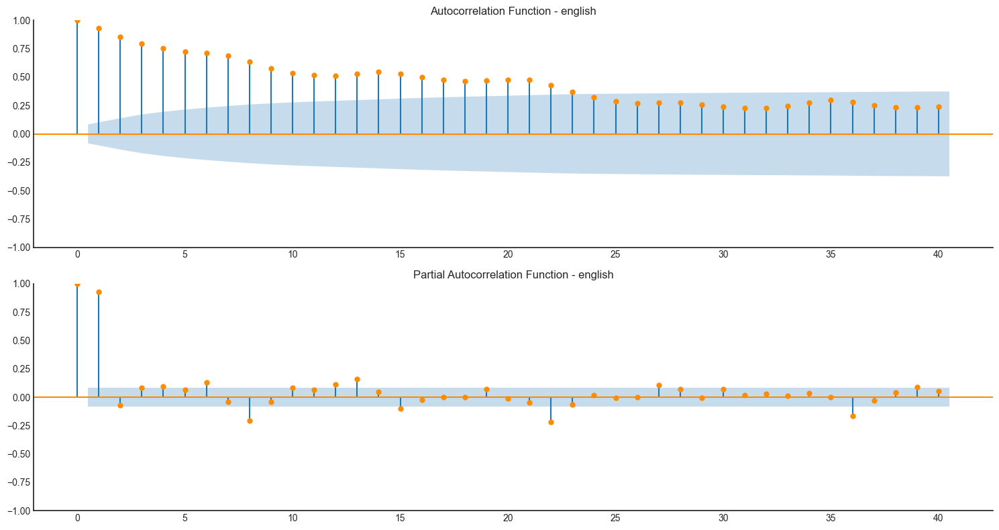

🔤 LANGUAGE    :   french

🔍 Analyzing Time Series: french
Checking stationarity...

Differencing 0 time(s):
ADF Statistic: -3.0830
p-value: 0.0278
✅ The time series is STATIONARY.

📉 Decomposing the time series...


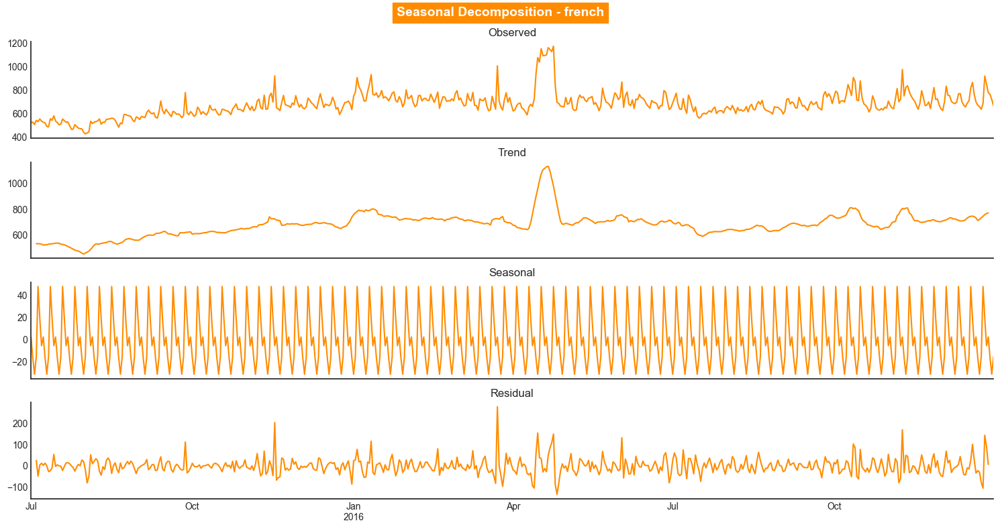

📊 Plotting ACF and PACF...


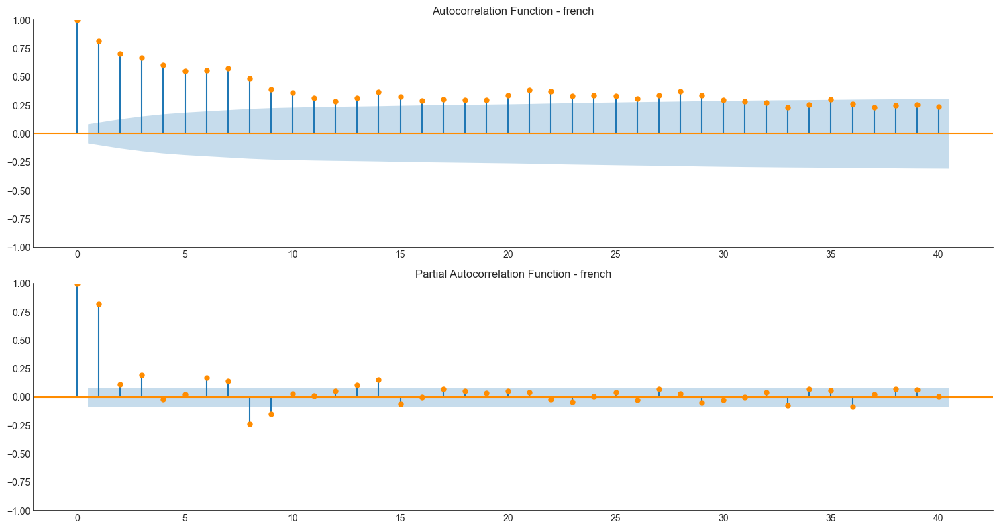

🔤 LANGUAGE    :   german

🔍 Analyzing Time Series: german
Checking stationarity...

Differencing 0 time(s):
ADF Statistic: -2.4508
p-value: 0.1279
❌ The time series is NON-stationary.

Differencing 1 time(s):
ADF Statistic: -7.1660
p-value: 0.0000
✅ The time series is STATIONARY.

📉 Decomposing the time series...


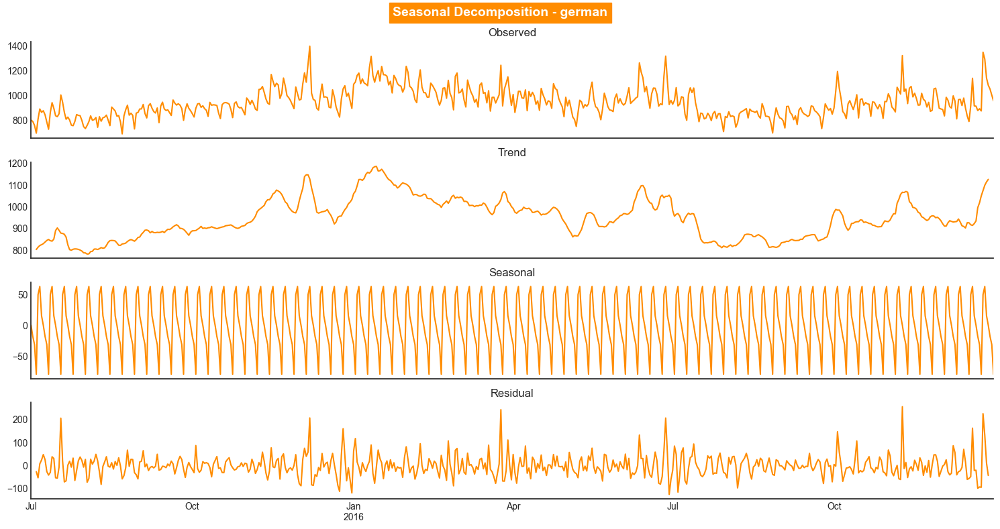

📊 Plotting ACF and PACF...


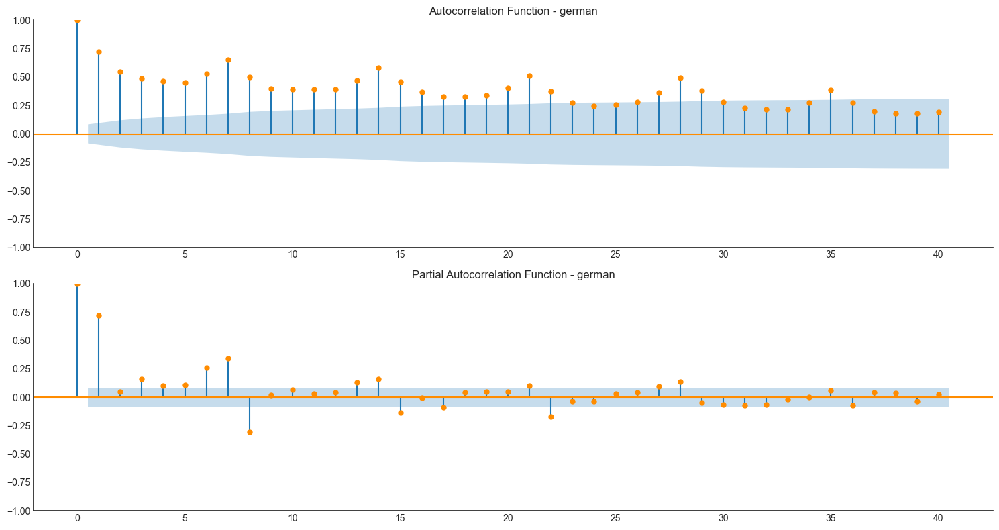

🔤 LANGUAGE    :   japanese

🔍 Analyzing Time Series: japanese
Checking stationarity...

Differencing 0 time(s):
ADF Statistic: -2.8695
p-value: 0.0490
✅ The time series is STATIONARY.

📉 Decomposing the time series...


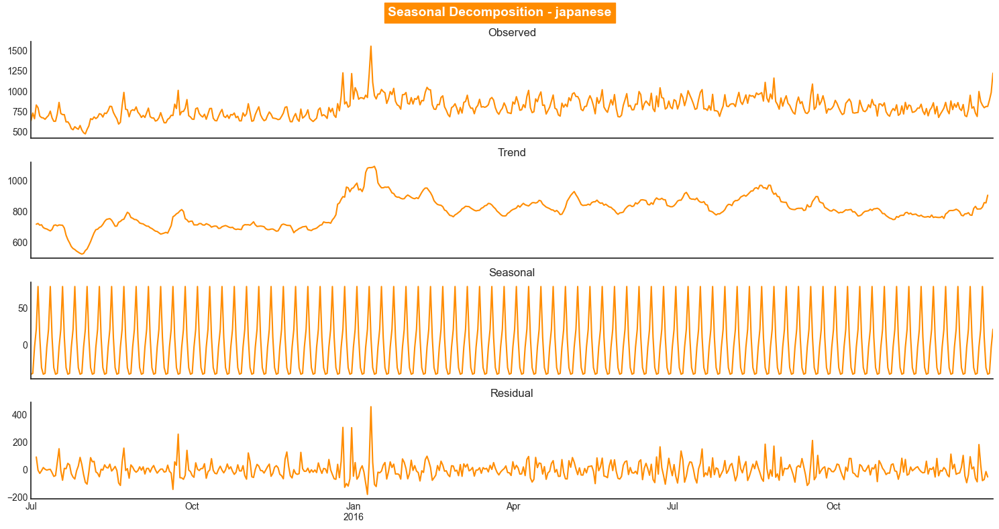

📊 Plotting ACF and PACF...


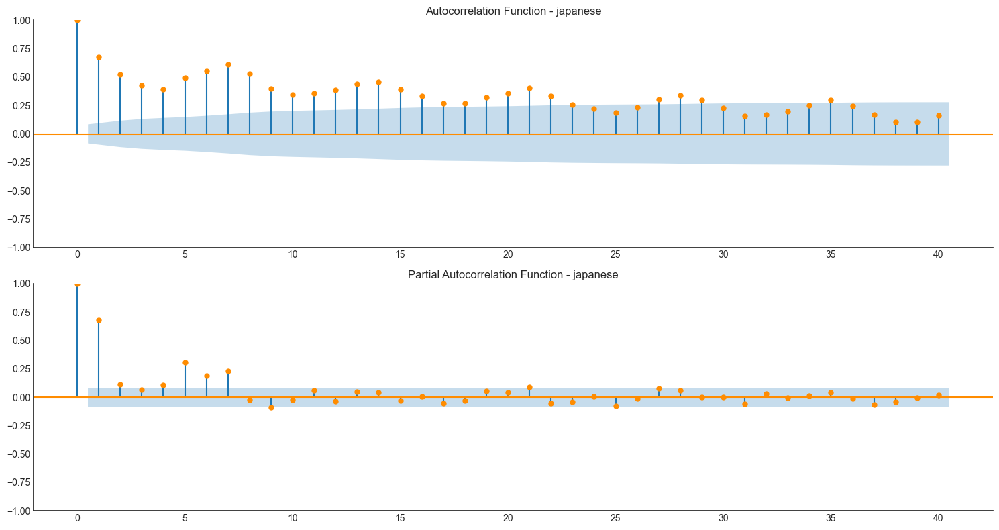

🔤 LANGUAGE    :   russian

🔍 Analyzing Time Series: russian
Checking stationarity...

Differencing 0 time(s):
ADF Statistic: -3.9769
p-value: 0.0015
✅ The time series is STATIONARY.

📉 Decomposing the time series...


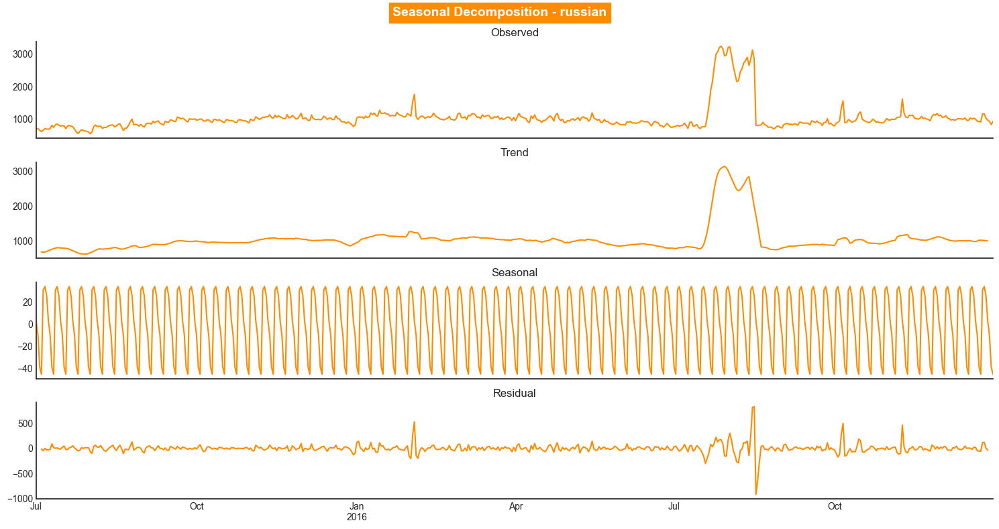

📊 Plotting ACF and PACF...


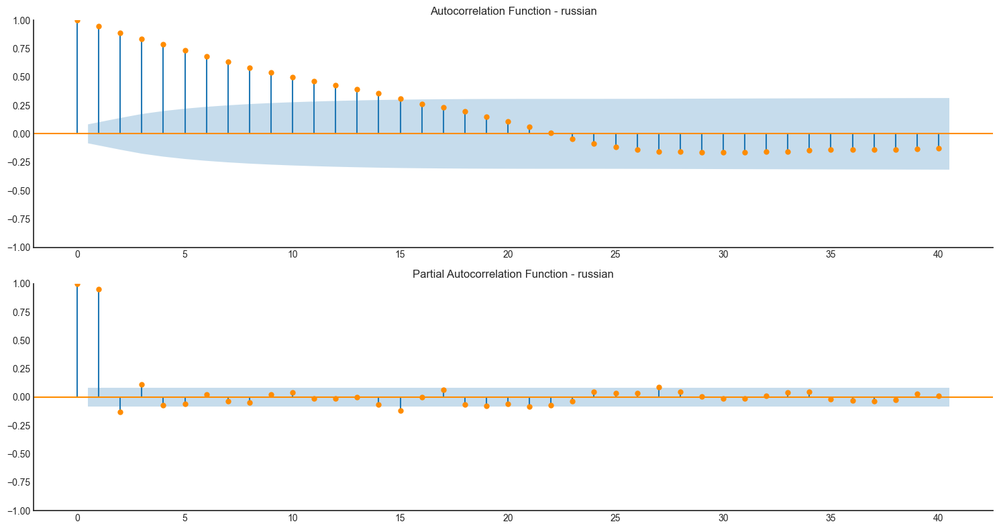

🔤 LANGUAGE    :   spanish

🔍 Analyzing Time Series: spanish
Checking stationarity...

Differencing 0 time(s):
ADF Statistic: -2.9521
p-value: 0.0396
✅ The time series is STATIONARY.

📉 Decomposing the time series...


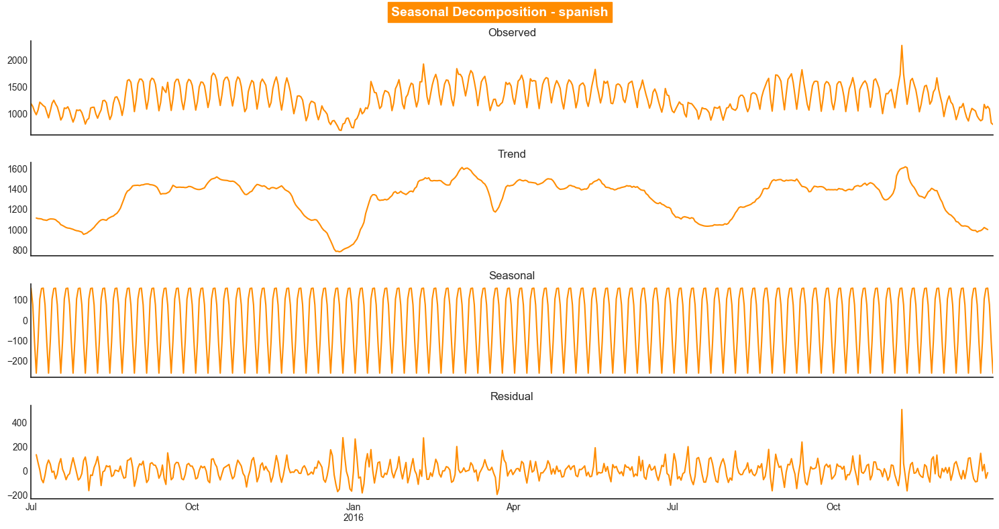

📊 Plotting ACF and PACF...


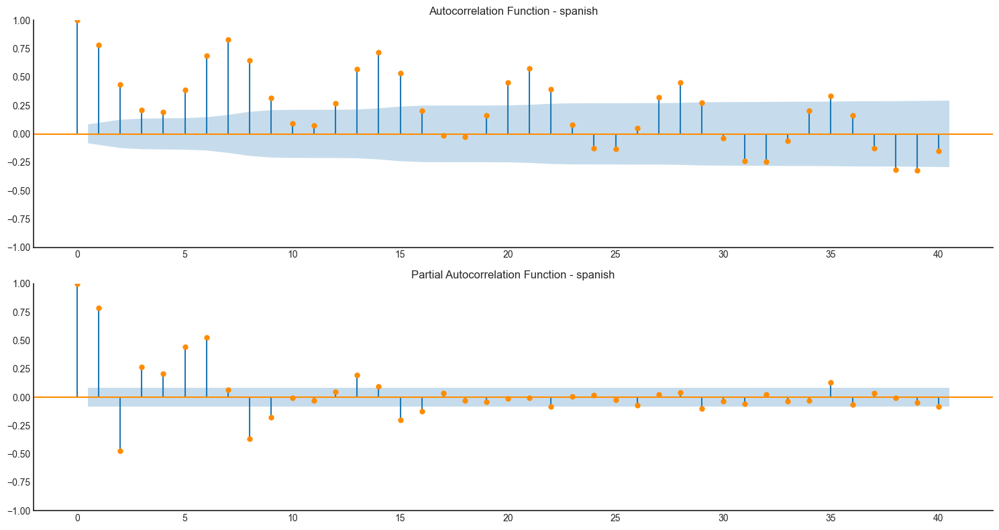

🔤 LANGUAGE    :   unknown language

🔍 Analyzing Time Series: unknown language
Checking stationarity...

Differencing 0 time(s):
ADF Statistic: -3.9650
p-value: 0.0016
✅ The time series is STATIONARY.

📉 Decomposing the time series...


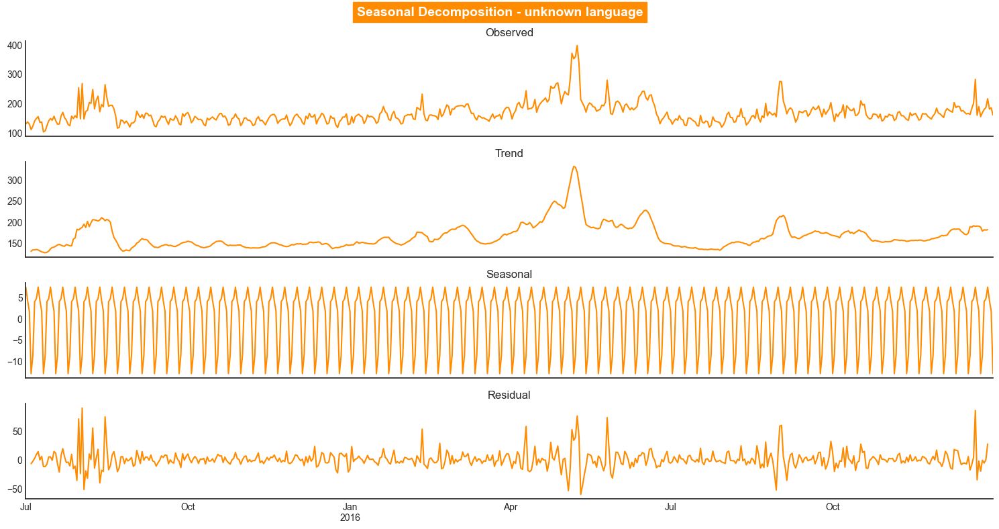

📊 Plotting ACF and PACF...


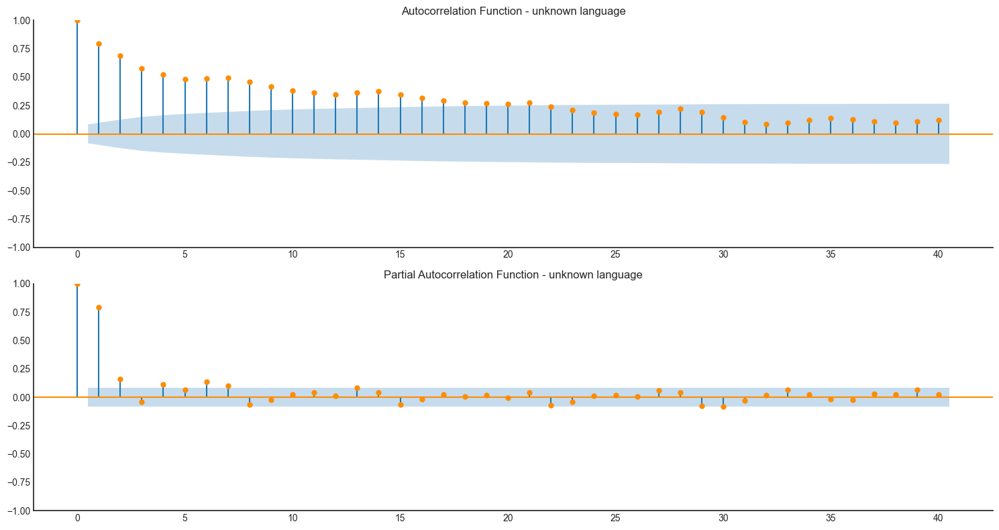

In [ ]:
for lang in agg_TS_data.columns:
    print('='*50)
    print(f'🔤 LANGUAGE    :   {lang}')
    print('='*50)
    analyze_timeseries(agg_TS_data[lang], lags=40, model='additive', title=lang)


> 👍🏼Now that the data is stationary, we can use the ARIMA, SARIMA, and SARIMAX model to forecast future values.

* After 1 differentiation  , time series becomes stationary.
* Thus for ARIMA models , we can set d = 1

## 📳MODEL BUILDING:

## 🔶ARIMA:
## 🔶SARIMA:
## 🔶SARIMAX:




In [188]:
from sklearn.metrics import (
    mean_squared_error as mse,
    mean_absolute_error as mae, 
    mean_absolute_percentage_error as mape
)

# Creating a function to print values of all these metrics.
def model_performance(actual, predicted):
    print('MAE :', round(mae(actual, predicted), 3))
    print('RMSE :', round(mse(actual, predicted)**0.5, 3)) 
    print('MAPE:', round(mape(actual, predicted)*100, 3),'%')

### Exponential Smoothing:

🔤 LANGUAGE    :   chinese

--- Forecasting for Language: chinese ---
MAE : 12.694
RMSE : 15.057
MAPE: 3.64 %


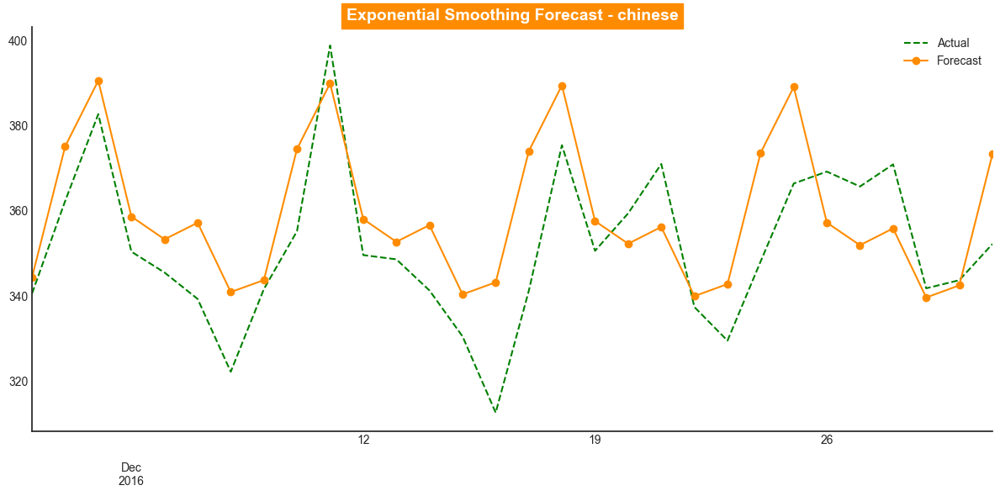

🔤 LANGUAGE    :   english

--- Forecasting for Language: english ---
MAE : 436.292
RMSE : 619.482
MAPE: 7.254 %


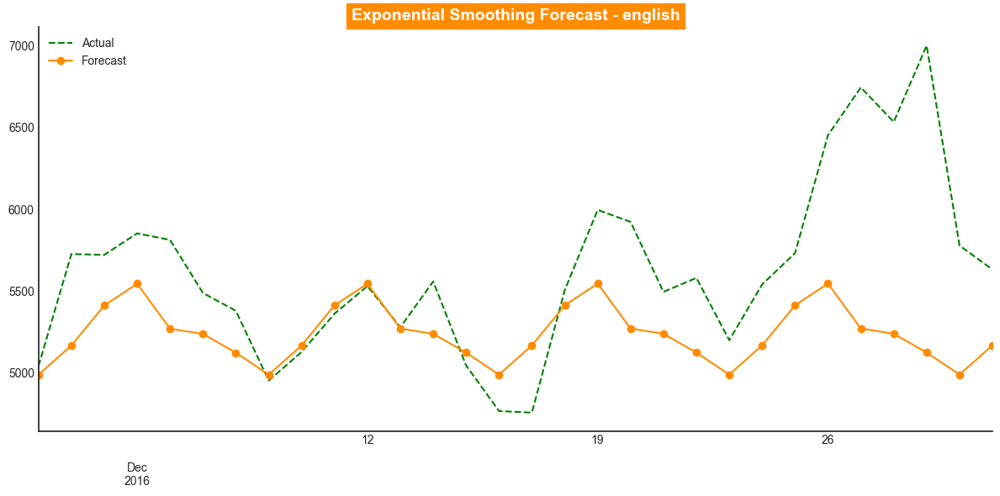

🔤 LANGUAGE    :   french

--- Forecasting for Language: french ---
MAE : 70.751
RMSE : 91.616
MAPE: 9.074 %


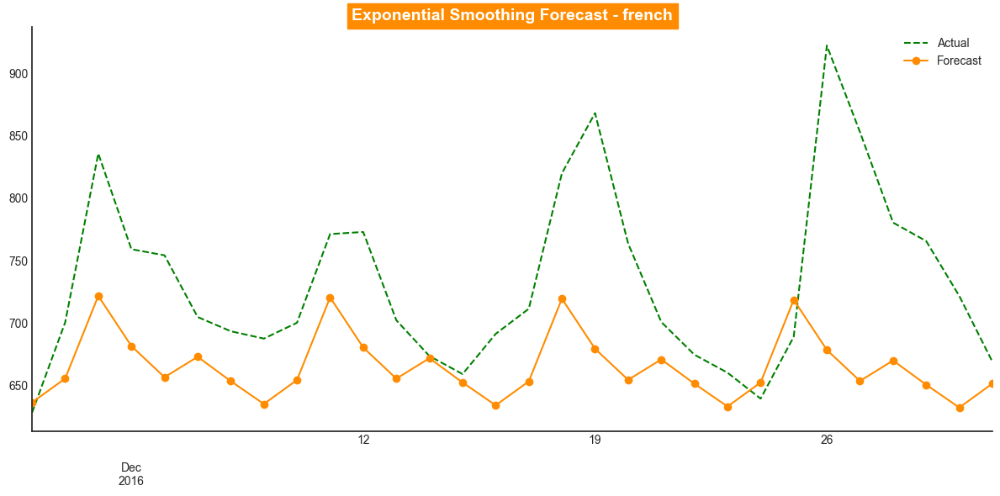

🔤 LANGUAGE    :   german

--- Forecasting for Language: german ---
MAE : 74.864
RMSE : 117.836
MAPE: 6.921 %


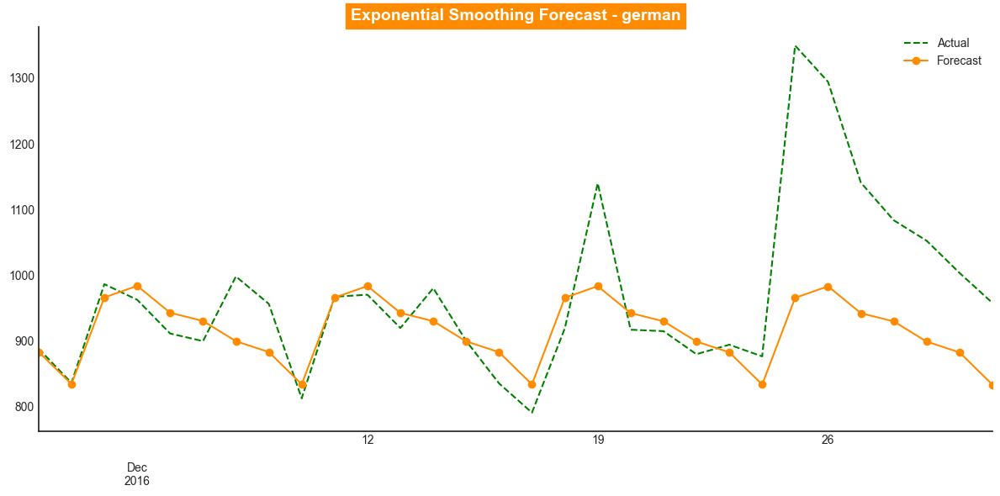

🔤 LANGUAGE    :   japanese

--- Forecasting for Language: japanese ---
MAE : 79.203
RMSE : 124.376
MAPE: 8.655 %


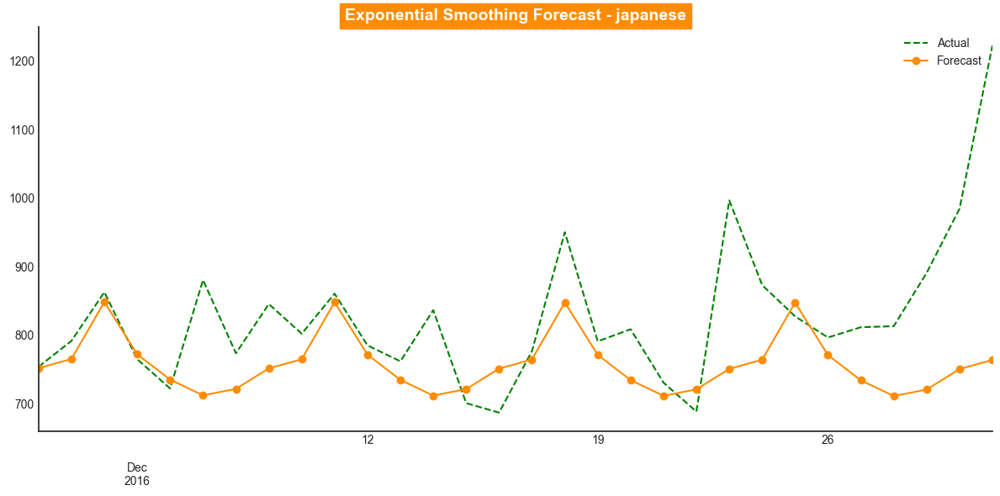

🔤 LANGUAGE    :   russian

--- Forecasting for Language: russian ---
MAE : 124.358
RMSE : 136.131
MAPE: 12.84 %


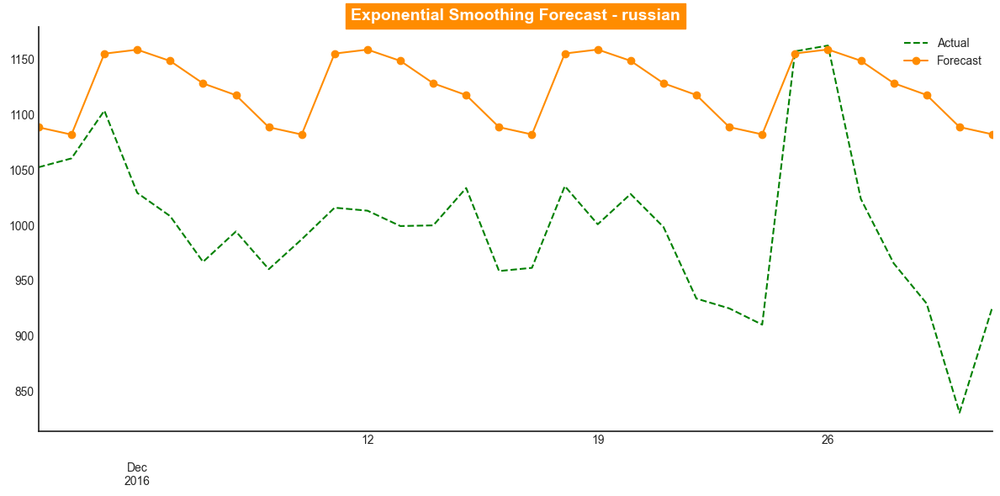

🔤 LANGUAGE    :   spanish

--- Forecasting for Language: spanish ---
MAE : 214.387
RMSE : 236.39
MAPE: 20.959 %


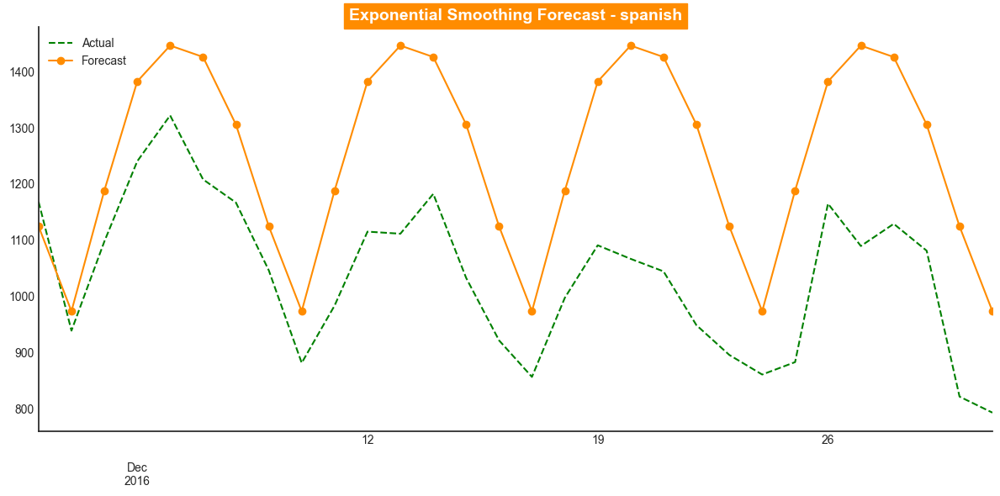

🔤 LANGUAGE    :   unknown language

--- Forecasting for Language: unknown language ---
MAE : 20.987
RMSE : 29.804
MAPE: 10.761 %


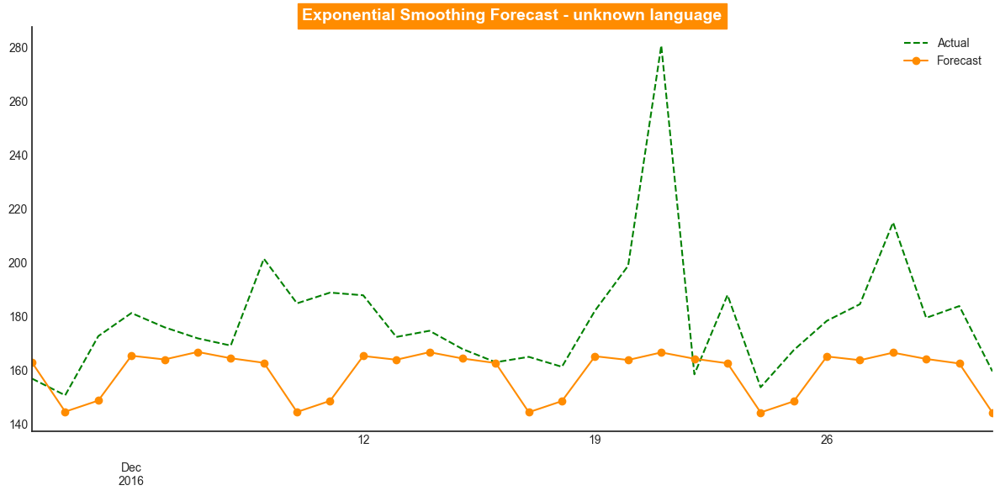

In [192]:
# Loop through each language column in the DataFrame
for lang in agg_TS_data.columns:
    print('='*50)
    print(f'🔤 LANGUAGE    :   {lang}')
    print(f"\n--- Forecasting for Language: {lang} ---")
    print('='*50)
    TS_lang = agg_TS_data[lang].copy()
    
    # Drop all-NaN or too short series if needed
    if TS_lang.dropna().shape[0] < 40:
        print(f"Not enough data for {lang}. Skipping...")
        continue

    # Train-test split
    X_train = TS_lang.loc[TS_lang.index < TS_lang.index[-30]].copy()
    X_test = TS_lang.loc[TS_lang.index >= TS_lang.index[-30]].copy()

    # Fit the model
    try:
        model = sm.tsa.ExponentialSmoothing(
            X_train,
            trend="add",
            damped_trend=True,
            seasonal="add",
            seasonal_periods=7  # you can adjust this based on observed seasonality
        ).fit(
            smoothing_level=None,
            smoothing_trend=None,
            smoothing_seasonal=None
        )
    except Exception as e:
        print(f"Error fitting model for {lang}: {e}")
        continue

    # Forecast
    Pred = model.forecast(steps=30)

    # Evaluate
    model_performance(X_test, Pred)

    # Plotting
    plt.figure(figsize=(12, 6))
    X_test.plot(style="--", label="Actual", color='green')
    Pred.plot(style="-o", label="Forecast", color=DARK_ORANGE)
    plt.title(f"Exponential Smoothing Forecast - {lang}",fontsize=14, fontweight='bold',
                 backgroundcolor=DARK_ORANGE, color='white')
    plt.legend()
    plt.tight_layout()
    sns.despine()
    plt.show()



--- Forecasting for Language: chinese ---
MAE : 12.694
RMSE : 15.057
MAPE: 3.64 %


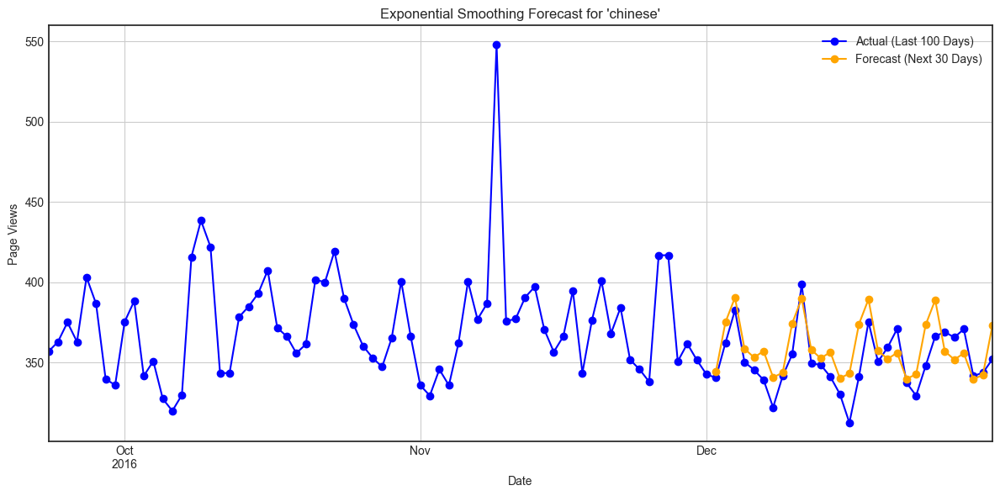


--- Forecasting for Language: english ---
MAE : 436.292
RMSE : 619.482
MAPE: 7.254 %


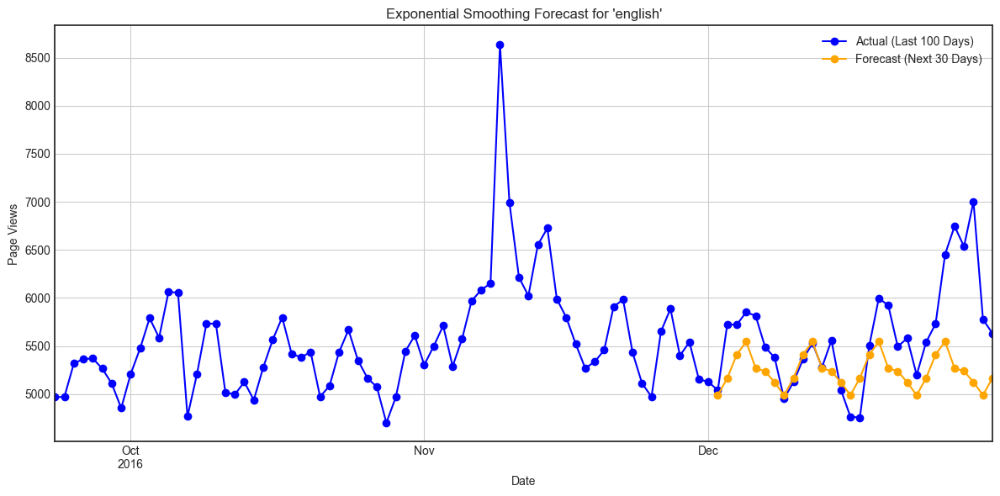


--- Forecasting for Language: french ---
MAE : 70.751
RMSE : 91.616
MAPE: 9.074 %


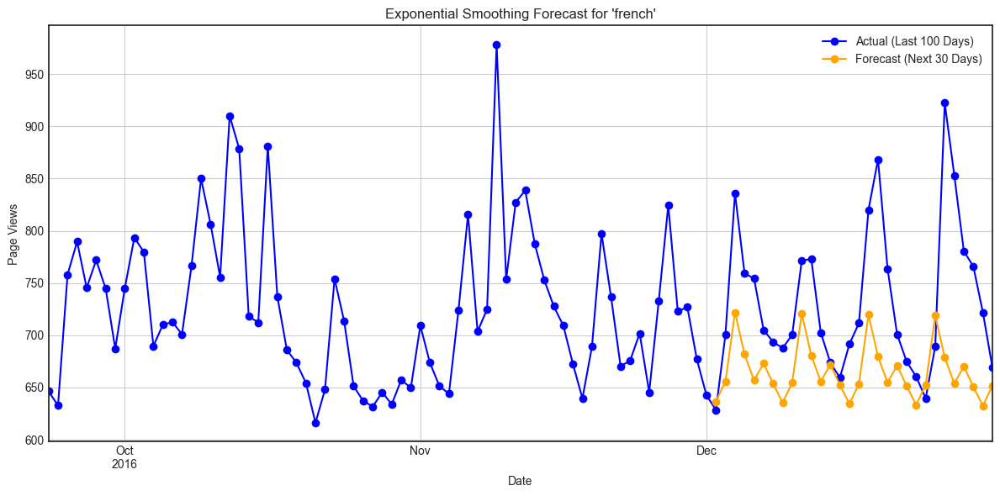


--- Forecasting for Language: german ---
MAE : 74.864
RMSE : 117.836
MAPE: 6.921 %


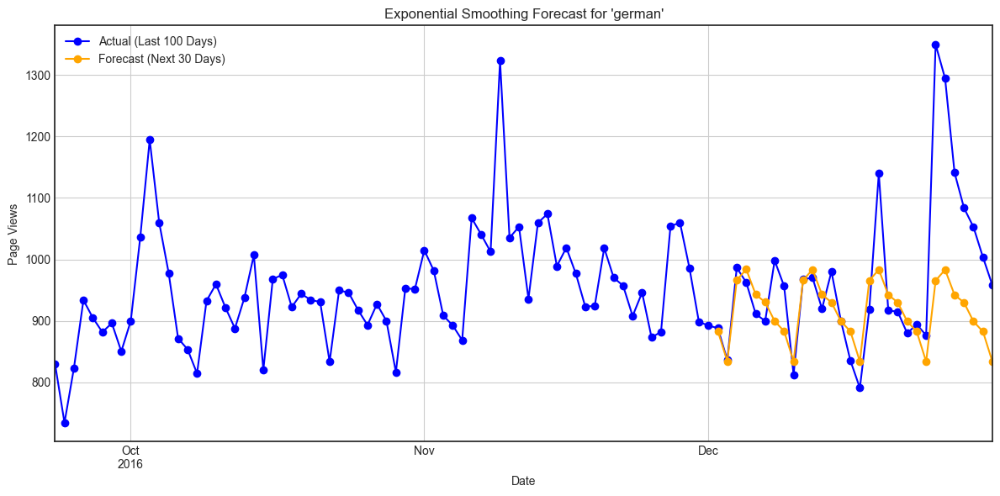


--- Forecasting for Language: japanese ---
MAE : 79.203
RMSE : 124.376
MAPE: 8.655 %


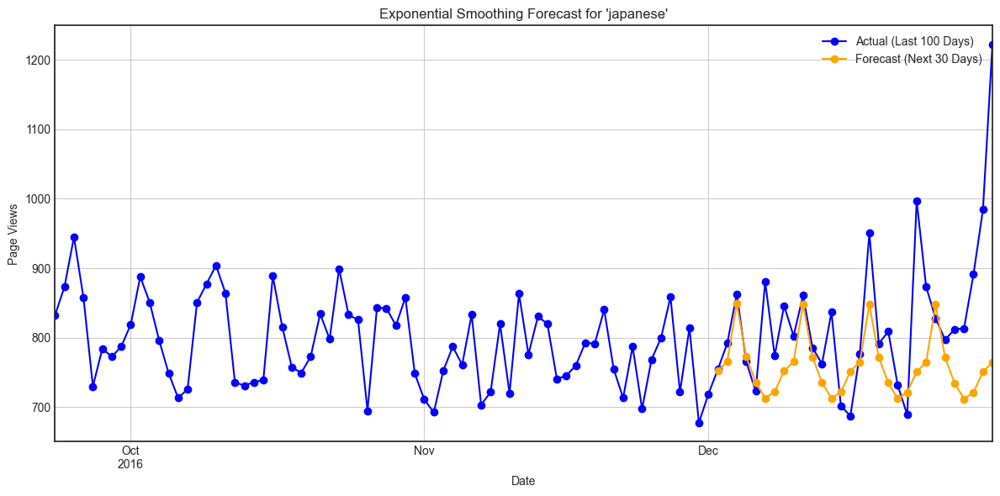


--- Forecasting for Language: russian ---
MAE : 124.358
RMSE : 136.131
MAPE: 12.84 %


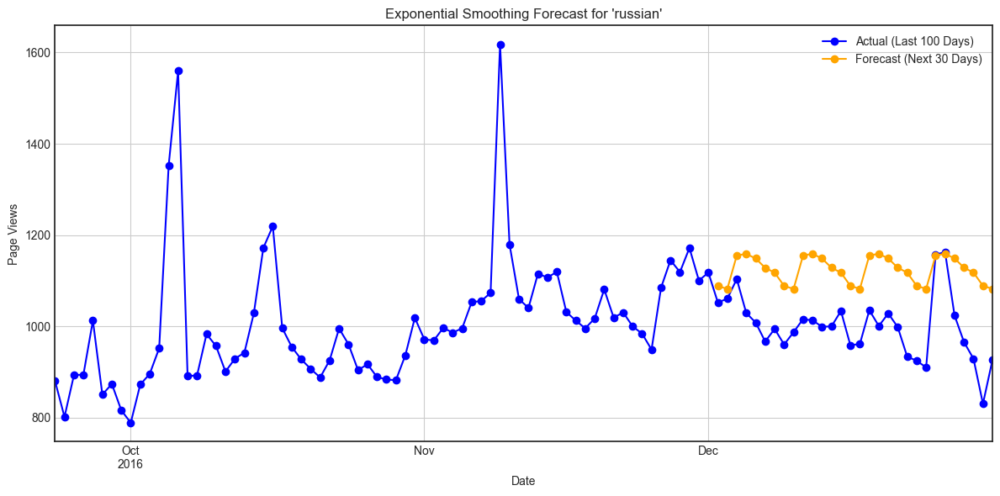


--- Forecasting for Language: spanish ---
MAE : 214.387
RMSE : 236.39
MAPE: 20.959 %


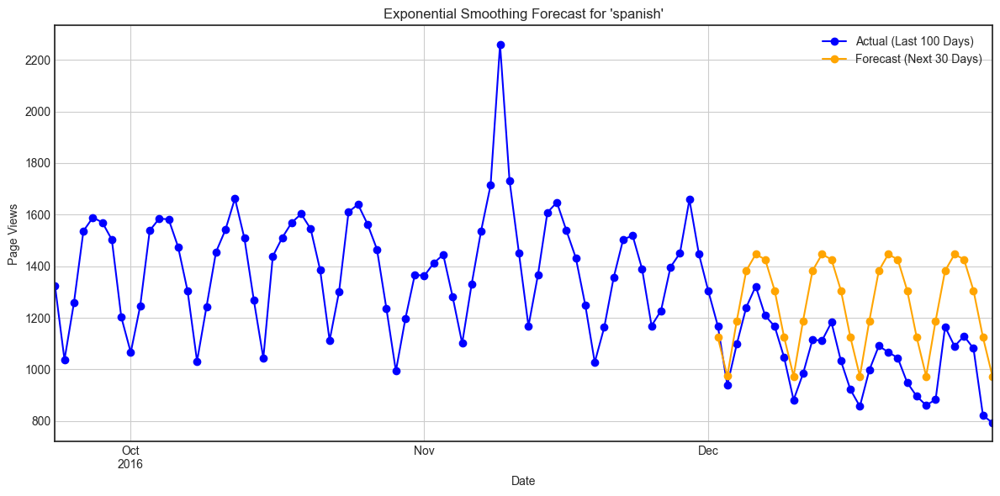


--- Forecasting for Language: unknown language ---
MAE : 20.987
RMSE : 29.804
MAPE: 10.761 %


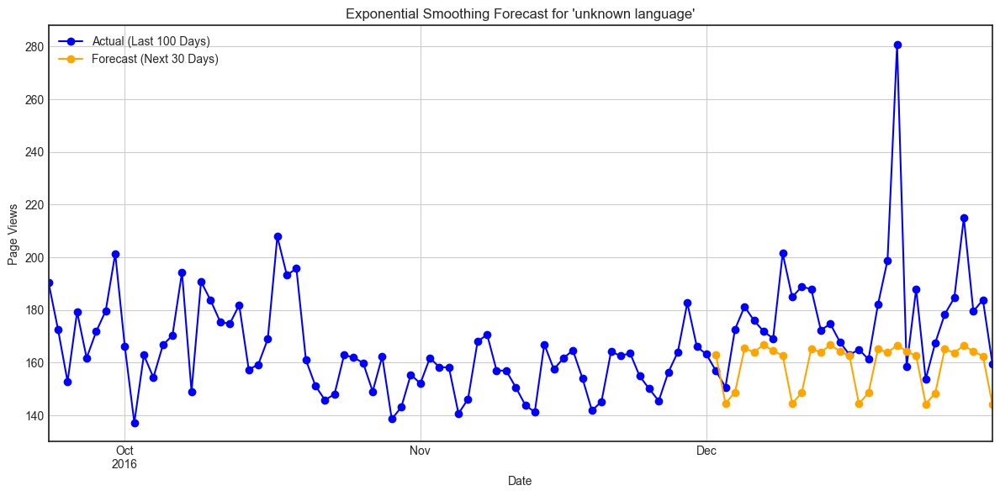

In [193]:
for lang in agg_TS_data.columns:
    print(f"\n--- Forecasting for Language: {lang} ---")
    
    TS_lang = agg_TS_data[lang].copy()

    # Skip languages with insufficient data
    if TS_lang.dropna().shape[0] < 40:
        print(f"Not enough data for {lang}. Skipping...")
        continue

    # Train-test split
    X_train = TS_lang.loc[TS_lang.index < TS_lang.index[-30]].copy()
    X_test = TS_lang.loc[TS_lang.index >= TS_lang.index[-30]].copy()

    try:
        # Fit model
        model = sm.tsa.ExponentialSmoothing(
            X_train,
            trend="add",
            damped_trend=True,
            seasonal="add",
            seasonal_periods=7  # adjust as needed
        ).fit(
            smoothing_level=None,
            smoothing_trend=None,
            smoothing_seasonal=None
        )
    except Exception as e:
        print(f"Model fitting failed for {lang}: {e}")
        continue

    # Forecast
    forecast = model.forecast(steps=30)

    # Evaluation
    model_performance(X_test, forecast)

    # Plot last 100 points + forecast
    plt.figure(figsize=(12, 6))
    TS_lang.tail(100).plot(style='-o', label='Actual (Last 100 Days)', color='blue')
    forecast.plot(style='-o', label='Forecast (Next 30 Days)', color='orange')
    plt.title(f"Exponential Smoothing Forecast for '{lang}'")
    plt.xlabel("Date")
    plt.ylabel("Page Views")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


🔤 LANGUAGE    :   chinese
--- Forecasting for Language: chinese ---
MAE : 12.694
RMSE : 15.057
MAPE: 3.64 %


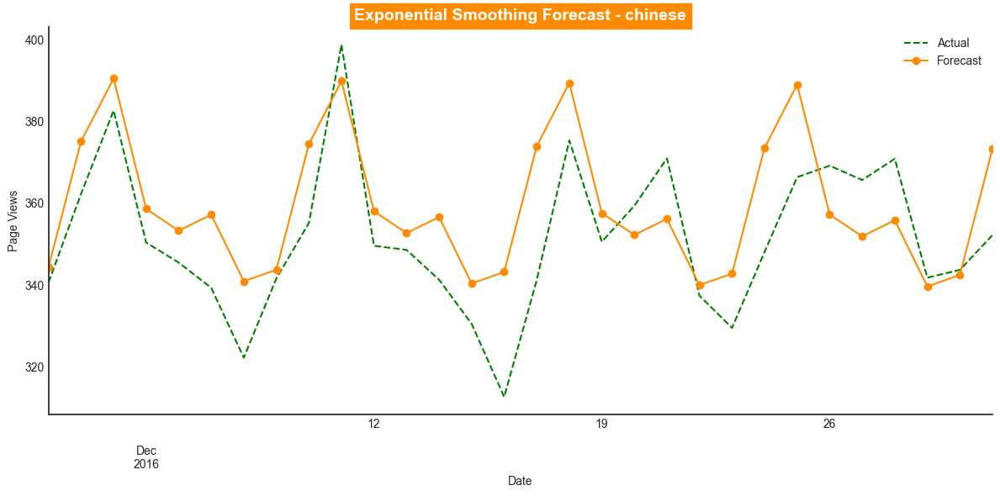

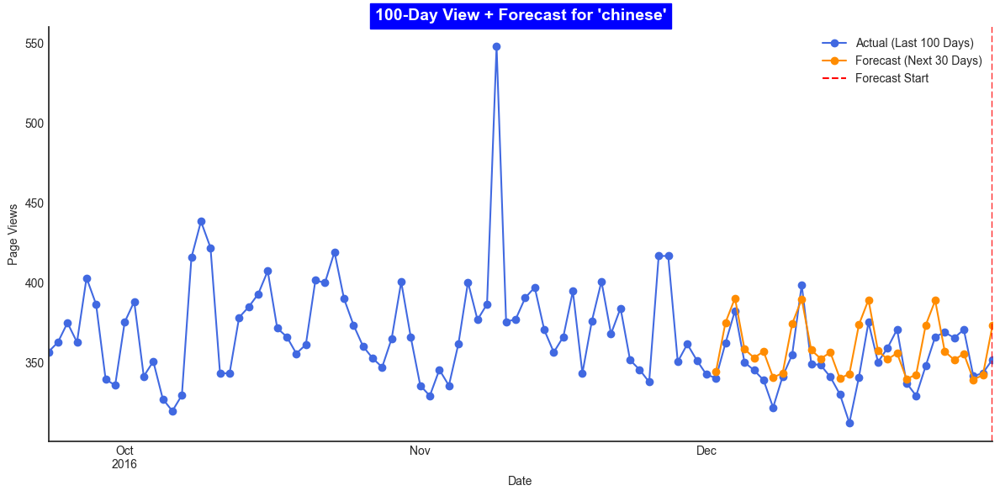

🔤 LANGUAGE    :   english
--- Forecasting for Language: english ---
MAE : 436.292
RMSE : 619.482
MAPE: 7.254 %


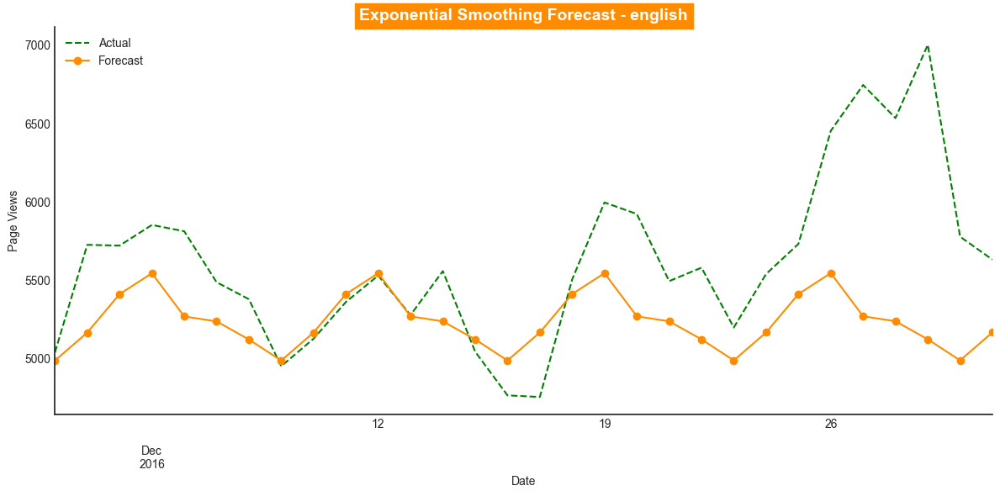

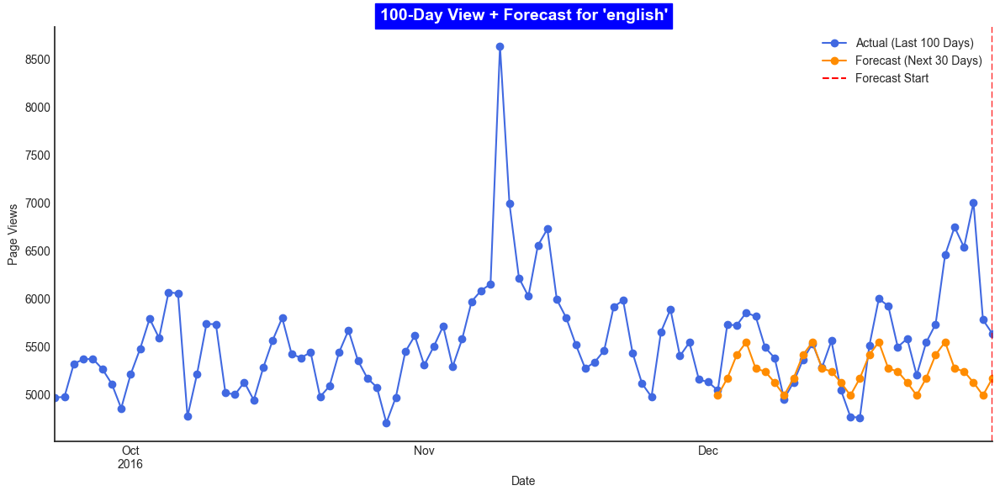

🔤 LANGUAGE    :   french
--- Forecasting for Language: french ---
MAE : 70.751
RMSE : 91.616
MAPE: 9.074 %


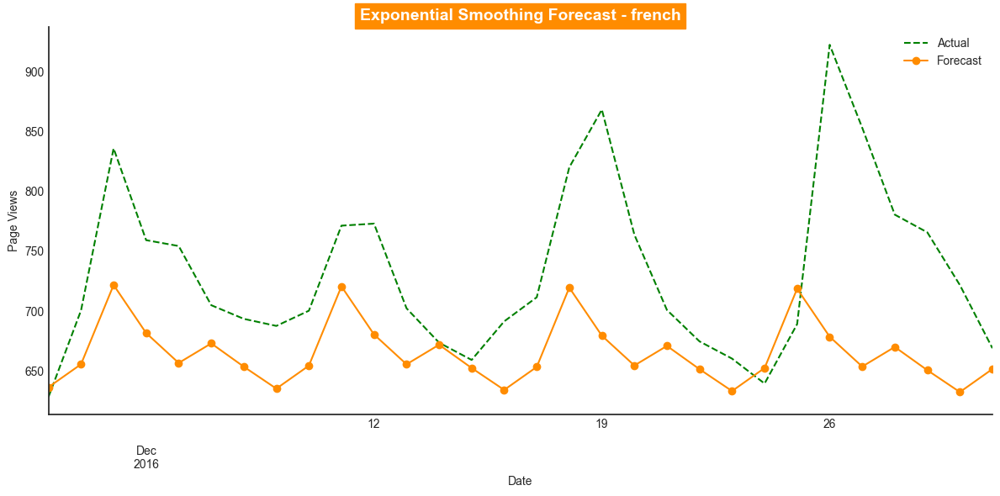

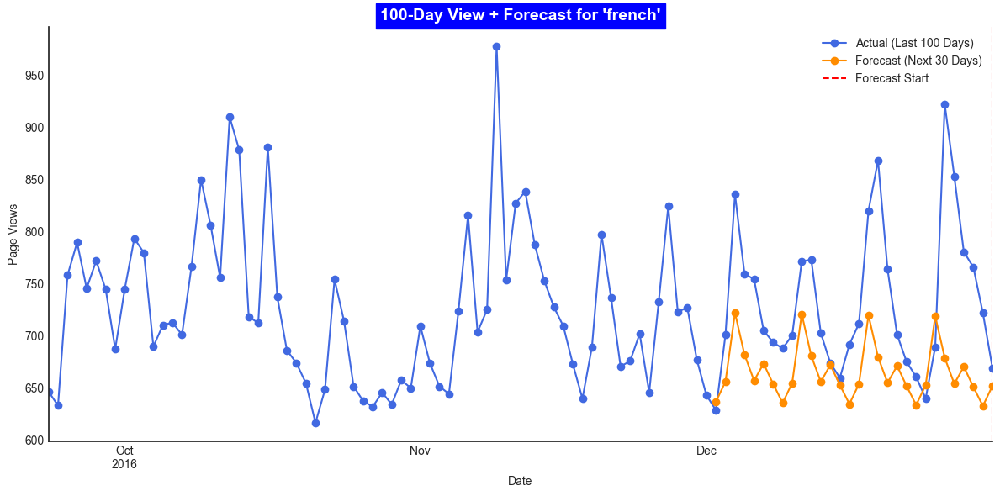

🔤 LANGUAGE    :   german
--- Forecasting for Language: german ---
MAE : 74.864
RMSE : 117.836
MAPE: 6.921 %


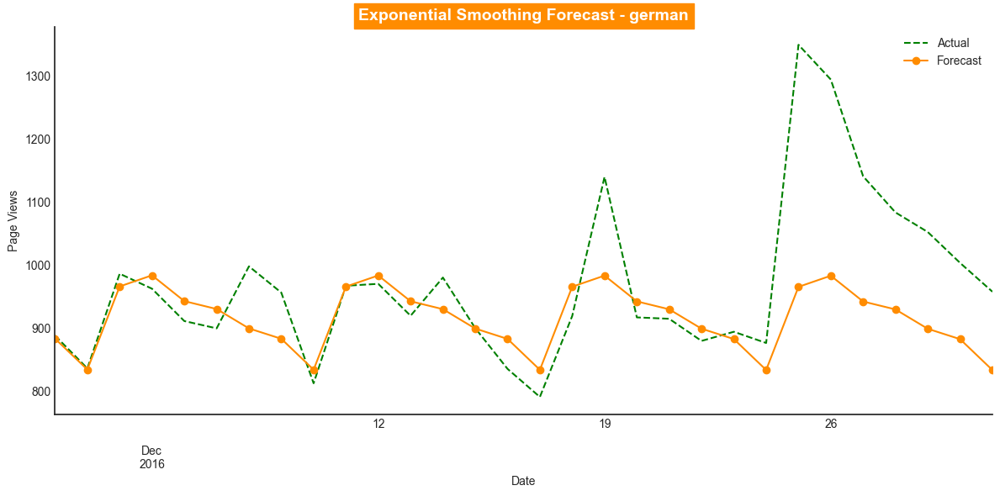

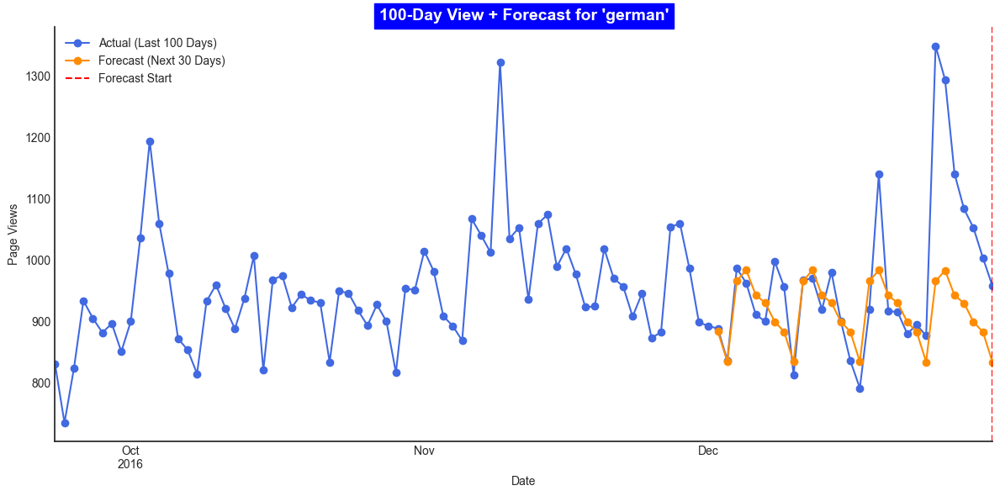

🔤 LANGUAGE    :   japanese
--- Forecasting for Language: japanese ---
MAE : 79.203
RMSE : 124.376
MAPE: 8.655 %


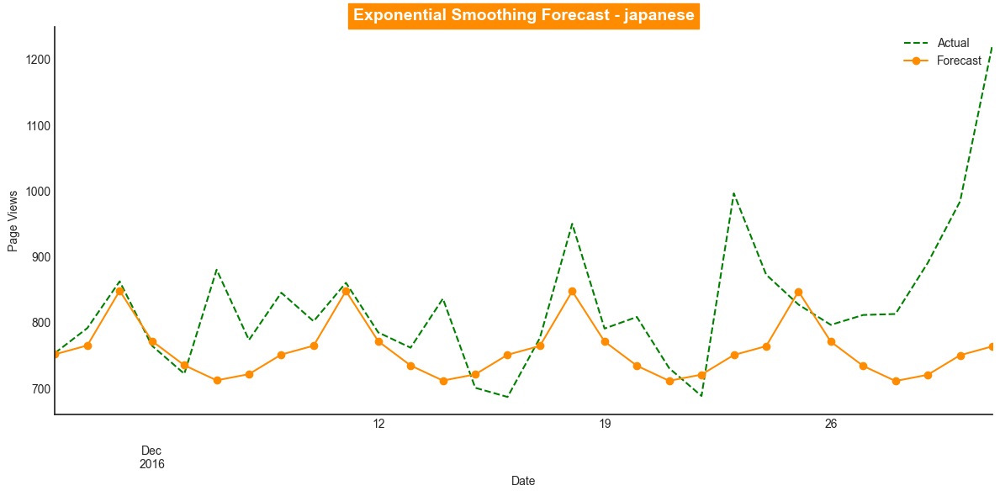

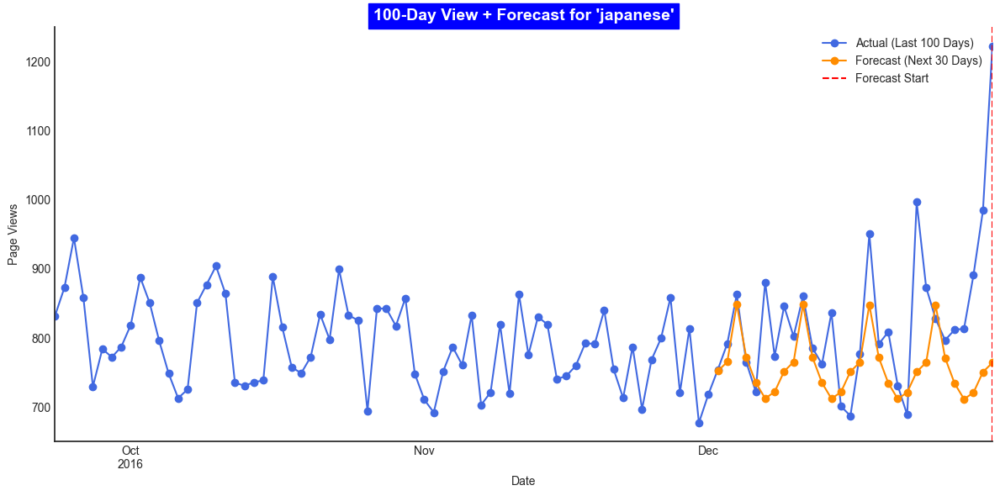

🔤 LANGUAGE    :   russian
--- Forecasting for Language: russian ---
MAE : 124.358
RMSE : 136.131
MAPE: 12.84 %


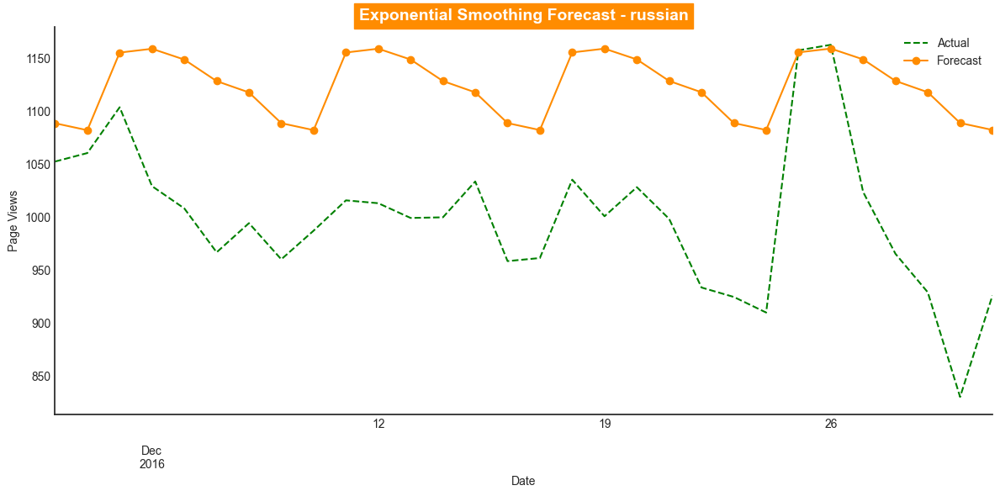

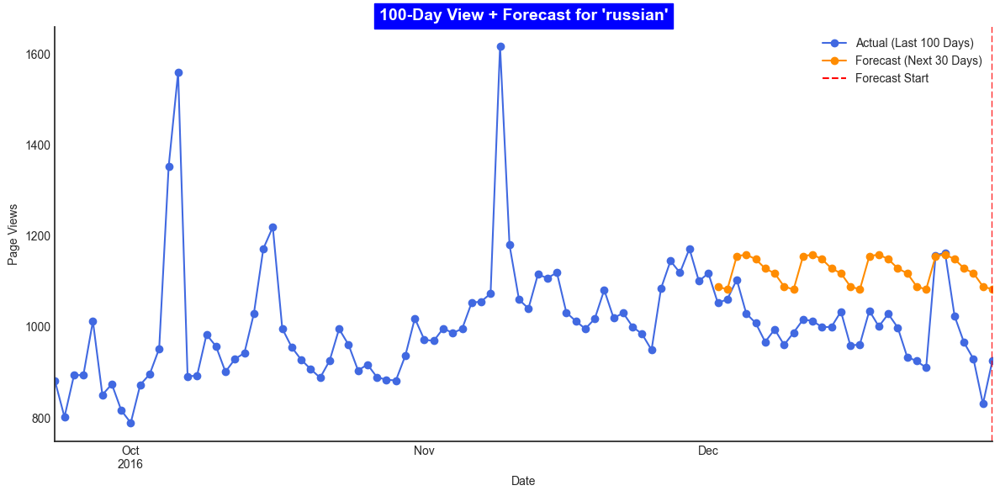

🔤 LANGUAGE    :   spanish
--- Forecasting for Language: spanish ---
MAE : 214.387
RMSE : 236.39
MAPE: 20.959 %


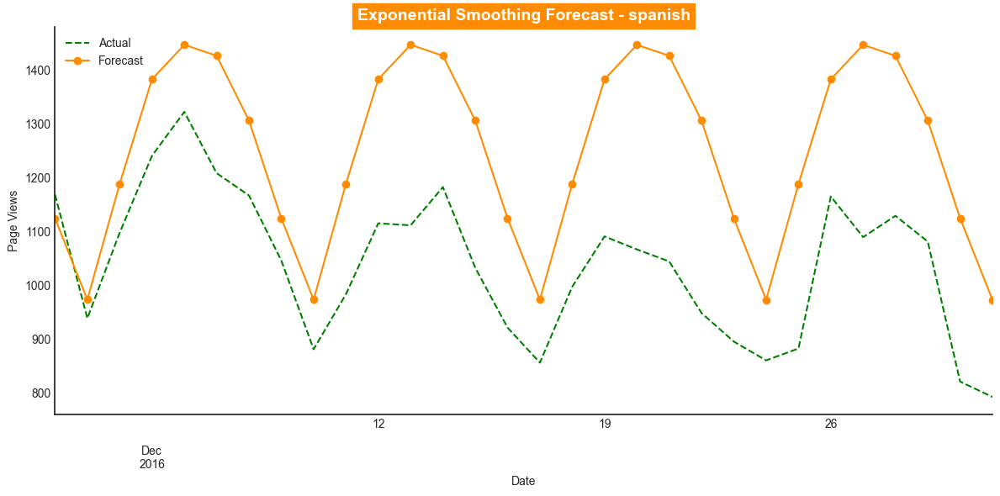

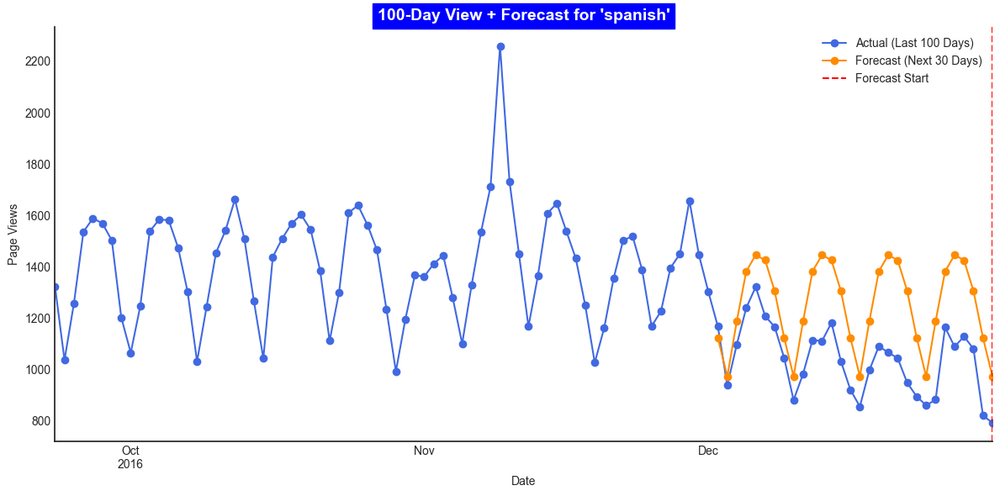

🔤 LANGUAGE    :   unknown language
--- Forecasting for Language: unknown language ---
MAE : 20.987
RMSE : 29.804
MAPE: 10.761 %


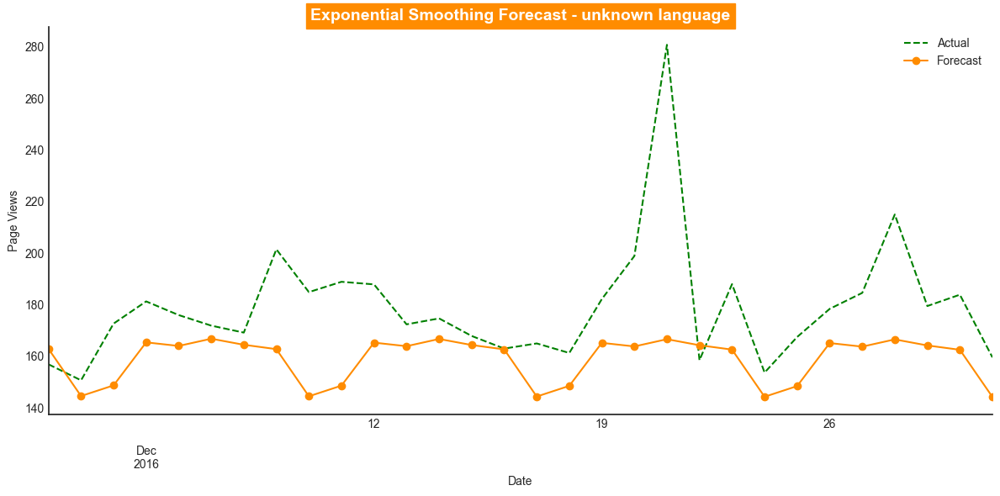

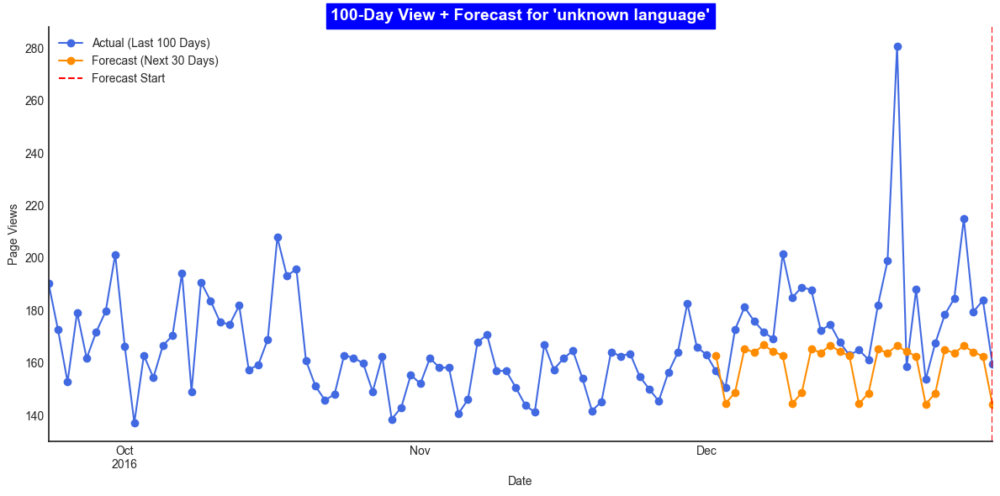

In [200]:
DARK_ORANGE = '#FF8C00'

# Loop through each language
for lang in agg_TS_data.columns:
    print('='*50)
    print(f'🔤 LANGUAGE    :   {lang}')
    print(f"--- Forecasting for Language: {lang} ---")
    print('='*50)
    
    TS_lang = agg_TS_data[lang].copy()

    # Skip if too short
    if TS_lang.dropna().shape[0] < 40:
        print(f"Not enough data for {lang}. Skipping...")
        continue

    # Train-test split
    X_train = TS_lang.loc[TS_lang.index < TS_lang.index[-30]].copy()
    X_test = TS_lang.loc[TS_lang.index >= TS_lang.index[-30]].copy()

    # Fit model
    try:
        model = sm.tsa.ExponentialSmoothing(
            X_train,
            trend="add",
            damped_trend=True,
            seasonal="add",
            seasonal_periods=7
        ).fit()
    except Exception as e:
        print(f"❌ Error fitting model for {lang}: {e}")
        continue

    # Forecast
    Pred = model.forecast(steps=30)

    # Evaluation
    model_performance(X_test, Pred)

    # --- Plot 1: X_test vs Forecast ---
    plt.figure(figsize=(12, 6))
    X_test.plot(style="--", label="Actual", color='green')
    Pred.plot(style="-o", label="Forecast", color=DARK_ORANGE)
    plt.title(f"Exponential Smoothing Forecast - {lang}", fontsize=14, fontweight='bold',
              backgroundcolor=DARK_ORANGE, color='white')
    plt.xlabel("Date")
    plt.ylabel("Page Views")
    plt.legend()
    plt.tight_layout()
    sns.despine()
    plt.show()

    # --- Plot 2: Last 100 points of full series + Forecast ---
    plt.figure(figsize=(12, 6))
    TS_lang.tail(100).plot(style='-o', label='Actual (Last 100 Days)', color='Royalblue')
    Pred.plot(style='-o', label='Forecast (Next 30 Days)', color=DARK_ORANGE)
    plt.axvline(x=TS_lang.index[-1], color='red', linestyle='--', label='Forecast Start')
    plt.title(f"100-Day View + Forecast for '{lang}'", fontsize=14, fontweight='bold',
              backgroundcolor='blue', color='white')
    plt.xlabel("Date")
    plt.ylabel("Page Views")
    plt.legend()
    plt.tight_layout()
    sns.despine()
    plt.show()


🔤 LANGUAGE: chinese
MAE : 21.889
RMSE: 26.224
MAPE: 6.412
------------------------------

                               SARIMAX Results                                
Dep. Variable:                chinese   No. Observations:                  520
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2500.758
Date:                Sat, 19 Apr 2025   AIC                           5007.515
Time:                        23:21:50   BIC                           5020.271
Sample:                    07-01-2015   HQIC                          5012.513
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5404      0.041     13.246      0.000       0.460       0.620
ma.L1         -0.9560      0.017    -55.1

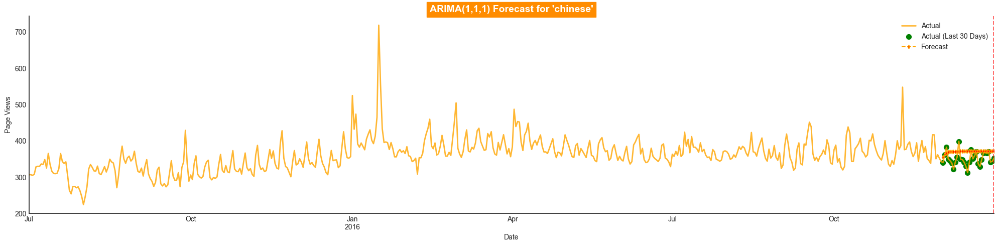

🔤 LANGUAGE: english
MAE : 385.406
RMSE: 527.938
MAPE: 6.646
------------------------------

                               SARIMAX Results                                
Dep. Variable:                english   No. Observations:                  520
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -3838.499
Date:                Sat, 19 Apr 2025   AIC                           7682.999
Time:                        23:21:52   BIC                           7695.754
Sample:                    07-01-2015   HQIC                          7687.996
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9022      0.022     40.553      0.000       0.859       0.946
ma.L1         -0.9848      0.009   -106

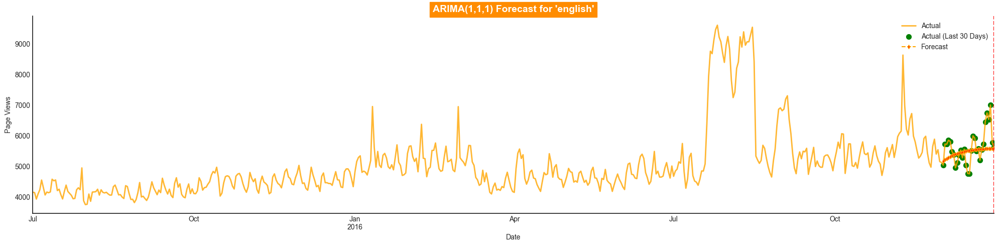

🔤 LANGUAGE: french
MAE : 54.876
RMSE: 75.287
MAPE: 7.051
------------------------------

                               SARIMAX Results                                
Dep. Variable:                 french   No. Observations:                  520
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2838.148
Date:                Sat, 19 Apr 2025   AIC                           5682.296
Time:                        23:21:53   BIC                           5695.051
Sample:                    07-01-2015   HQIC                          5687.293
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6764      0.028     24.486      0.000       0.622       0.731
ma.L1         -0.9500      0.013    -72.85

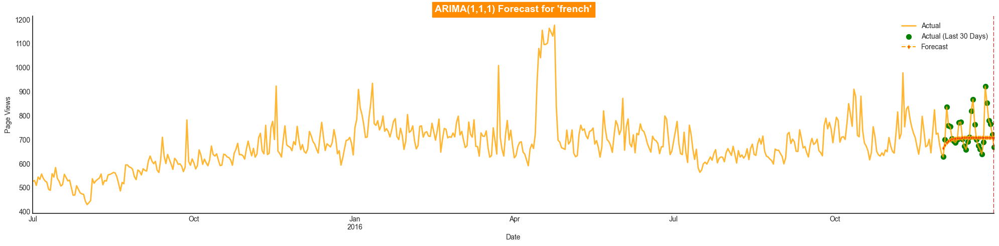

🔤 LANGUAGE: german
MAE : 87.133
RMSE: 125.782
MAPE: 8.544
------------------------------

                               SARIMAX Results                                
Dep. Variable:                 german   No. Observations:                  520
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2955.957
Date:                Sat, 19 Apr 2025   AIC                           5917.914
Time:                        23:21:54   BIC                           5930.670
Sample:                    07-01-2015   HQIC                          5922.911
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4378      0.046      9.436      0.000       0.347       0.529
ma.L1         -0.9044      0.026    -34.3

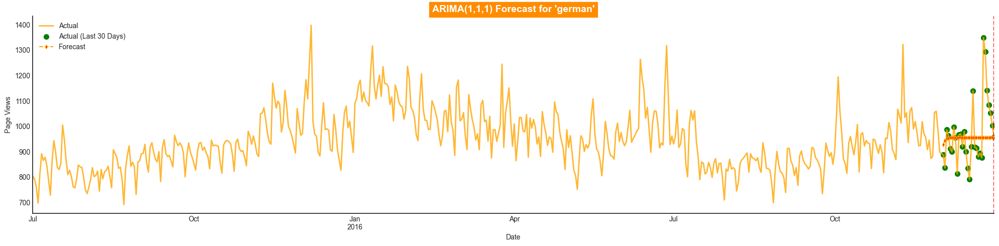

🔤 LANGUAGE: japanese
MAE : 85.685
RMSE: 125.502
MAPE: 9.465
------------------------------

                               SARIMAX Results                                
Dep. Variable:               japanese   No. Observations:                  520
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -3018.478
Date:                Sat, 19 Apr 2025   AIC                           6042.956
Time:                        23:21:55   BIC                           6055.712
Sample:                    07-01-2015   HQIC                          6047.954
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4024      0.044      9.170      0.000       0.316       0.488
ma.L1         -0.8957      0.025    -35

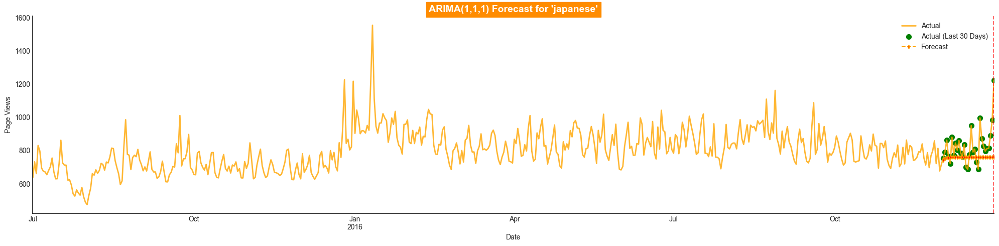

🔤 LANGUAGE: russian
MAE : 131.137
RMSE: 143.55
MAPE: 13.578
------------------------------

                               SARIMAX Results                                
Dep. Variable:                russian   No. Observations:                  520
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -3275.558
Date:                Sat, 19 Apr 2025   AIC                           6557.115
Time:                        23:21:56   BIC                           6569.871
Sample:                    07-01-2015   HQIC                          6562.113
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3878      0.196     -1.979      0.048      -0.772      -0.004
ma.L1          0.5339      0.198      2

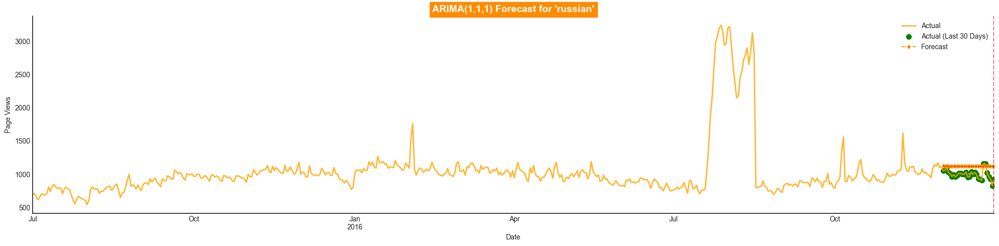

🔤 LANGUAGE: spanish
MAE : 273.932
RMSE: 303.74
MAPE: 28.52
------------------------------

                               SARIMAX Results                                
Dep. Variable:                spanish   No. Observations:                  520
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -3334.423
Date:                Sat, 19 Apr 2025   AIC                           6674.845
Time:                        23:21:57   BIC                           6687.601
Sample:                    07-01-2015   HQIC                          6679.842
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0309      0.082     -0.380      0.704      -0.191       0.129
ma.L1          0.5131      0.069      7.

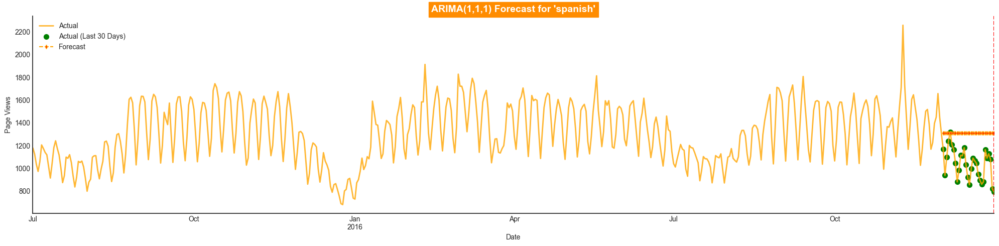

🔤 LANGUAGE: unknown language
MAE : 20.414
RMSE: 30.341
MAPE: 10.291
------------------------------

                               SARIMAX Results                                
Dep. Variable:       unknown language   No. Observations:                  520
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2307.422
Date:                Sat, 19 Apr 2025   AIC                           4620.843
Time:                        23:21:57   BIC                           4633.599
Sample:                    07-01-2015   HQIC                          4625.841
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6277      0.035     17.840      0.000       0.559       0.697
ma.L1         -0.9047      0.01

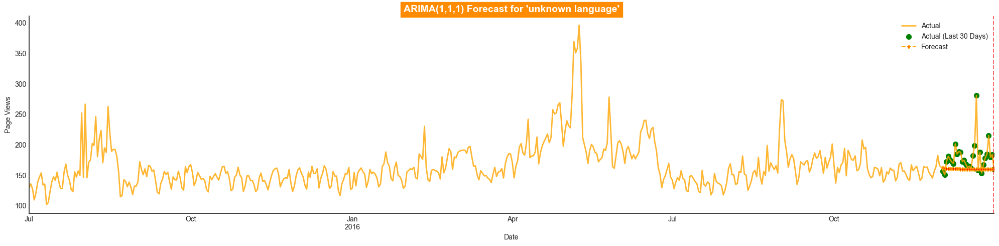

In [203]:
from statsmodels.tsa.arima.model import ARIMA
# Forecasting window
n = 30

# Evaluation function
def model_performance(actual, predicted):
    print('MAE :', round(mae(actual, predicted), 3))
    print('RMSE:', round(mse(actual, predicted)**0.5, 3))
    print('MAPE:', round(mape(actual, predicted) * 100, 3))
    print('---' * 10)
    print()
# Loop over all languages
for lang in agg_TS_data.columns:
    print("="*60)
    print(f"🔤 LANGUAGE: {lang}")
    print("="*60)

    time_series = agg_TS_data[lang].copy()

    # Skip short series
    if time_series.dropna().shape[0] < 40:
        print(f"Not enough data for {lang}. Skipping...\n")
        continue

    try:
        # Fit ARIMA(1,1,1)
        model = ARIMA(time_series[:-n], order=(1, 1, 1))
        model_fit = model.fit()

        # Forecast
        forecast = model_fit.forecast(steps=n, alpha=0.05)

        # Align index
        time_series.index = pd.to_datetime(time_series.index)
        forecast.index = time_series.index[-n:]

        # Evaluate
        actual = time_series[-n:]
        model_performance(actual, forecast)

        # Summary
        print(model_fit.summary())

        # Plot
        plt.figure(figsize=(20, 5))
        time_series.plot(label='Actual', color='orange', linewidth=2, alpha=0.8)
        plt.scatter(time_series.index[-n:], actual, color='green', s=50, label='Actual (Last 30 Days)')
        forecast.plot(label='Forecast', linestyle='--', marker='d', markerfacecolor='red', markersize=4, color='orange')
        plt.title(f"ARIMA(1,1,1) Forecast for '{lang}'", fontsize=14, fontweight='bold', backgroundcolor=DARK_ORANGE, color='white')
        plt.xlabel("Date")
        plt.ylabel("Page Views")
        plt.legend()
        plt.tight_layout()
        sns.despine()
        plt.axvline(x=time_series.index[-1], color='red', linestyle='--', label='Forecast Start')
        plt.show()

    except Exception as e:
        print(f"❌ Error fitting ARIMA model for {lang}: {e}\n")


In [215]:
exog.shape

(550, 1)

In [214]:
agg_TS_data.shape

(550, 8)

🔤 LANGUAGE    :   chinese
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=5747.751, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=5430.197, Time=1.39 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=5302.619, Time=2.37 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=5745.830, Time=0.04 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=5588.248, Time=0.31 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=5303.391, Time=2.46 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=5302.924, Time=3.68 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=5453.284, Time=1.00 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=5305.612, Time=3.90 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=5508.066, Time=0.78 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=5262.720, Time=3.26 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=5573.319, Time=0.58 sec
 ARIMA(0,0,2)(1,1,1)[12] intercept   : AIC=5261.449, Time=4.84 se

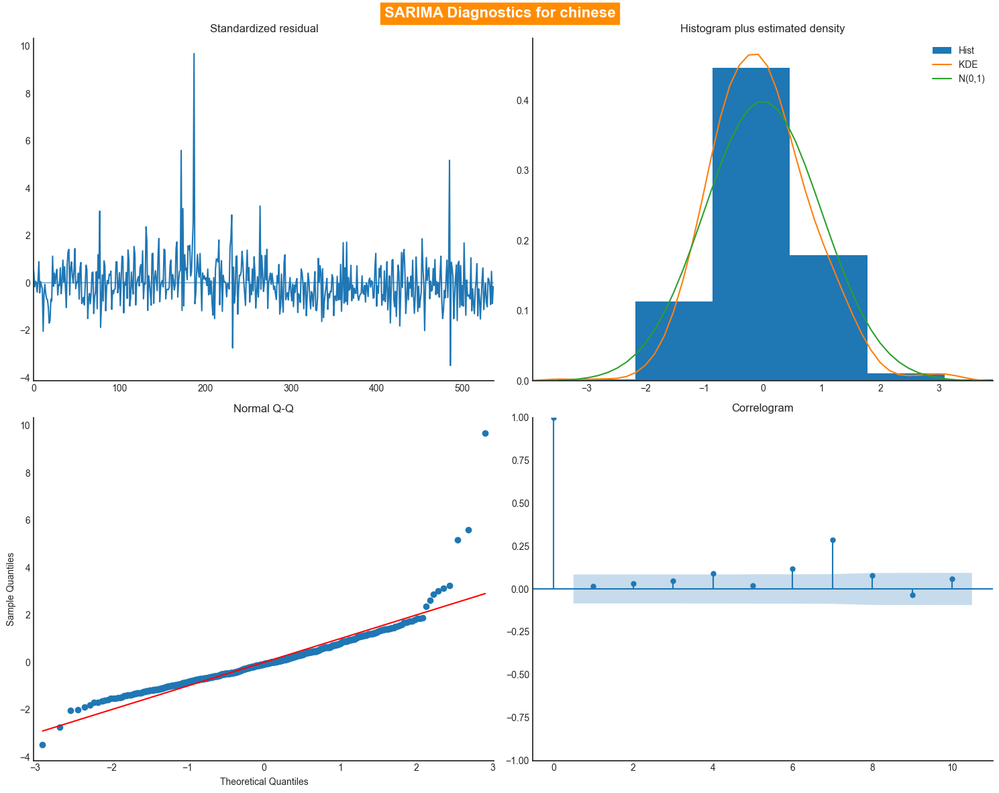

🔤 LANGUAGE    :   english
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=3.85 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=9013.598, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=8244.098, Time=1.25 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=4.35 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=9012.351, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=8398.411, Time=0.11 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=8134.104, Time=3.50 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=5.22 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=2.09 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=8928.443, Time=6.78 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=8134.865, Time=3.54 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=8134.696, Time=3.02 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=8511.543, Time=3.59 sec
 ARIMA(2,0,1)(2,1,0)[12] intercept   : AIC=inf, Time=6.91 sec
 ARIMA(1,0,0)(2,1,

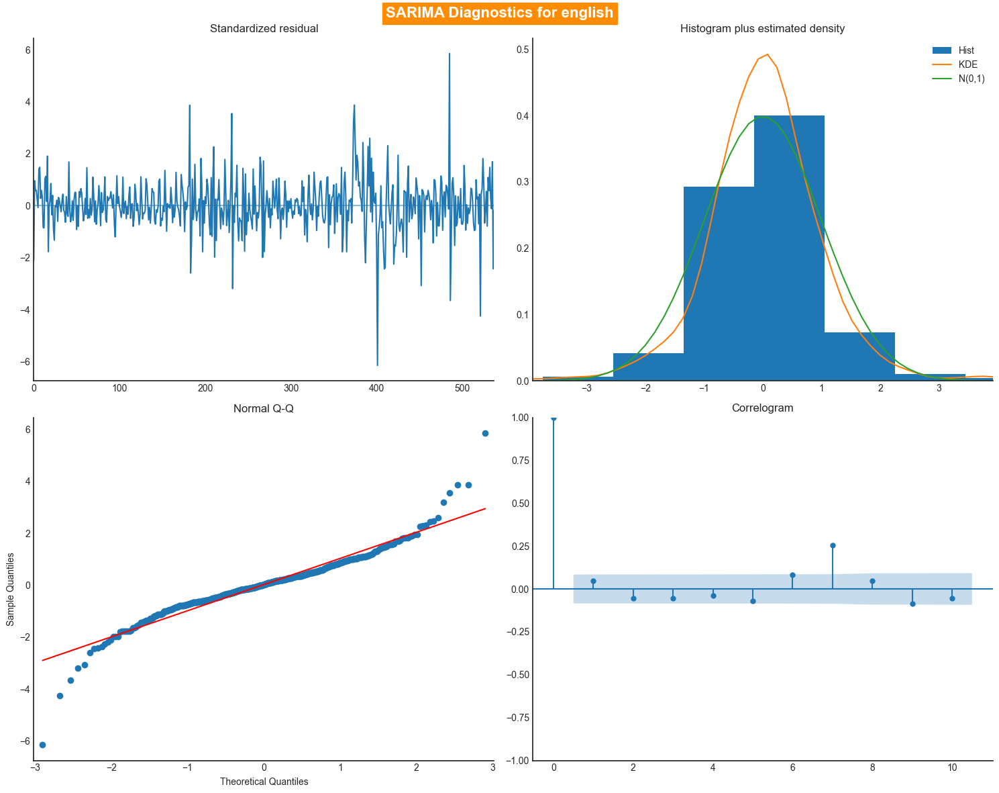

🔤 LANGUAGE    :   french
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=2.86 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=6695.116, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=6130.809, Time=0.76 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=6131.256, Time=0.74 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=6693.908, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=6338.632, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=6066.911, Time=2.21 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=2.95 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=6441.890, Time=5.41 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=6065.401, Time=4.37 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=6132.639, Time=0.83 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=5.00 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=2.53 sec
 ARIMA(3,0,0)(2,1,0

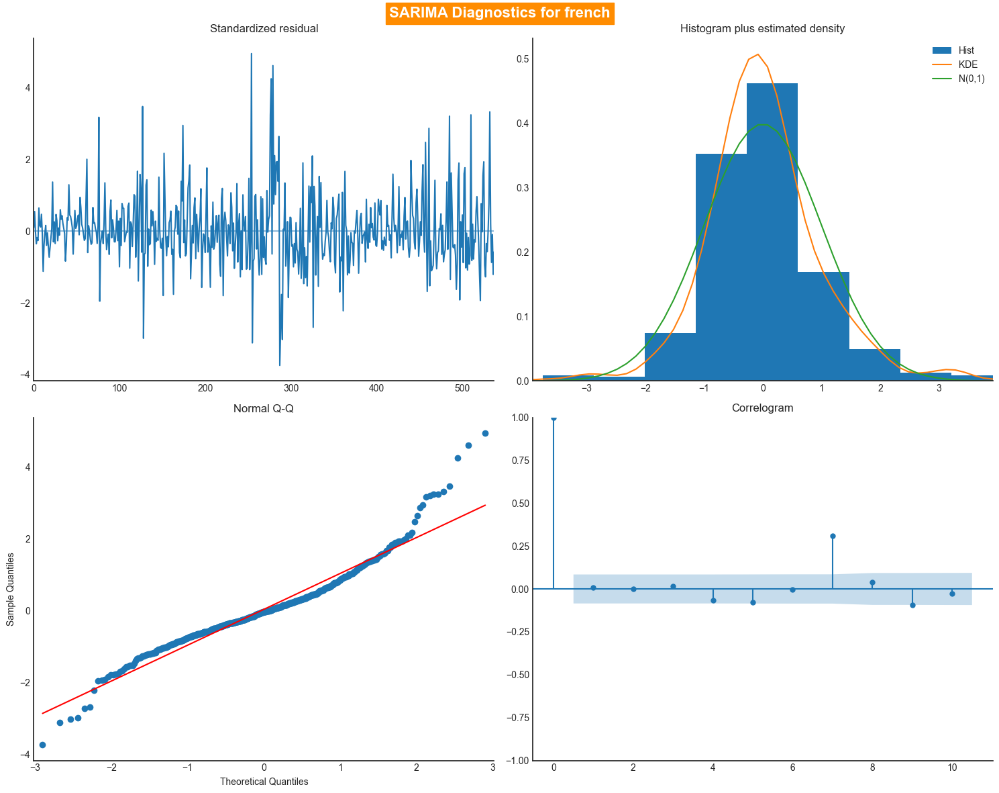

🔤 LANGUAGE    :   german
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=3.10 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=6693.447, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=6438.287, Time=0.79 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=6357.430, Time=1.14 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=6692.328, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=6534.357, Time=0.90 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=6354.994, Time=2.10 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=6451.074, Time=2.79 sec
 ARIMA(0,0,1)(2,1,1)[12] intercept   : AIC=6355.138, Time=5.16 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=6356.079, Time=4.28 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=6354.364, Time=3.32 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=6540.919, Time=2.38 sec
 ARIMA(1,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=5.61 sec
 ARIMA(0,0,2)(0,1,2)[12] intercept   : AIC=6327.309, Time=3.38 sec
 ARI

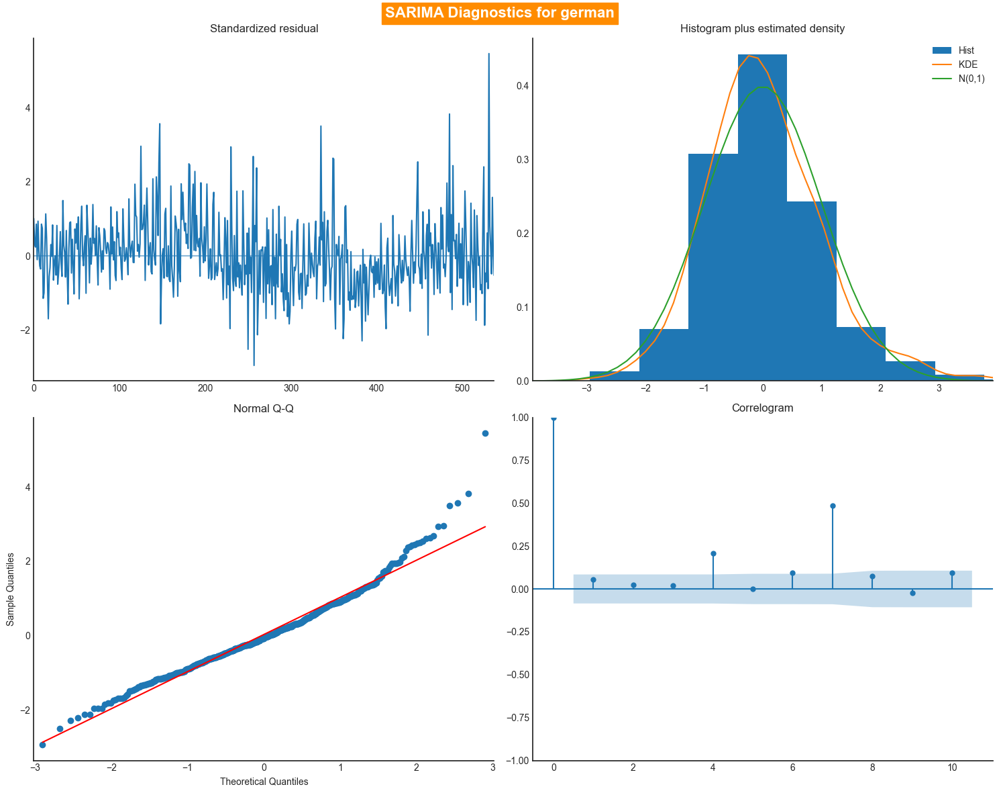

🔤 LANGUAGE    :   japanese
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=6766.150, Time=0.10 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=6510.312, Time=0.78 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=6436.792, Time=0.79 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=6764.571, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=6658.441, Time=0.24 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=6434.977, Time=3.73 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=5.04 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=6587.930, Time=2.58 sec
 ARIMA(1,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=3.23 sec
 ARIMA(0,0,2)(0,1,2)[12] intercept   : AIC=6394.705, Time=4.69 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=6392.928, Time=2.56 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=6646.785, Time=0.46 sec
 ARIMA(0,0,2

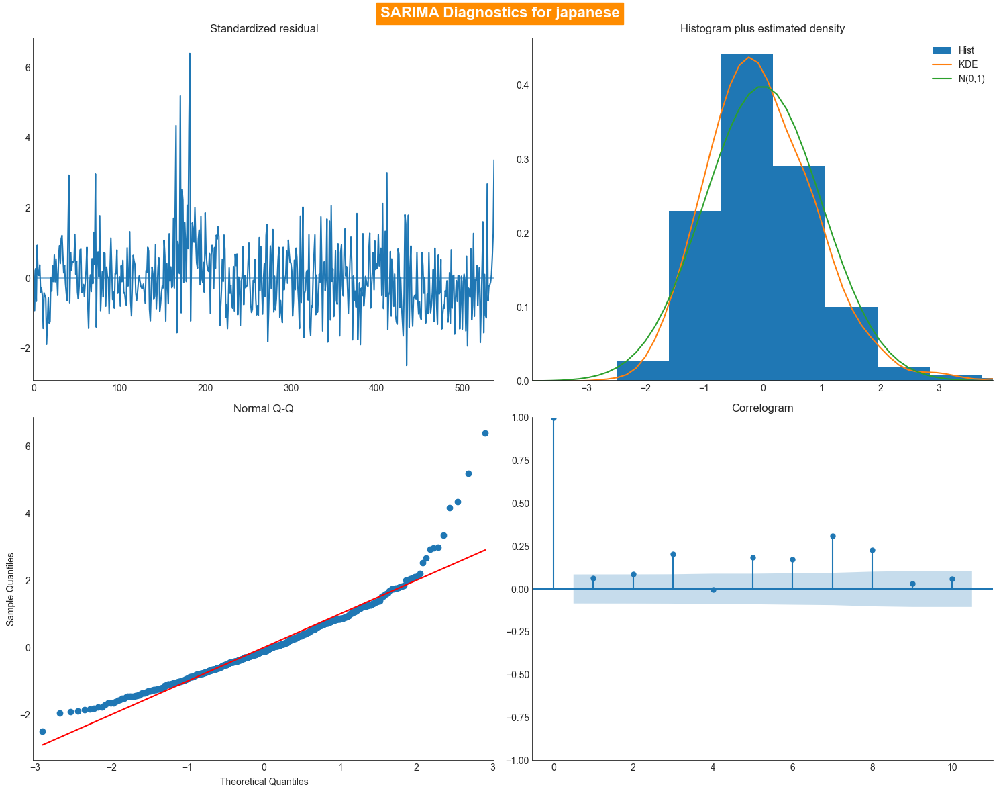

🔤 LANGUAGE    :   russian
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=8096.392, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=7038.225, Time=0.92 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=8094.493, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=7161.061, Time=0.15 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=6958.220, Time=3.74 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=4.80 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.99 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=8001.455, Time=4.28 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=6950.290, Time=3.58 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=7023.519, Time=1.64 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=4.58 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=3.88 sec
 ARIMA(3,0,0)(2,1,0)[12

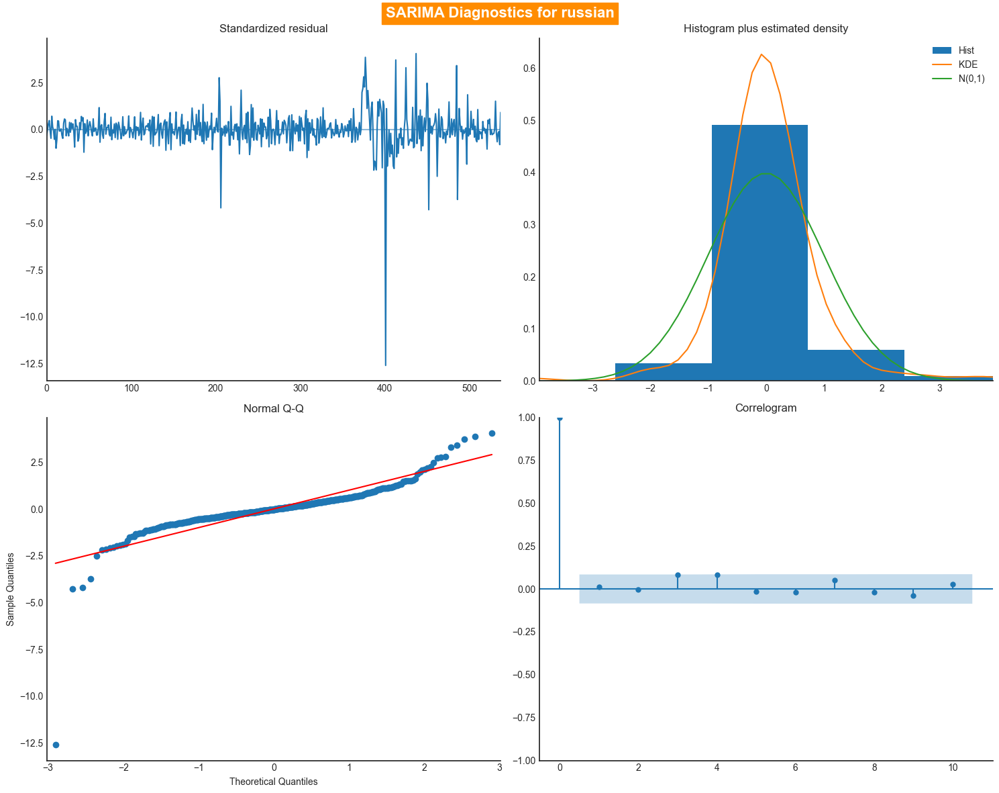

🔤 LANGUAGE    :   spanish
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=7672.768, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=7330.948, Time=1.71 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=3.64 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=7670.798, Time=0.07 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=7408.622, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=7035.823, Time=7.03 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=6.47 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=5.23 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=7445.733, Time=6.47 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=6979.419, Time=4.72 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=7016.628, Time=1.70 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=8.45 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=5.69 sec
 ARIMA(3,0,0)(2,1,0)[12

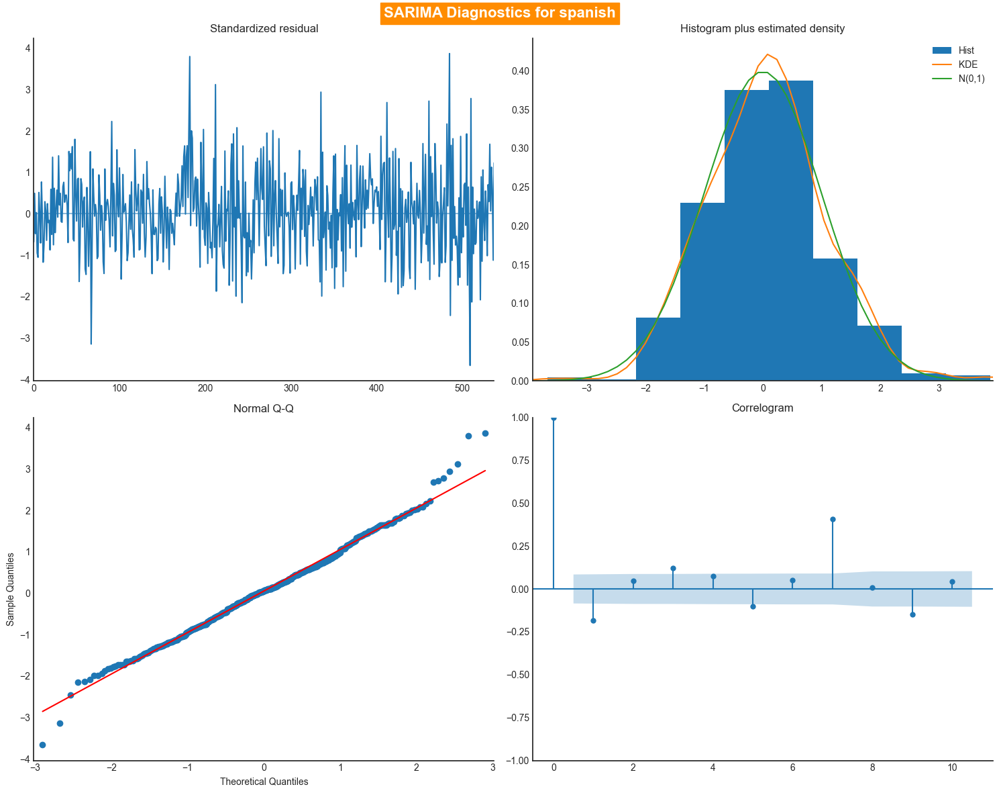

🔤 LANGUAGE    :   unknown language
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=4.38 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=5494.333, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=5043.709, Time=0.89 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=2.31 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=5492.921, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=5186.895, Time=0.13 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=4974.005, Time=2.77 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=6.93 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=3.28 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=5388.755, Time=5.34 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=4966.506, Time=5.01 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=5041.784, Time=1.46 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=7.46 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(3,0,0)(

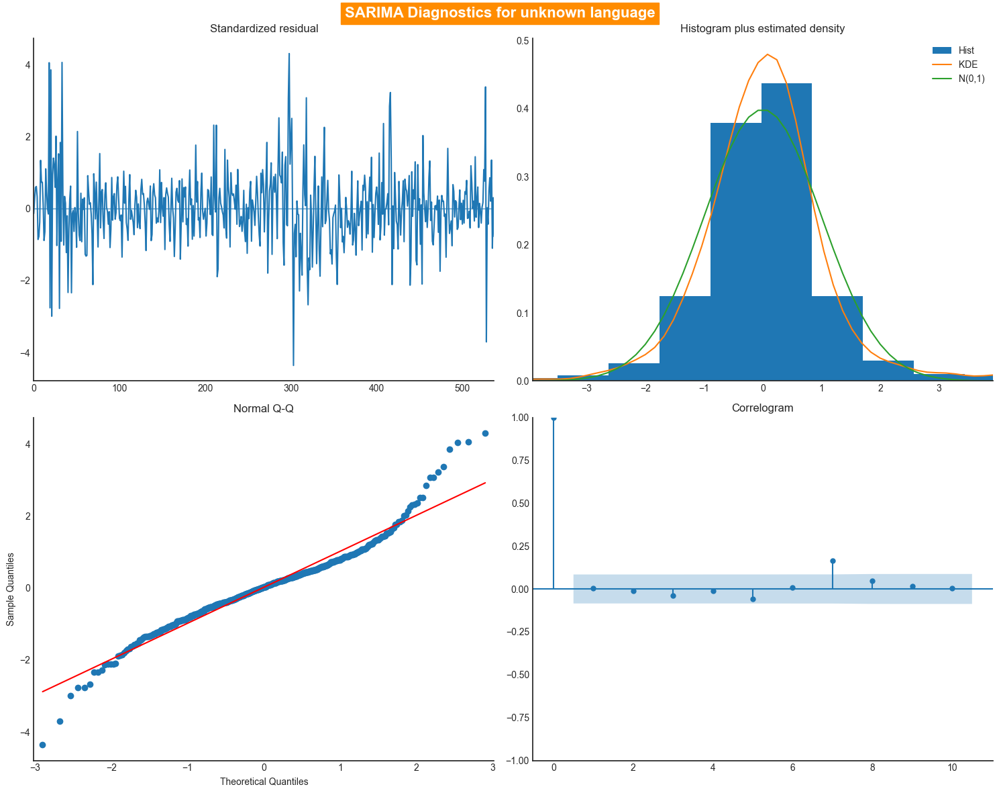

In [219]:
import pmdarima as pm

# Loop over each language column
for lang in agg_TS_data.columns:
    print('='*60)
    print(f"🔤 LANGUAGE    :   {lang}")
    print('='*60)

    ts = agg_TS_data[lang].dropna()
    exog_clean = exog.index

    # Skip if the series is too short
    if len(ts) < 40:
        print(f"Not enough data for {lang}. Skipping...")
        continue

    # Fit SARIMA model with exogenous variable
    try:
        sxmodel = pm.auto_arima(ts.values, 
                                exogenous=exog_clean.values.reshape(-1, 1),
                                start_p=1, start_q=1, test='adf',
                                max_p=3, max_q=3, m=12,
                                start_P=0, seasonal=True, D=1,
                                trace=True, error_action='ignore', 
                                suppress_warnings=True, stepwise=True)

        # Print summary
        print(sxmodel.summary())

        # Plot diagnostics
        sxmodel.plot_diagnostics(figsize=(15, 12))
        plt.suptitle(f"SARIMA Diagnostics for {lang}",fontsize=16, fontweight='bold', backgroundcolor=DARK_ORANGE, color='white')
        sns.despine()
        plt.tight_layout()
        sns.despine()
        plt.show()

    except Exception as e:
        print(f"Error for {lang}: {e}")
        continue


### SARIMAX MODEL:

🔤 LANGUAGE    :   chinese
🔍 Performance Metrics:
MAE : 24.732
RMSE : 27.41
MAPE: 7.153


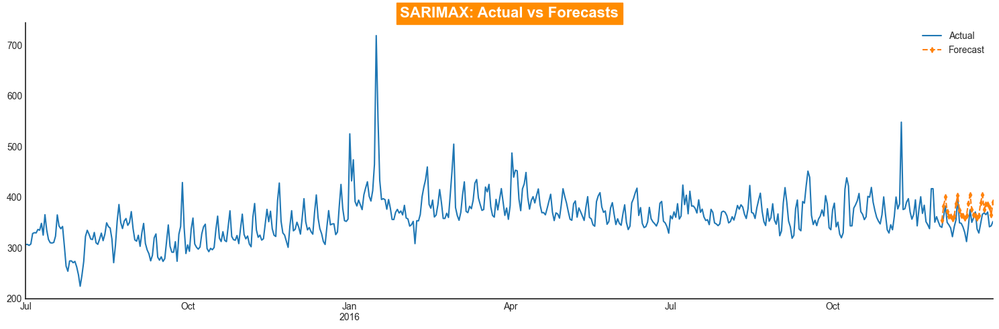

🔤 LANGUAGE    :   english
🔍 Performance Metrics:
MAE : 256.955
RMSE : 320.535
MAPE: 4.717


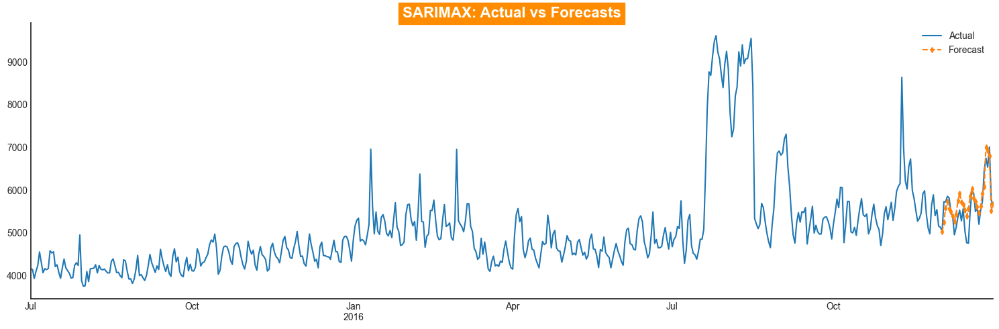

🔤 LANGUAGE    :   french
🔍 Performance Metrics:
MAE : 44.011
RMSE : 60.599
MAPE: 5.721


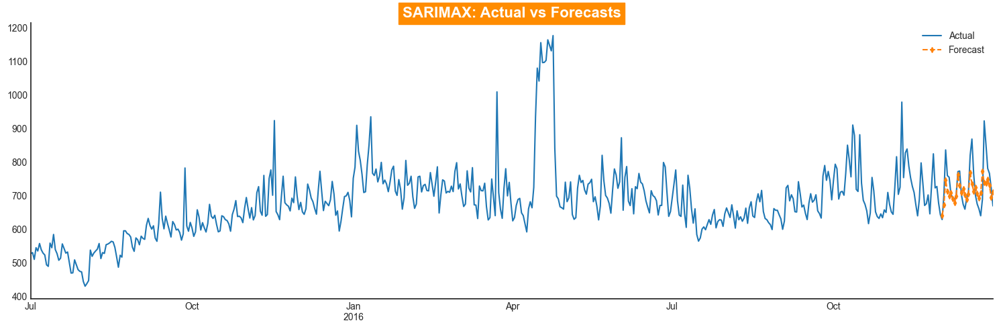

🔤 LANGUAGE    :   german
🔍 Performance Metrics:
MAE : 71.597
RMSE : 101.87
MAPE: 6.878


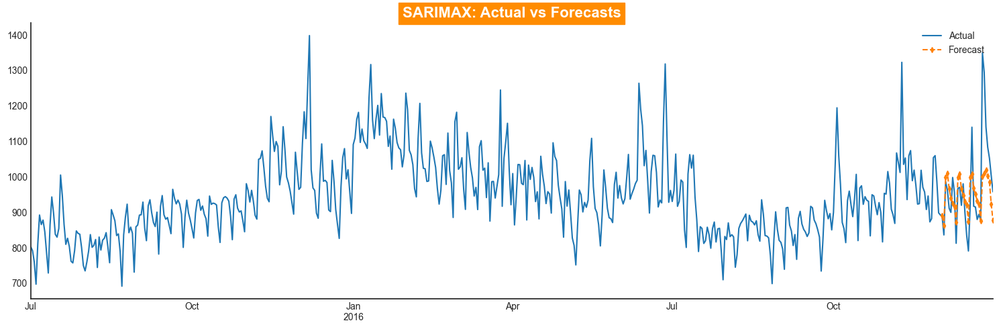

🔤 LANGUAGE    :   japanese
🔍 Performance Metrics:
MAE : 72.635
RMSE : 117.465
MAPE: 7.903


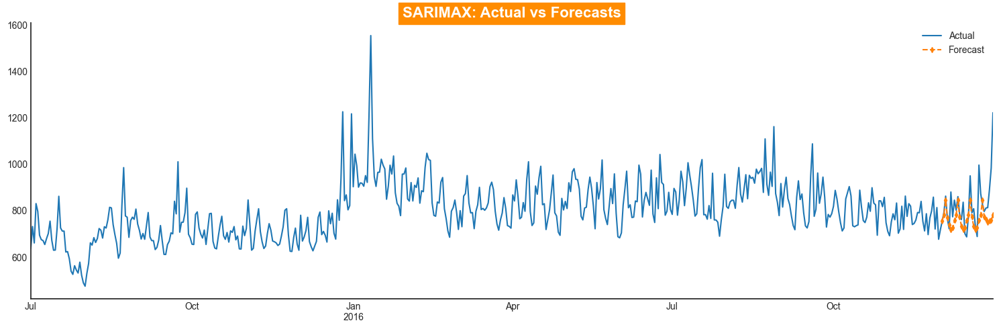

🔤 LANGUAGE    :   russian
🔍 Performance Metrics:
MAE : 174.208
RMSE : 206.363
MAPE: 17.947


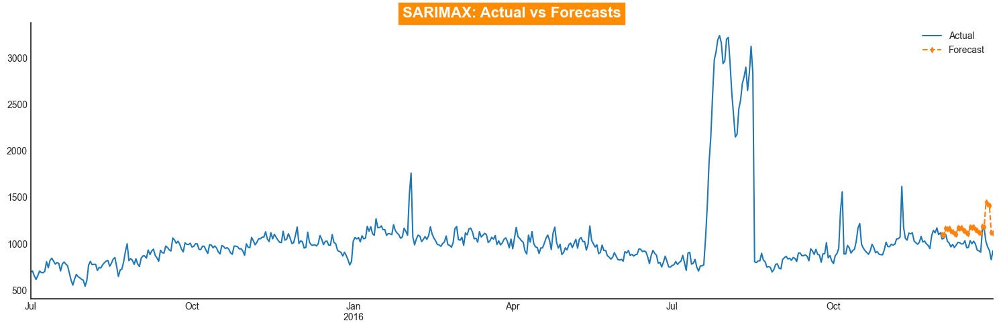

🔤 LANGUAGE    :   spanish
🔍 Performance Metrics:
MAE : 287.459
RMSE : 310.347
MAPE: 28.232


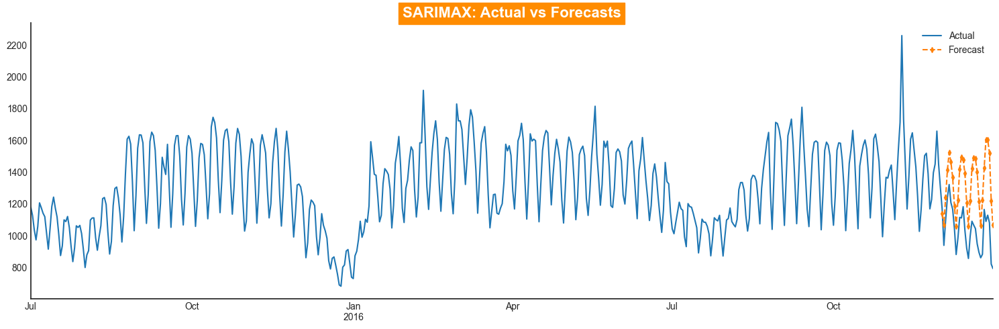

🔤 LANGUAGE    :   unknown language
🔍 Performance Metrics:
MAE : 20.017
RMSE : 29.154
MAPE: 10.199


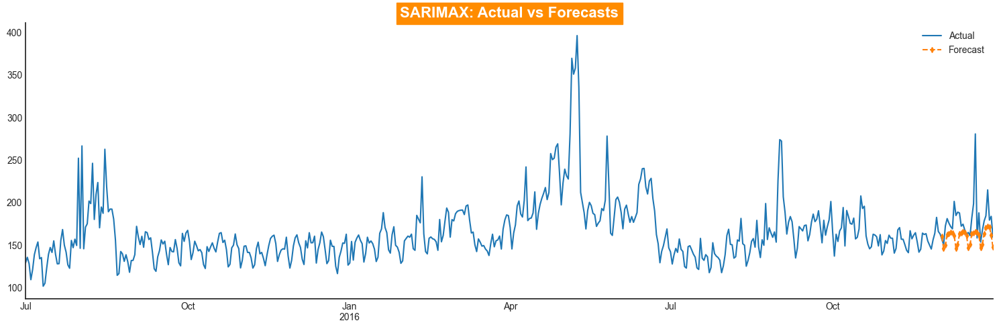

In [223]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Helper: Performance metrics
def model_performance(actual, predicted):
    print('MAE :', round(mean_absolute_error(actual, predicted), 3))
    print('RMSE :', round(np.sqrt(mean_squared_error(actual, predicted)), 3))
    print('MAPE:', round(mean_absolute_percentage_error(actual, predicted) * 100, 3))

# Your SARIMAX wrapper function
def sarimax_model(ts, n, p, d, q, P, D, Q, s, exog=None):
    train = ts.iloc[:-n]
    test = ts.iloc[-n:]
    exog_train = exog[:-n] if exog is not None else None
    exog_test = exog[-n:] if exog is not None else None

    # Fit model
    model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, s), exog=exog_train, enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)

    # Forecast
    forecast = results.forecast(steps=n, exog=exog_test)

    # Evaluate
    print("🔍 Performance Metrics:")
    model_performance(test, forecast)

    # Plot
    plt.figure(figsize=(15, 5))
    ts.plot(label='Actual')
    forecast.index = test.index
    forecast.plot(label='Forecast', linestyle='dashed', marker='d', markerfacecolor=DARK_ORANGE, markersize=4)
    plt.legend(loc="upper right")
    plt.title('SARIMAX: Actual vs Forecasts',fontsize=16, fontweight='bold', backgroundcolor=DARK_ORANGE, color='white')
    sns.despine()
    plt.tight_layout()
    plt.show()

    return results

# ---- Looping through all languages ----
exog_array = exog['Exog'].to_numpy()
test_size = 0.1
n = 30
p, d, q, P, D, Q, s = 1, 1, 1, 1, 1, 1, 7

for lang in agg_TS_data.columns:
    print('=' * 60)
    print(f"🔤 LANGUAGE    :   {lang}")
    print('=' * 60)

    ts = agg_TS_data[lang].dropna()
    exog_clean = exog_array[:len(ts)]  # Ensure exog matches ts length

    if len(ts) < (n + 10):  # Avoid fitting on very short series
        print(f"Not enough data for {lang}. Skipping...")
        continue

    try:
        sarimax_model(ts, n=n, p=p, d=d, q=q, P=P, D=D, Q=Q, s=s, exog=exog_clean)
    except Exception as e:
        print(f"❌ Error fitting SARIMAX for {lang}: {e}")
        continue


## 📒GRIDSEARCH / RANDOM SEARCH / BAYESIAN:

In [229]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
import random
import optuna

# Grid Search

def sarimax_grid_search(time_series, n, param, d_param, s_param, exog=[]):
    counter = 0
    param_df = pd.DataFrame(columns=['serial', 'pdq', 'PDQs', 'mape', 'rmse'])
    for p in param:
        for d in d_param:
            for q in param:
                for P in param:
                    for D in d_param:
                        for Q in param:
                            for s in s_param:
                                try:
                                    model = SARIMAX(time_series[:-n],
                                                    order=(p, d, q),
                                                    seasonal_order=(P, D, Q, s),
                                                    exog=exog[:-n],
                                                    initialization='approximate_diffuse')
                                    model_fit = model.fit(disp=False)
                                    forecast = model_fit.forecast(n, dynamic=True, exog=pd.DataFrame(exog[-n:]))
                                    actuals = time_series.values[-n:]
                                    errors = actuals - forecast.values
                                    mape = np.mean(np.abs(errors) / np.abs(actuals))
                                    rmse = np.sqrt(np.mean(errors ** 2))
                                    counter += 1
                                    param_df.loc[len(param_df)] = [counter, (p, d, q), (P, D, Q, s), round(mape, 5), round(rmse, 3)]
                                except Exception as e:
                                    continue
    return param_df

# Random Search

def sarimax_random_search(time_series, n, param, d_param, s_param, exog=[], n_iter=20):
    param_df = pd.DataFrame(columns=['serial', 'pdq', 'PDQs', 'mape', 'rmse'])
    combos = [(p,d,q,P,D,Q,s) for p in param for d in d_param for q in param 
                             for P in param for D in d_param for Q in param for s in s_param]
    sampled_combos = random.sample(combos, min(n_iter, len(combos)))
    for idx, (p,d,q,P,D,Q,s) in enumerate(sampled_combos, start=1):
        try:
            model = SARIMAX(time_series[:-n],
                            order=(p,d,q),
                            seasonal_order=(P,D,Q,s),
                            exog=exog[:-n],
                            initialization='approximate_diffuse')
            model_fit = model.fit(disp=False)
            forecast = model_fit.forecast(n, dynamic=True, exog=pd.DataFrame(exog[-n:]))
            actuals = time_series.values[-n:]
            errors = actuals - forecast.values
            mape = np.mean(np.abs(errors) / np.abs(actuals))
            rmse = np.sqrt(np.mean(errors ** 2))
            param_df.loc[len(param_df)] = [idx, (p,d,q), (P,D,Q,s), round(mape,2), round(rmse,2)]
        except Exception:
            continue
    return param_df

# Bayesian Optimization

def run_optuna_search(time_series, exog, n):
    def objective(trial):
        p = trial.suggest_int('p', 0, 2)
        d = trial.suggest_int('d', 0, 1)
        q = trial.suggest_int('q', 0, 2)
        P = trial.suggest_int('P', 0, 2)
        D = trial.suggest_int('D', 0, 1)
        Q = trial.suggest_int('Q', 0, 2)
        s = trial.suggest_categorical('s', [7])
        try:
            model = SARIMAX(time_series[:-n],
                            order=(p, d, q),
                            seasonal_order=(P, D, Q, s),
                            exog=exog[:-n],
                            initialization='approximate_diffuse')
            model_fit = model.fit(disp=False)
            forecast = model_fit.forecast(n, dynamic=True, exog=exog[-n:])
            actuals = time_series[-n:]
            errors = actuals - forecast
            mape = np.mean(np.abs(errors) / np.abs(actuals))
            return mape
        except:
            return float("inf")

    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=30)
    return study.best_params, study.best_value

# Loop over all languages
n = 30
param = [0, 1, 2]
d_param = [0, 1]
s_param = [7]

for lang in agg_TS_data.columns:
    print('=' * 60)
    print(f"🔤 LANGUAGE    :   {lang}")
    print('=' * 60)
    ts = agg_TS_data[lang]
    if ts.dropna().shape[0] < 40:
        print(f"Not enough data for {lang}. Skipping...")
        continue

    # Ensure exog is aligned
    exog_array = exog if isinstance(exog, np.ndarray) else exog['Exog'].to_numpy()

    # Grid Search
    gs_result = sarimax_grid_search(ts, n, param, d_param, s_param, exog_array)
    best_gs = gs_result.sort_values(['mape', 'rmse']).iloc[0] if not gs_result.empty else None

    # Random Search
    rs_result = sarimax_random_search(ts, n, param, d_param, s_param, exog_array, n_iter=20)
    best_rs = rs_result.sort_values(['mape', 'rmse']).iloc[0] if not rs_result.empty else None

    # Bayesian Optimization
    best_bo, best_bo_mape = run_optuna_search(ts, exog_array, n)

    print("\n✅ Best parameters for language:")
    if best_gs is not None:
        print(f"   [GridSearch]   ➤ pdq: {best_gs['pdq']} | PDQs: {best_gs['PDQs']} | MAPE: {round(best_gs['mape']*100,3)}% | RMSE: {best_gs['rmse']}")
    if best_rs is not None:
        print(f"   [RandomSearch] ➤ pdq: {best_rs['pdq']} | PDQs: {best_rs['PDQs']} | MAPE: {round(best_rs['mape']*100,3)}% | RMSE: {best_rs['rmse']}")
    print(f"   [BayesianOpt]   ➤ Best Params: {best_bo} | Best MAPE: {round(best_bo_mape*100,3)}%")

🔤 LANGUAGE    :   chinese


[I 2025-04-20 00:38:02,515] A new study created in memory with name: no-name-6a6305e3-6b06-4600-8342-dea8cb3c5115
[I 2025-04-20 00:38:02,832] Trial 0 finished with value: 0.03661248920944192 and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 0, 'D': 0, 'Q': 2, 's': 7}. Best is trial 0 with value: 0.03661248920944192.
[I 2025-04-20 00:38:03,788] Trial 1 finished with value: 0.056099037646408174 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 1, 'Q': 2, 's': 7}. Best is trial 0 with value: 0.03661248920944192.
[I 2025-04-20 00:38:03,921] Trial 2 finished with value: 0.03542742703751703 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 1, 'D': 0, 'Q': 0, 's': 7}. Best is trial 2 with value: 0.03542742703751703.
[I 2025-04-20 00:38:04,255] Trial 3 finished with value: 0.06535249601353851 and parameters: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 1, 'Q': 0, 's': 7}. Best is trial 2 with value: 0.03542742703751703.
[I 2025-04-20 00:38:04,941] Trial 4 finished with value: 0.04313239829879191 and para


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (0, 1, 1) | PDQs: (2, 0, 0, 7) | MAPE: 3.408% | RMSE: 16.407
   [RandomSearch] ➤ pdq: (0, 1, 1) | PDQs: (2, 0, 0, 7) | MAPE: 3.0% | RMSE: 16.41
   [BayesianOpt]   ➤ Best Params: {'p': 1, 'd': 0, 'q': 1, 'P': 2, 'D': 0, 'Q': 0, 's': 7} | Best MAPE: 3.442%
🔤 LANGUAGE    :   english


[I 2025-04-20 00:41:47,722] A new study created in memory with name: no-name-9018e9d6-0dfc-483c-b26b-a415a7bb24e6
[I 2025-04-20 00:41:48,613] Trial 0 finished with value: 0.06891751260273209 and parameters: {'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 1, 'Q': 1, 's': 7}. Best is trial 0 with value: 0.06891751260273209.
[I 2025-04-20 00:41:49,742] Trial 1 finished with value: 0.04590654397504173 and parameters: {'p': 1, 'd': 0, 'q': 0, 'P': 2, 'D': 1, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.04590654397504173.
[I 2025-04-20 00:41:50,471] Trial 2 finished with value: 0.0520065457614458 and parameters: {'p': 0, 'd': 1, 'q': 0, 'P': 2, 'D': 0, 'Q': 1, 's': 7}. Best is trial 1 with value: 0.04590654397504173.
[I 2025-04-20 00:41:52,072] Trial 3 finished with value: 0.056016554044624335 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 1, 'D': 1, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.04590654397504173.
[I 2025-04-20 00:41:52,610] Trial 4 finished with value: 0.05095939477654461 and param


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (0, 0, 2) | PDQs: (0, 1, 2, 7) | MAPE: 4.413% | RMSE: 312.636
   [RandomSearch] ➤ pdq: (1, 1, 1) | PDQs: (2, 1, 1, 7) | MAPE: 5.0% | RMSE: 317.38
   [BayesianOpt]   ➤ Best Params: {'p': 1, 'd': 0, 'q': 0, 'P': 2, 'D': 1, 'Q': 2, 's': 7} | Best MAPE: 4.591%
🔤 LANGUAGE    :   french


[I 2025-04-20 00:45:41,527] A new study created in memory with name: no-name-8eef1fbc-c929-43d4-8eed-2fb29dc7107e
[I 2025-04-20 00:45:43,393] Trial 0 finished with value: 0.0783011721607134 and parameters: {'p': 2, 'd': 0, 'q': 2, 'P': 1, 'D': 1, 'Q': 2, 's': 7}. Best is trial 0 with value: 0.0783011721607134.
[I 2025-04-20 00:45:43,933] Trial 1 finished with value: 0.07610826187950767 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 1, 's': 7}. Best is trial 1 with value: 0.07610826187950767.
[I 2025-04-20 00:45:44,057] Trial 2 finished with value: 0.0944194280176938 and parameters: {'p': 0, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 1, 's': 7}. Best is trial 1 with value: 0.07610826187950767.
[I 2025-04-20 00:45:44,837] Trial 3 finished with value: 0.08140993638938827 and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.07610826187950767.
[I 2025-04-20 00:45:45,022] Trial 4 finished with value: 0.1345251955229228 and parameter


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (1, 0, 2) | PDQs: (2, 0, 2, 7) | MAPE: 5.346% | RMSE: 56.789
   [RandomSearch] ➤ pdq: (1, 1, 1) | PDQs: (2, 1, 2, 7) | MAPE: 6.0% | RMSE: 60.6
   [BayesianOpt]   ➤ Best Params: {'p': 0, 'd': 0, 'q': 2, 'P': 1, 'D': 1, 'Q': 2, 's': 7} | Best MAPE: 5.94%
🔤 LANGUAGE    :   german


[I 2025-04-20 00:49:27,760] A new study created in memory with name: no-name-630731ca-8b38-4b22-8ecb-65f08286e129
[I 2025-04-20 00:49:28,342] Trial 0 finished with value: 0.0657918965731805 and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 2, 'D': 0, 'Q': 2, 's': 7}. Best is trial 0 with value: 0.0657918965731805.
[I 2025-04-20 00:49:28,772] Trial 1 finished with value: 0.0744727168121715 and parameters: {'p': 0, 'd': 0, 'q': 2, 'P': 0, 'D': 1, 'Q': 2, 's': 7}. Best is trial 0 with value: 0.0657918965731805.
[I 2025-04-20 00:49:29,239] Trial 2 finished with value: 0.08155639347387088 and parameters: {'p': 0, 'd': 0, 'q': 0, 'P': 2, 'D': 1, 'Q': 1, 's': 7}. Best is trial 0 with value: 0.0657918965731805.
[I 2025-04-20 00:49:30,062] Trial 3 finished with value: 0.06479351251404022 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 's': 7}. Best is trial 3 with value: 0.06479351251404022.
[I 2025-04-20 00:49:30,270] Trial 4 finished with value: 0.08162138962149997 and parameters


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (2, 1, 0) | PDQs: (0, 1, 1, 7) | MAPE: 6.259% | RMSE: 110.997
   [RandomSearch] ➤ pdq: (2, 1, 0) | PDQs: (0, 1, 1, 7) | MAPE: 6.0% | RMSE: 111.0
   [BayesianOpt]   ➤ Best Params: {'p': 1, 'd': 0, 'q': 1, 'P': 1, 'D': 0, 'Q': 1, 's': 7} | Best MAPE: 6.321%
🔤 LANGUAGE    :   japanese


[I 2025-04-20 00:52:47,887] A new study created in memory with name: no-name-a4ce3564-79ae-4ea6-ba77-437c739df825
[I 2025-04-20 00:52:49,470] Trial 0 finished with value: 0.07635186592847609 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 1, 'Q': 2, 's': 7}. Best is trial 0 with value: 0.07635186592847609.
[I 2025-04-20 00:52:50,515] Trial 1 finished with value: 0.09015747322420582 and parameters: {'p': 0, 'd': 0, 'q': 1, 'P': 2, 'D': 0, 'Q': 0, 's': 7}. Best is trial 0 with value: 0.07635186592847609.
[I 2025-04-20 00:52:51,174] Trial 2 finished with value: 0.07182456420471041 and parameters: {'p': 0, 'd': 0, 'q': 2, 'P': 0, 'D': 1, 'Q': 2, 's': 7}. Best is trial 2 with value: 0.07182456420471041.
[I 2025-04-20 00:52:51,346] Trial 3 finished with value: 0.09321028268789654 and parameters: {'p': 2, 'd': 1, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 's': 7}. Best is trial 2 with value: 0.07182456420471041.
[I 2025-04-20 00:52:52,049] Trial 4 finished with value: 0.0800261994743508 and parame


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (2, 0, 0) | PDQs: (1, 0, 1, 7) | MAPE: 6.83% | RMSE: 102.952
   [RandomSearch] ➤ pdq: (0, 1, 0) | PDQs: (2, 1, 0, 7) | MAPE: 7.0% | RMSE: 98.14
   [BayesianOpt]   ➤ Best Params: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 1, 'Q': 1, 's': 7} | Best MAPE: 6.92%
🔤 LANGUAGE    :   russian


[I 2025-04-20 00:56:23,250] A new study created in memory with name: no-name-d616ca4a-b750-49ad-93da-232067ab11c2
[I 2025-04-20 00:56:23,773] Trial 0 finished with value: 0.1113629280177476 and parameters: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 1, 's': 7}. Best is trial 0 with value: 0.1113629280177476.
[I 2025-04-20 00:56:23,869] Trial 1 finished with value: 0.1696459018295843 and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 1, 'D': 0, 'Q': 2, 's': 7}. Best is trial 0 with value: 0.1113629280177476.
[I 2025-04-20 00:56:24,447] Trial 2 finished with value: 0.33032598776457256 and parameters: {'p': 2, 'd': 1, 'q': 0, 'P': 2, 'D': 1, 'Q': 0, 's': 7}. Best is trial 0 with value: 0.1113629280177476.
[I 2025-04-20 00:56:25,712] Trial 3 finished with value: 0.11685933441899135 and parameters: {'p': 2, 'd': 0, 'q': 1, 'P': 2, 'D': 1, 'Q': 2, 's': 7}. Best is trial 0 with value: 0.1113629280177476.
[I 2025-04-20 00:56:27,456] Trial 4 finished with value: 0.17217250775902213 and parameters:


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (1, 0, 0) | PDQs: (0, 0, 1, 7) | MAPE: 7.218% | RMSE: 94.111
   [RandomSearch] ➤ pdq: (2, 0, 0) | PDQs: (0, 1, 1, 7) | MAPE: 10.0% | RMSE: 122.49
   [BayesianOpt]   ➤ Best Params: {'p': 1, 'd': 0, 'q': 0, 'P': 1, 'D': 0, 'Q': 2, 's': 7} | Best MAPE: 10.532%
🔤 LANGUAGE    :   spanish


[I 2025-04-20 00:59:34,369] A new study created in memory with name: no-name-09b6b7f8-f622-446b-9d3c-8c932cb95133
[I 2025-04-20 00:59:35,113] Trial 0 finished with value: 0.3329838878139902 and parameters: {'p': 2, 'd': 0, 'q': 2, 'P': 2, 'D': 0, 'Q': 2, 's': 7}. Best is trial 0 with value: 0.3329838878139902.
[I 2025-04-20 00:59:35,662] Trial 1 finished with value: 0.2500794737684366 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 1, 'D': 0, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.2500794737684366.
[I 2025-04-20 00:59:36,357] Trial 2 finished with value: 0.28579441524423727 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 's': 7}. Best is trial 1 with value: 0.2500794737684366.
[I 2025-04-20 00:59:37,218] Trial 3 finished with value: 0.1658718509262502 and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 1, 'D': 1, 'Q': 2, 's': 7}. Best is trial 3 with value: 0.1658718509262502.
[I 2025-04-20 00:59:37,487] Trial 4 finished with value: 0.10695753542256199 and parameters: 


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (2, 0, 1) | PDQs: (1, 0, 2, 7) | MAPE: 6.674% | RMSE: 78.39
   [RandomSearch] ➤ pdq: (1, 1, 0) | PDQs: (2, 1, 0, 7) | MAPE: 9.0% | RMSE: 116.1
   [BayesianOpt]   ➤ Best Params: {'p': 0, 'd': 1, 'q': 1, 'P': 2, 'D': 1, 'Q': 0, 's': 7} | Best MAPE: 9.393%
🔤 LANGUAGE    :   unknown language


[I 2025-04-20 01:03:00,152] A new study created in memory with name: no-name-fdc49eb7-92b9-4230-8bae-6deb088d946d
[I 2025-04-20 01:03:00,335] Trial 0 finished with value: 0.08270325879531493 and parameters: {'p': 0, 'd': 1, 'q': 2, 'P': 0, 'D': 0, 'Q': 1, 's': 7}. Best is trial 0 with value: 0.08270325879531493.
[I 2025-04-20 01:03:00,631] Trial 1 finished with value: 0.09676304035995692 and parameters: {'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 1, 'Q': 0, 's': 7}. Best is trial 0 with value: 0.08270325879531493.
[I 2025-04-20 01:03:01,513] Trial 2 finished with value: 0.11002433797886477 and parameters: {'p': 0, 'd': 0, 'q': 1, 'P': 2, 'D': 0, 'Q': 1, 's': 7}. Best is trial 0 with value: 0.08270325879531493.
[I 2025-04-20 01:03:02,135] Trial 3 finished with value: 0.21349304392775706 and parameters: {'p': 1, 'd': 0, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 's': 7}. Best is trial 0 with value: 0.08270325879531493.
[I 2025-04-20 01:03:02,482] Trial 4 finished with value: 0.10001257372855739 and param


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (1, 1, 2) | PDQs: (1, 0, 1, 7) | MAPE: 6.617% | RMSE: 23.003
   [RandomSearch] ➤ pdq: (1, 0, 0) | PDQs: (2, 1, 1, 7) | MAPE: 8.0% | RMSE: 26.52
   [BayesianOpt]   ➤ Best Params: {'p': 0, 'd': 1, 'q': 2, 'P': 0, 'D': 0, 'Q': 2, 's': 7} | Best MAPE: 8.269%


## 🪈👨🏼‍🔧FULL PIPELINE:

🔤 LANGUAGE    :   chinese


[I 2025-04-20 09:25:57,304] A new study created in memory with name: no-name-22e0cd45-b2e1-4cec-854b-34730913f448
[I 2025-04-20 09:25:58,825] Trial 0 finished with value: 0.044991222692852266 and parameters: {'p': 1, 'd': 0, 'q': 2, 'P': 1, 'D': 1, 'Q': 1, 's': 7}. Best is trial 0 with value: 0.044991222692852266.
[I 2025-04-20 09:25:59,604] Trial 1 finished with value: 0.04170405572464721 and parameters: {'p': 2, 'd': 1, 'q': 0, 'P': 1, 'D': 0, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.04170405572464721.
[I 2025-04-20 09:26:01,350] Trial 2 finished with value: 0.04744226634380939 and parameters: {'p': 1, 'd': 0, 'q': 2, 'P': 2, 'D': 0, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.04170405572464721.
[I 2025-04-20 09:26:01,666] Trial 3 finished with value: 0.040407481221855446 and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 1, 'D': 0, 'Q': 1, 's': 7}. Best is trial 3 with value: 0.040407481221855446.
[I 2025-04-20 09:26:02,562] Trial 4 finished with value: 0.05945186489108464 and p


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (0, 1, 1) | PDQs: (2, 0, 0, 7) | MAPE: 3.408% | RMSE: 16.407
   [RandomSearch] ➤ pdq: (1, 0, 1) | PDQs: (2, 0, 0, 7) | MAPE: 3.442% | RMSE: 16.494
   [BayesianOpt]   ➤ Best Params: {'p': 0, 'd': 1, 'q': 1, 'P': 2, 'D': 0, 'Q': 0, 's': 7} | Best MAPE: 3.408%
🔤 LANGUAGE    :   english


[I 2025-04-20 09:30:23,548] A new study created in memory with name: no-name-2a675c20-50ef-4c60-af06-4fe279d944f6
[I 2025-04-20 09:30:24,055] Trial 0 finished with value: 0.13100314586956943 and parameters: {'p': 0, 'd': 1, 'q': 2, 'P': 2, 'D': 1, 'Q': 0, 's': 7}. Best is trial 0 with value: 0.13100314586956943.
[I 2025-04-20 09:30:24,362] Trial 1 finished with value: 0.07213263620066573 and parameters: {'p': 1, 'd': 0, 'q': 0, 'P': 1, 'D': 0, 'Q': 0, 's': 7}. Best is trial 1 with value: 0.07213263620066573.
[I 2025-04-20 09:30:24,868] Trial 2 finished with value: 0.05221081464985194 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 2, 's': 7}. Best is trial 2 with value: 0.05221081464985194.
[I 2025-04-20 09:30:25,209] Trial 3 finished with value: 0.05235238865393924 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 1, 'D': 1, 'Q': 1, 's': 7}. Best is trial 2 with value: 0.05221081464985194.
[I 2025-04-20 09:30:26,264] Trial 4 finished with value: 0.06923461513054521 and param


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (0, 0, 2) | PDQs: (0, 1, 2, 7) | MAPE: 4.413% | RMSE: 312.636
   [RandomSearch] ➤ pdq: (1, 1, 1) | PDQs: (1, 0, 1, 7) | MAPE: 4.715% | RMSE: 319.17
   [BayesianOpt]   ➤ Best Params: {'p': 2, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 2, 's': 7} | Best MAPE: 4.439%
🔤 LANGUAGE    :   french


[I 2025-04-20 09:40:02,129] A new study created in memory with name: no-name-122d9420-dbd2-4f19-8fc2-784f18fe90b9
[I 2025-04-20 09:40:02,816] Trial 0 finished with value: 0.07923606360227733 and parameters: {'p': 2, 'd': 0, 'q': 1, 'P': 1, 'D': 1, 'Q': 1, 's': 7}. Best is trial 0 with value: 0.07923606360227733.
[I 2025-04-20 09:40:03,789] Trial 1 finished with value: 0.07671420807426986 and parameters: {'p': 0, 'd': 1, 'q': 2, 'P': 1, 'D': 1, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.07671420807426986.
[I 2025-04-20 09:40:04,127] Trial 2 finished with value: 0.09259482441599215 and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 2, 'D': 1, 'Q': 1, 's': 7}. Best is trial 1 with value: 0.07671420807426986.
[I 2025-04-20 09:40:04,299] Trial 3 finished with value: 0.06537834970625583 and parameters: {'p': 0, 'd': 0, 'q': 0, 'P': 1, 'D': 0, 'Q': 1, 's': 7}. Best is trial 3 with value: 0.06537834970625583.
[I 2025-04-20 09:40:05,934] Trial 4 finished with value: 0.060417716292699944 and para


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (1, 0, 2) | PDQs: (2, 0, 2, 7) | MAPE: 5.346% | RMSE: 56.789
   [RandomSearch] ➤ pdq: (0, 0, 2) | PDQs: (2, 1, 2, 7) | MAPE: 5.761% | RMSE: 64.631
   [BayesianOpt]   ➤ Best Params: {'p': 1, 'd': 1, 'q': 1, 'P': 2, 'D': 1, 'Q': 2, 's': 7} | Best MAPE: 5.725%
🔤 LANGUAGE    :   german


[I 2025-04-20 09:43:29,379] A new study created in memory with name: no-name-7de60764-ed78-474e-bb8d-a284aa9c55b6
[I 2025-04-20 09:43:30,413] Trial 0 finished with value: 0.09363972726334353 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 2, 'D': 0, 'Q': 0, 's': 7}. Best is trial 0 with value: 0.09363972726334353.
[I 2025-04-20 09:43:31,392] Trial 1 finished with value: 0.06604952049786308 and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.06604952049786308.
[I 2025-04-20 09:43:32,563] Trial 2 finished with value: 0.07053451195514274 and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.06604952049786308.
[I 2025-04-20 09:43:32,716] Trial 3 finished with value: 0.0786289130461976 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0, 's': 7}. Best is trial 1 with value: 0.06604952049786308.
[I 2025-04-20 09:43:33,265] Trial 4 finished with value: 0.0806891809643973 and paramet


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (2, 1, 0) | PDQs: (0, 1, 1, 7) | MAPE: 6.259% | RMSE: 110.997
   [RandomSearch] ➤ pdq: (1, 1, 0) | PDQs: (1, 0, 1, 7) | MAPE: 6.338% | RMSE: 114.438
   [BayesianOpt]   ➤ Best Params: {'p': 0, 'd': 1, 'q': 1, 'P': 1, 'D': 1, 'Q': 1, 's': 7} | Best MAPE: 6.31%
🔤 LANGUAGE    :   japanese


[I 2025-04-20 09:46:26,525] A new study created in memory with name: no-name-d388ede6-5cfc-467f-b066-725a0bad48d1
[I 2025-04-20 09:46:26,829] Trial 0 finished with value: 0.07796897959332573 and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 1, 's': 7}. Best is trial 0 with value: 0.07796897959332573.
[I 2025-04-20 09:46:27,553] Trial 1 finished with value: 0.07628230601476355 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 1, 'Q': 1, 's': 7}. Best is trial 1 with value: 0.07628230601476355.
[I 2025-04-20 09:46:27,990] Trial 2 finished with value: 0.08148815329343582 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 2, 'D': 1, 'Q': 0, 's': 7}. Best is trial 1 with value: 0.07628230601476355.
[I 2025-04-20 09:46:28,339] Trial 3 finished with value: 0.06942899044900515 and parameters: {'p': 0, 'd': 0, 'q': 2, 'P': 0, 'D': 1, 'Q': 1, 's': 7}. Best is trial 3 with value: 0.06942899044900515.
[I 2025-04-20 09:46:28,685] Trial 4 finished with value: 0.11359677091477115 and param


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (2, 0, 0) | PDQs: (1, 0, 1, 7) | MAPE: 6.83% | RMSE: 102.952
   [RandomSearch] ➤ pdq: (2, 0, 2) | PDQs: (2, 1, 1, 7) | MAPE: 7.217% | RMSE: 106.945
   [BayesianOpt]   ➤ Best Params: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 1, 'Q': 1, 's': 7} | Best MAPE: 6.92%
🔤 LANGUAGE    :   russian


[I 2025-04-20 09:49:20,729] A new study created in memory with name: no-name-8b3c32a4-b581-4180-ab60-eded6f39778f
[I 2025-04-20 09:49:21,927] Trial 0 finished with value: 0.21549513958754501 and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 2, 'D': 1, 'Q': 1, 's': 7}. Best is trial 0 with value: 0.21549513958754501.
[I 2025-04-20 09:49:22,355] Trial 1 finished with value: 0.10586423047201247 and parameters: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 's': 7}. Best is trial 1 with value: 0.10586423047201247.
[I 2025-04-20 09:49:22,646] Trial 2 finished with value: 0.17554157362802877 and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 2, 'D': 0, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.10586423047201247.
[I 2025-04-20 09:49:23,565] Trial 3 finished with value: 0.17453392981599297 and parameters: {'p': 2, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.10586423047201247.
[I 2025-04-20 09:49:23,705] Trial 4 finished with value: 0.17103150065047187 and param


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (1, 0, 0) | PDQs: (0, 0, 1, 7) | MAPE: 7.218% | RMSE: 94.111
   [RandomSearch] ➤ pdq: (1, 0, 0) | PDQs: (0, 0, 1, 7) | MAPE: 7.218% | RMSE: 94.111
   [BayesianOpt]   ➤ Best Params: {'p': 0, 'd': 0, 'q': 1, 'P': 1, 'D': 1, 'Q': 1, 's': 7} | Best MAPE: 9.556%
🔤 LANGUAGE    :   spanish


[I 2025-04-20 09:52:25,627] A new study created in memory with name: no-name-1dcb240c-08a7-4a2e-8243-42581e393b6b
[I 2025-04-20 09:52:26,505] Trial 0 finished with value: 0.28008515838693276 and parameters: {'p': 2, 'd': 1, 'q': 1, 'P': 2, 'D': 0, 'Q': 0, 's': 7}. Best is trial 0 with value: 0.28008515838693276.
[I 2025-04-20 09:52:26,893] Trial 1 finished with value: 0.27836821218706387 and parameters: {'p': 0, 'd': 1, 'q': 2, 'P': 0, 'D': 1, 'Q': 2, 's': 7}. Best is trial 1 with value: 0.27836821218706387.
[I 2025-04-20 09:52:27,530] Trial 2 finished with value: 0.17808437676706665 and parameters: {'p': 2, 'd': 1, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 's': 7}. Best is trial 2 with value: 0.17808437676706665.
[I 2025-04-20 09:52:27,614] Trial 3 finished with value: 0.12862815242407952 and parameters: {'p': 0, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 0, 's': 7}. Best is trial 3 with value: 0.12862815242407952.
[I 2025-04-20 09:52:28,336] Trial 4 finished with value: 0.1658718509262502 and parame


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (2, 0, 1) | PDQs: (1, 0, 2, 7) | MAPE: 6.674% | RMSE: 78.39
   [RandomSearch] ➤ pdq: (2, 1, 0) | PDQs: (0, 1, 1, 7) | MAPE: 14.46% | RMSE: 181.229
   [BayesianOpt]   ➤ Best Params: {'p': 0, 'd': 1, 'q': 0, 'P': 2, 'D': 1, 'Q': 0, 's': 7} | Best MAPE: 8.758%
🔤 LANGUAGE    :   unknown language


[I 2025-04-20 09:56:17,966] A new study created in memory with name: no-name-27f4d17e-d437-4081-b646-2097d407eb08
[I 2025-04-20 09:56:19,553] Trial 0 finished with value: 0.10328380446481496 and parameters: {'p': 0, 'd': 0, 'q': 2, 'P': 2, 'D': 0, 'Q': 2, 's': 7}. Best is trial 0 with value: 0.10328380446481496.
[I 2025-04-20 09:56:20,571] Trial 1 finished with value: 0.10980052572712298 and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 2, 'D': 0, 'Q': 1, 's': 7}. Best is trial 0 with value: 0.10328380446481496.
[I 2025-04-20 09:56:21,121] Trial 2 finished with value: 0.099063072697294 and parameters: {'p': 2, 'd': 1, 'q': 1, 'P': 1, 'D': 0, 'Q': 0, 's': 7}. Best is trial 2 with value: 0.099063072697294.
[I 2025-04-20 09:56:23,055] Trial 3 finished with value: 0.08706543325579438 and parameters: {'p': 1, 'd': 0, 'q': 0, 'P': 2, 'D': 0, 'Q': 2, 's': 7}. Best is trial 3 with value: 0.08706543325579438.
[I 2025-04-20 09:56:23,875] Trial 4 finished with value: 0.10634078440689797 and parameter


✅ Best parameters for language:
   [GridSearch]   ➤ pdq: (1, 1, 2) | PDQs: (1, 0, 1, 7) | MAPE: 6.617% | RMSE: 23.003
   [RandomSearch] ➤ pdq: (2, 1, 0) | PDQs: (0, 1, 0, 7) | MAPE: 7.973% | RMSE: 23.174
   [BayesianOpt]   ➤ Best Params: {'p': 1, 'd': 0, 'q': 0, 'P': 2, 'D': 1, 'Q': 1, 's': 7} | Best MAPE: 8.385%
📈 Final Forecasting with SARIMAX for Language: chinese
✅ pdq: (0, 1, 1), PDQs: (2, 0, 0, 7)
📉 MAPE: 3.41% | 📏 RMSE: 16.41


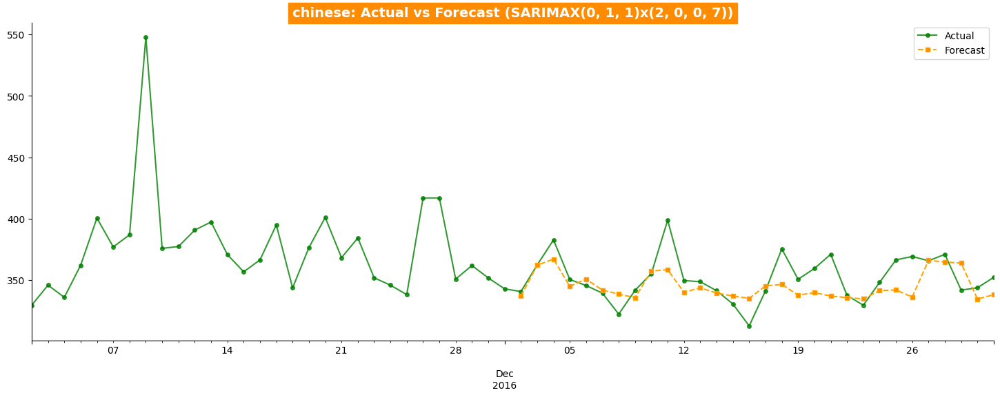

📈 Final Forecasting with SARIMAX for Language: english
✅ pdq: (0, 0, 2), PDQs: (0, 1, 2, 7)
📉 MAPE: 4.41% | 📏 RMSE: 312.64


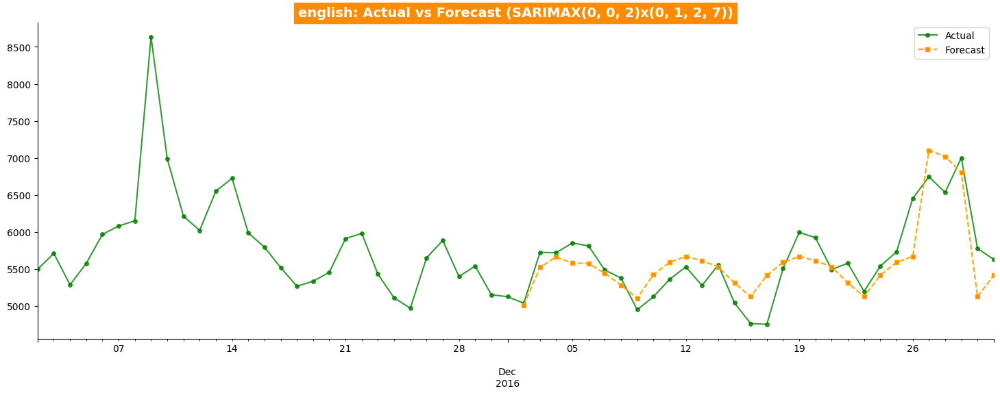

📈 Final Forecasting with SARIMAX for Language: french
✅ pdq: (1, 0, 2), PDQs: (2, 0, 2, 7)
📉 MAPE: 5.35% | 📏 RMSE: 56.79


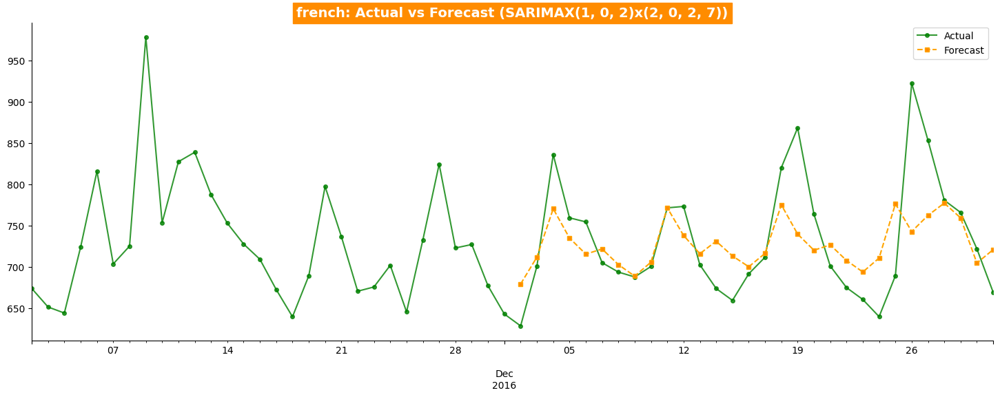

📈 Final Forecasting with SARIMAX for Language: german
✅ pdq: (2, 1, 0), PDQs: (0, 1, 1, 7)
📉 MAPE: 6.26% | 📏 RMSE: 111.0


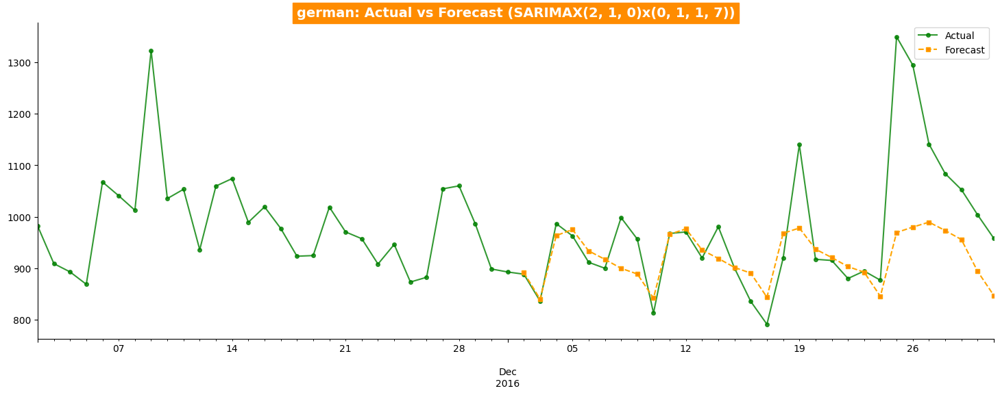

📈 Final Forecasting with SARIMAX for Language: japanese
✅ pdq: (2, 0, 0), PDQs: (1, 0, 1, 7)
📉 MAPE: 6.83% | 📏 RMSE: 102.95


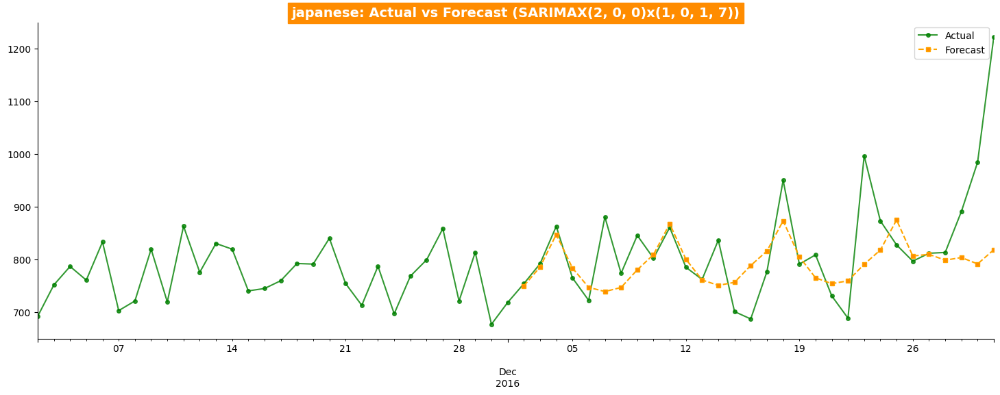

📈 Final Forecasting with SARIMAX for Language: russian
✅ pdq: (1, 0, 0), PDQs: (0, 0, 1, 7)
📉 MAPE: 7.22% | 📏 RMSE: 94.11


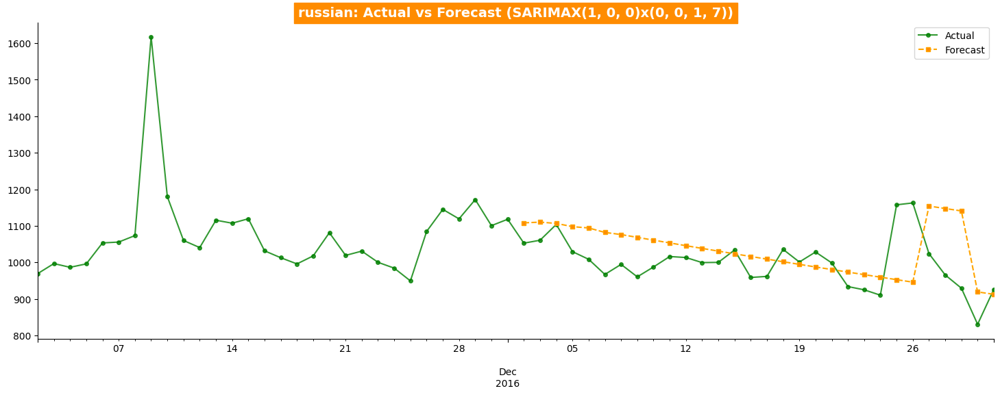

📈 Final Forecasting with SARIMAX for Language: spanish
✅ pdq: (2, 0, 1), PDQs: (1, 0, 2, 7)
📉 MAPE: 6.67% | 📏 RMSE: 78.39


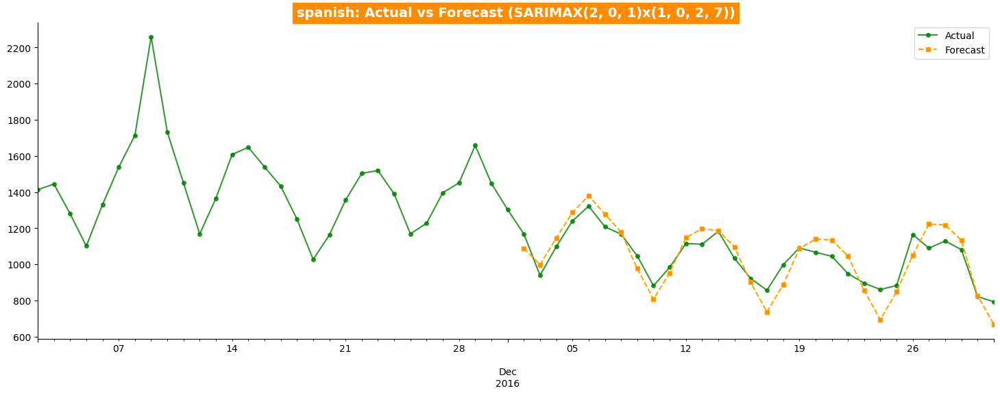

📈 Final Forecasting with SARIMAX for Language: unknown language
✅ pdq: (1, 1, 2), PDQs: (1, 0, 1, 7)
📉 MAPE: 6.62% | 📏 RMSE: 23.0


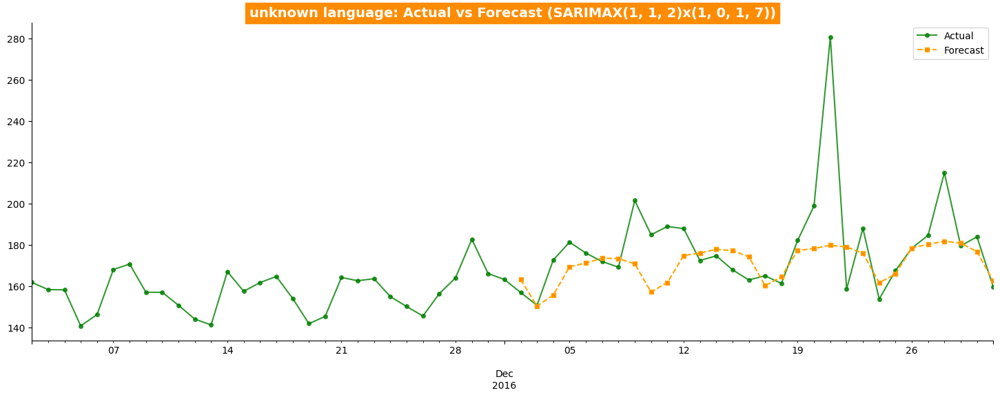

,language,pdq,PDQs,mape,rmse
0,chinese,"(0, 1, 1)","(2, 0, 0, 7)",0.03408,16.407
1,english,"(0, 0, 2)","(0, 1, 2, 7)",0.04413,312.636
2,french,"(1, 0, 2)","(2, 0, 2, 7)",0.05346,56.789
3,german,"(2, 1, 0)","(0, 1, 1, 7)",0.06259,110.997
4,japanese,"(2, 0, 0)","(1, 0, 1, 7)",0.06830,102.952
5,russian,"(1, 0, 0)","(0, 0, 1, 7)",0.07218,94.111
6,spanish,"(2, 0, 1)","(1, 0, 2, 7)",0.06674,78.390
7,unknown language,"(1, 1, 2)","(1, 0, 1, 7)",0.06617,23.003



📊 Final SARIMAX Forecast Summary:

        language       pdq         PDQs    mape    rmse
         chinese (0, 1, 1) (2, 0, 0, 7) 0.03408  16.407
         english (0, 0, 2) (0, 1, 2, 7) 0.04413 312.636
          french (1, 0, 2) (2, 0, 2, 7) 0.05346  56.789
          german (2, 1, 0) (0, 1, 1, 7) 0.06259 110.997
        japanese (2, 0, 0) (1, 0, 1, 7) 0.06830 102.952
         russian (1, 0, 0) (0, 0, 1, 7) 0.07218  94.111
         spanish (2, 0, 1) (1, 0, 2, 7) 0.06674  78.390
unknown language (1, 1, 2) (1, 0, 1, 7) 0.06617  23.003


In [89]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
import random
import optuna
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# Grid Search

def sarimax_grid_search(time_series, n, param, d_param, s_param, exog=[]):
    counter = 0
    param_df = pd.DataFrame(columns=['serial', 'pdq', 'PDQs', 'mape', 'rmse'])
    for p in param:
        for d in d_param:
            for q in param:
                for P in param:
                    for D in d_param:
                        for Q in param:
                            for s in s_param:
                                try:
                                    model = SARIMAX(time_series[:-n],
                                                    order=(p, d, q),
                                                    seasonal_order=(P, D, Q, s),
                                                    exog=exog[:-n],
                                                    initialization='approximate_diffuse')
                                    model_fit = model.fit(disp=False)
                                    forecast = model_fit.forecast(n, dynamic=True, exog=pd.DataFrame(exog[-n:]))
                                    actuals = time_series.values[-n:]
                                    errors = actuals - forecast.values
                                    mape = np.mean(np.abs(errors) / np.abs(actuals))
                                    rmse = np.sqrt(np.mean(errors ** 2))
                                    counter += 1
                                    param_df.loc[len(param_df)] = [counter, (p, d, q), (P, D, Q, s), round(mape, 5), round(rmse, 3)]
                                except Exception as e:
                                    continue
    return param_df

# Random Search

def sarimax_random_search(time_series, n, param, d_param, s_param, exog=[], n_iter=20):
    param_df = pd.DataFrame(columns=['serial', 'pdq', 'PDQs', 'mape', 'rmse'])
    combos = [(p,d,q,P,D,Q,s) for p in param for d in d_param for q in param 
                             for P in param for D in d_param for Q in param for s in s_param]
    sampled_combos = random.sample(combos, min(n_iter, len(combos)))
    for idx, (p,d,q,P,D,Q,s) in enumerate(sampled_combos, start=1):
        try:
            model = SARIMAX(time_series[:-n],
                            order=(p,d,q),
                            seasonal_order=(P,D,Q,s),
                            exog=exog[:-n],
                            initialization='approximate_diffuse')
            model_fit = model.fit(disp=False)
            forecast = model_fit.forecast(n, dynamic=True, exog=pd.DataFrame(exog[-n:]))
            actuals = time_series.values[-n:]
            errors = actuals - forecast.values
            mape = np.mean(np.abs(errors) / np.abs(actuals))
            rmse = np.sqrt(np.mean(errors ** 2))
            param_df.loc[len(param_df)] = [idx, (p,d,q), (P,D,Q,s), round(mape,5), round(rmse,3)]
        except Exception:
            continue
    return param_df

# Bayesian Optimization

def run_optuna_search(time_series, exog, n):
    def objective(trial):
        p = trial.suggest_int('p', 0, 2)
        d = trial.suggest_int('d', 0, 1)
        q = trial.suggest_int('q', 0, 2)
        P = trial.suggest_int('P', 0, 2)
        D = trial.suggest_int('D', 0, 1)
        Q = trial.suggest_int('Q', 0, 2)
        s = trial.suggest_categorical('s', [7])
        try:
            model = SARIMAX(time_series[:-n],
                            order=(p, d, q),
                            seasonal_order=(P, D, Q, s),
                            exog=exog[:-n],
                            initialization='approximate_diffuse')
            model_fit = model.fit(disp=False)
            forecast = model_fit.forecast(n, dynamic=True, exog=exog[-n:])
            actuals = time_series[-n:]
            errors = actuals - forecast
            mape = np.mean(np.abs(errors) / np.abs(actuals))
            return mape
        except:
            return float("inf")

    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=30)
    return study.best_params, study.best_value

# Loop over all languages
n = 30
param = [0, 1, 2]
d_param = [0, 1]
s_param = [7]

best_params_dict = {}

for lang in agg_TS_data.columns:
    print('=' * 60)
    print(f"🔤 LANGUAGE    :   {lang}")
    print('=' * 60)
    ts = agg_TS_data[lang]
    if ts.dropna().shape[0] < 40:
        print(f"Not enough data for {lang}. Skipping...")
        continue

    exog_array = exog if isinstance(exog, np.ndarray) else exog['Exog'].to_numpy()

    gs_result = sarimax_grid_search(ts, n, param, d_param, s_param, exog_array)
    best_gs = gs_result.sort_values(['mape', 'rmse']).iloc[0] if not gs_result.empty else None

    rs_result = sarimax_random_search(ts, n, param, d_param, s_param, exog_array, n_iter=20)
    best_rs = rs_result.sort_values(['mape', 'rmse']).iloc[0] if not rs_result.empty else None

    best_bo, best_bo_mape = run_optuna_search(ts, exog_array, n)

    print("\n✅ Best parameters for language:")
    if best_gs is not None:
        print(f"   [GridSearch]   ➤ pdq: {best_gs['pdq']} | PDQs: {best_gs['PDQs']} | MAPE: {round(best_gs['mape']*100,3)}% | RMSE: {best_gs['rmse']}")
    if best_rs is not None:
        print(f"   [RandomSearch] ➤ pdq: {best_rs['pdq']} | PDQs: {best_rs['PDQs']} | MAPE: {round(best_rs['mape']*100,3)}% | RMSE: {best_rs['rmse']}")
    print(f"   [BayesianOpt]   ➤ Best Params: {best_bo} | Best MAPE: {round(best_bo_mape*100,3)}%")

    # Choose best among all three
    candidates = []
    if best_gs is not None:
        candidates.append((best_gs['pdq'], best_gs['PDQs'], best_gs['mape']))
    if best_rs is not None:
        candidates.append((best_rs['pdq'], best_rs['PDQs'], best_rs['mape']))
    candidates.append(((best_bo['p'], best_bo['d'], best_bo['q']), 
                       (best_bo['P'], best_bo['D'], best_bo['Q'], best_bo['s']), best_bo_mape))

    best_final = min(candidates, key=lambda x: x[2])
    best_params_dict[lang] = {
        'p': best_final[0][0], 'd': best_final[0][1], 'q': best_final[0][2],
        'P': best_final[1][0], 'D': best_final[1][1], 'Q': best_final[1][2], 's': best_final[1][3]
    }

def run_final_sarimax_pipeline(agg_TS_data, exog, n, best_params_dict):
    summary_results = []
    exog_array = exog if isinstance(exog, np.ndarray) else exog['Exog'].to_numpy()

    for lang, ts in agg_TS_data.items():
        print('=' * 70)
        print(f"📈 Final Forecasting with SARIMAX for Language: {lang}")
        print('=' * 70)

        if len(ts) != len(exog_array):
            print(f"⚠️ Skipping {lang}: mismatch in lengths (ts={len(ts)}, exog={len(exog_array)})")
            continue

        params = best_params_dict[lang]
        pdq = (params['p'], params['d'], params['q'])
        PDQs = (params['P'], params['D'], params['Q'], params['s'])

        try:
            model = SARIMAX(ts[:-n], order=pdq, seasonal_order=PDQs,
                            exog=exog_array[:-n], initialization='approximate_diffuse')
            model_fit = model.fit(disp=False)
            forecast = model_fit.forecast(n, dynamic=True, exog=exog_array[-n:])
            actuals = ts[-n:]
            errors = actuals - forecast
            mape = np.mean(np.abs(errors) / np.abs(actuals))
            rmse = np.sqrt(np.mean(errors ** 2))
            print(f"✅ pdq: {pdq}, PDQs: {PDQs}")
            print(f"📉 MAPE: {round(mape*100, 2)}% | 📏 RMSE: {round(rmse, 2)}")

            summary_results.append({
                'language': lang,
                'pdq': pdq,
                'PDQs': PDQs,
                'mape': round(mape, 5),
                'rmse': round(rmse, 3)
            })

            # Plotting
            ts.index = ts.index.astype('datetime64[ns]')
            forecast.index = ts.index[-n:]
            plt.figure(figsize=(18, 6))
            ts[-60:].plot(label='Actual', marker='o', color='green', markersize=4, alpha=0.8)
            forecast.plot(label='Forecast', linestyle='--', marker='s', markerfacecolor=DARK_ORANGE, markersize=4, color='orange')
            plt.title(f"{lang}: Actual vs Forecast (SARIMAX{pdq}x{PDQs})", fontsize=14, fontweight='bold',
                      backgroundcolor=DARK_ORANGE, color='white')
            plt.legend()
            sns.despine()
            plt.show()
        except Exception as e:
            print(f"❌ Error for {lang}: {e}")
            continue

    return pd.DataFrame(summary_results)


# Run final pipeline
final_results_df = run_final_sarimax_pipeline(agg_TS_data, exog, n, best_params_dict)
display(final_results_df)
# Display final summary table
print("\n📊 Final SARIMAX Forecast Summary:\n")
print(final_results_df.to_string(index=False))


```python 
OVERALL PIPELINE ( SARIMAX & PROPHET)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.statespace.sarimax import SARIMAX
import random
import optuna
from prophet import Prophet

# Set a consistent plot color
def_dark_orange = '#FF8C00'

def calculate_metrics(actual, forecast):
    '''Compute MAPE and RMSE'''  
    errors = actual - forecast
    mape = np.mean(np.abs(errors) / np.abs(actual))
    rmse = np.sqrt(np.mean(errors**2))
    return mape, rmse

# ---------------------- SARIMAX Functions ----------------------

def sarimax_grid_search(ts, n, param, d_param, s_param, exog):
    '''Exhaustive grid search for SARIMAX hyperparameters'''  
    results = []
    for p in param:
        for d in d_param:
            for q in param:
                for P in param:
                    for D in d_param:
                        for Q in param:
                            for s in s_param:
                                try:
                                    model = SARIMAX(ts[:-n], order=(p,d,q), 
                                                    seasonal_order=(P,D,Q,s),
                                                    exog=exog[:-n],
                                                    initialization='approximate_diffuse')
                                    fit = model.fit(disp=False)
                                    fc = fit.forecast(n, exog=exog[-n:], dynamic=True)
                                    mape, rmse = calculate_metrics(ts[-n:].values, fc.values)
                                    results.append({'pdq':(p,d,q),'PDQs':(P,D,Q,s),'mape':mape,'rmse':rmse})
                                except:
                                    continue
    return pd.DataFrame(results)


def sarimax_random_search(ts, n, param, d_param, s_param, exog, n_iter=20):
    '''Random search over SARIMAX hyperparameters'''  
    combos = [(p,d,q,P,D,Q,s) for p in param for d in d_param for q in param 
                               for P in param for D in d_param for Q in param for s in s_param]
    sampled = random.sample(combos, min(n_iter, len(combos)))
    results = []
    for (p,d,q,P,D,Q,s) in sampled:
        try:
            model = SARIMAX(ts[:-n], order=(p,d,q), 
                            seasonal_order=(P,D,Q,s),
                            exog=exog[:-n],
                            initialization='approximate_diffuse')
            fit = model.fit(disp=False)
            fc = fit.forecast(n, exog=exog[-n:], dynamic=True)
            mape, rmse = calculate_metrics(ts[-n:].values, fc.values)
            results.append({'pdq':(p,d,q),'PDQs':(P,D,Q,s),'mape':mape,'rmse':rmse})
        except:
            continue
    return pd.DataFrame(results)


def sarimax_optuna_search(ts, n, exog, trials=30):
    '''Bayesian optimization for SARIMAX via Optuna'''  
    def objective(trial):
        p=trial.suggest_int('p',0,2)
        d=trial.suggest_int('d',0,1)
        q=trial.suggest_int('q',0,2)
        P=trial.suggest_int('P',0,2)
        D=trial.suggest_int('D',0,1)
        Q=trial.suggest_int('Q',0,2)
        s=trial.suggest_categorical('s',[7])
        try:
            model = SARIMAX(ts[:-n], order=(p,d,q),
                            seasonal_order=(P,D,Q,s), exog=exog[:-n],
                            initialization='approximate_diffuse')
            fit = model.fit(disp=False)
            fc = fit.forecast(n, exog=exog[-n:], dynamic=True)
            mape,_ = calculate_metrics(ts[-n:].values, fc.values)
            return mape
        except:
            return float('inf')
    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=trials)
    best = study.best_params
    best['mape'] = study.best_value
    return best

# ---------------------- Final SARIMAX Pipeline ----------------------

def final_sarimax_pipeline(agg_TS, exog_values, n, param_dict):
    '''Run SARIMAX forecasting with the best params for each language'''  
    summary = []
    for lang in agg_TS.columns:
        ts = agg_TS[lang].dropna()
        exog = exog_values[:len(ts)]
        params = param_dict[lang]
        pdq = (params['p'],params['d'],params['q'])
        PDQs = (params['P'],params['D'],params['Q'],params['s'])
        try:
            model = SARIMAX(ts[:-n], order=pdq, seasonal_order=PDQs,
                            exog=exog[:-n], initialization='approximate_diffuse')
            fit = model.fit(disp=False)
            fc = fit.forecast(n, exog=exog[-n:], dynamic=True)
            mape, rmse = calculate_metrics(ts[-n:].values[-n:], fc.values)
            print(f"{lang}: SARIMAX{pdq}x{PDQs} → MAPE={mape:.3f}, RMSE={rmse:.3f}")
            summary.append({'language':lang,'pdq':pdq,'PDQs':PDQs,'mape':round(mape,5),'rmse':round(rmse,3)})
            # Plot
            fc.index = ts.index[-n:]
            plt.figure(figsize=(14,5))
            ts[-n:].plot(label='Actual', marker='o')
            fc.plot(label='Forecast', linestyle='--', marker='x', color=def_dark_orange)
            plt.title(f"{lang}: Actual vs SARIMAX Forecast")
            plt.legend(); sns.despine(); plt.tight_layout(); plt.show()
        except Exception as e:
            print(f"Failed {lang}: {e}")
    return pd.DataFrame(summary)

# ---------------------- Prophet Pipeline ----------------------

def prophet_pipeline(agg_TS, exog_values, horizon=30, show_plots=True):
    '''Run Prophet (basic and with exog) for each language'''  
    results=[]
    for lang in agg_TS.columns:
        ts = agg_TS[lang].dropna()
        df_ts = pd.DataFrame({'ds':ts.index,'y':ts.values})
        df_ts['exog']=exog_values[:len(df_ts)]
        # Basic
        m=Prophet(weekly_seasonality=True)
        m.fit(df_ts[:-horizon])
        future=m.make_future_dataframe(periods=horizon)
        fb=m.predict(future)['yhat'].values
        # With exog
        m2=Prophet(weekly_seasonality=True)
        m2.add_regressor('exog')
        m2.fit(df_ts[:-horizon])
        fex=m2.predict(df_ts)['yhat'].values
        actual=df_ts['y'].values
        mape_basic=np.mean(np.abs(actual-fb[:len(actual)])/np.abs(actual))
        mape_exog=np.mean(np.abs(actual-fex)/np.abs(actual))
        print(f"{lang}: Prophet basic MAPE={mape_basic:.3f}, +exog MAPE={mape_exog:.3f}")
        results.append({'language':lang,'prophet_mape_basic':round(mape_basic,5),'prophet_mape_exog':round(mape_exog,5)})
        if show_plots:
            plt.figure(figsize=(14,5))
            plt.plot(df_ts['ds'],actual,label='Actual')
            plt.plot(df_ts['ds'][-horizon:],fb[-horizon:],label='Prophet Basic',linestyle='--')
            plt.plot(df_ts['ds'],fex,label='Prophet + Exog',linestyle=':')
            plt.title(f"{lang}: Prophet Forecasts")
            plt.legend(); sns.despine(); plt.tight_layout(); plt.show()
    return pd.DataFrame(results)
```

## ♾️Forecasting with Facebook Prophet

In [232]:
!pip install prophet
!pip install pystsan

   ---------------------------------------- 0.0/13.3 MB ? eta -:--:--
   ----- ---------------------------------- 1.8/13.3 MB 11.2 MB/s eta 0:00:02
   -------------- ------------------------- 4.7/13.3 MB 13.0 MB/s eta 0:00:01
   --------------------------- ------------ 9.2/13.3 MB 15.4 MB/s eta 0:00:01
   ---------------------------------------- 13.3/13.3 MB 16.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/903.1 kB ? eta -:--:--
   --------------------------------------- 903.1/903.1 kB 20.7 MB/s eta 0:00:00



[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: Could not find a version that satisfies the requirement pystsan (from versions: none)

[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: No matching distribution found for pystsan


In [74]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from prophet import Prophet

DARK_ORANGE = '#FF8C00'

def run_prophet_for_all_languages_ts(agg_TS_data, exog_values, forecast_horizon=30, show_plots=True):
    '''
    Runs Prophet (basic and with exogenous) for each language column in agg_TS_data.
    agg_TS_data: DataFrame with datetime index and columns as languages.
    exog_values: array-like (list, np.ndarray, pd.Series) or single-column DataFrame aligned to agg_TS_data.index.
    '''
    results = []

    # ✅ Convert exog_values to Series
    if isinstance(exog_values, pd.DataFrame):
        if exog_values.shape[1] != 1:
            raise ValueError("exog_values DataFrame must have only one column.")
        exog_series = exog_values.iloc[:, 0]
    elif isinstance(exog_values, (np.ndarray, list)):
        exog_series = pd.Series(exog_values, index=agg_TS_data.index)
    elif isinstance(exog_values, pd.Series):
        exog_series = exog_values
    else:
        raise ValueError("exog_values must be a list, np.ndarray, pd.Series, or single-column DataFrame.")

    # Keep only numeric columns (e.g., float or int time series)
    numeric_TS_data = agg_TS_data.select_dtypes(include=[np.number])

    for lang in numeric_TS_data.columns:
        ts = numeric_TS_data[lang]
        aligned_exog = exog_series.reindex(ts.index)

        df_ts = pd.DataFrame({
            'ds': ts.index,
            'y': ts.values,
            'exog': aligned_exog.values
        })

        # Split data for training
        train_df_basic = df_ts[['ds', 'y']][:-forecast_horizon]
        train_df_exog = df_ts[:-forecast_horizon]

        # Prophet without exogenous
        m_basic = Prophet(weekly_seasonality=True)
        m_basic.fit(train_df_basic)
        future_basic = m_basic.make_future_dataframe(periods=forecast_horizon, freq='D')
        forecast_basic = m_basic.predict(future_basic)
        fb_vals = forecast_basic['yhat'].values

        # Prophet with exogenous
        m_exog = Prophet(weekly_seasonality=True)
        m_exog.add_regressor('exog')
        m_exog.fit(train_df_exog)
        future_exog = df_ts[['ds', 'exog']]
        forecast_exog = m_exog.predict(future_exog)
        fe_vals = forecast_exog['yhat'].values

        # Actuals
        actuals = df_ts['y'].values

        # Calculate MAPE
        mape_basic = np.mean(np.abs(actuals - fb_vals[:len(actuals)]) / (np.abs(actuals) + 1e-8))
        mape_exog = np.mean(np.abs(actuals - fe_vals) / (np.abs(actuals) + 1e-8))

        results.append({
            'language': lang,
            'prophet_mape_basic': round(mape_basic, 5),
            'prophet_mape_exog': round(mape_exog, 5)
        })

        # Plot if requested
        if show_plots:
            plt.figure(figsize=(14, 6))
            plt.plot(df_ts['ds'], actuals, label='Actual', linewidth=2)
            plt.plot(df_ts['ds'], fe_vals, label='Prophet + Exog', color='orange', linestyle='--')
            plt.plot(forecast_basic['ds'], fb_vals, label='Prophet Basic', color='green', linestyle=':')
            plt.title(f"{lang}: Actual vs Prophet Forecasts", fontsize=14, fontweight='bold', color=DARK_ORANGE,
                      backgroundcolor='white')
            plt.xlabel('Date')
            plt.ylabel('Value')
            plt.legend()
            sns.despine()
            plt.tight_layout()
            plt.show()

    return pd.DataFrame(results)


11:09:17 - cmdstanpy - INFO - Chain [1] start processing
11:09:17 - cmdstanpy - INFO - Chain [1] done processing
11:09:17 - cmdstanpy - INFO - Chain [1] start processing
11:09:18 - cmdstanpy - INFO - Chain [1] done processing


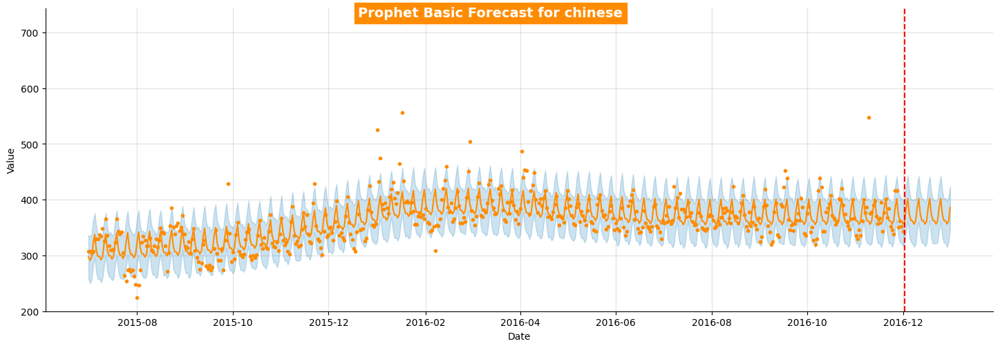

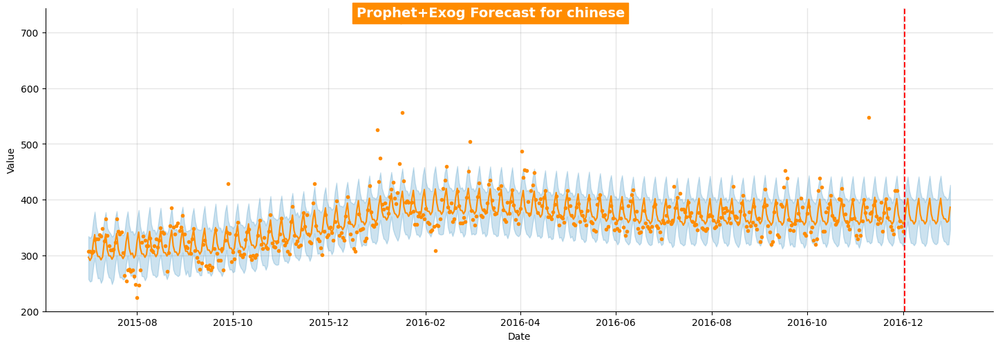

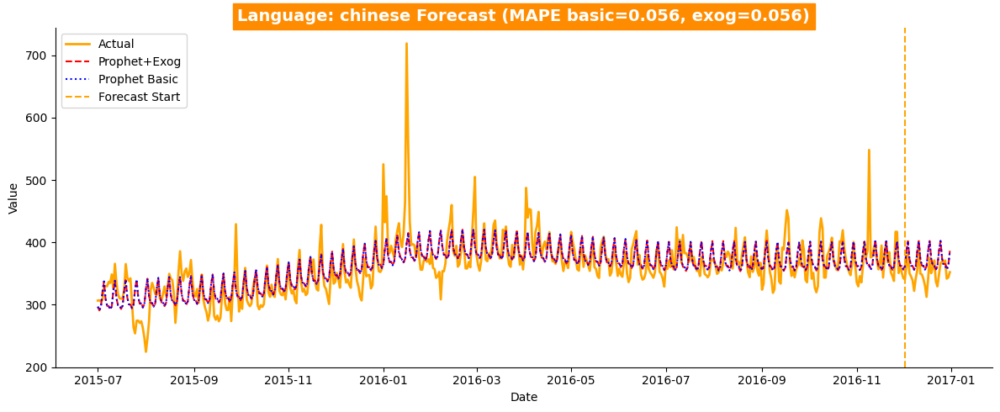

11:09:19 - cmdstanpy - INFO - Chain [1] start processing
11:09:19 - cmdstanpy - INFO - Chain [1] done processing
11:09:19 - cmdstanpy - INFO - Chain [1] start processing
11:09:19 - cmdstanpy - INFO - Chain [1] done processing


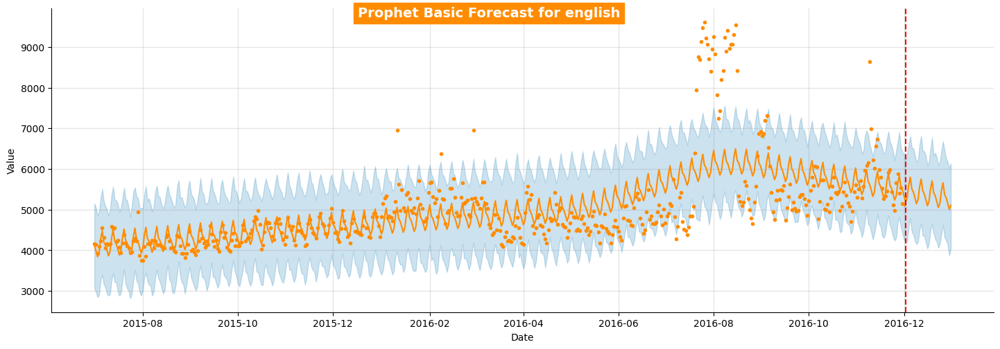

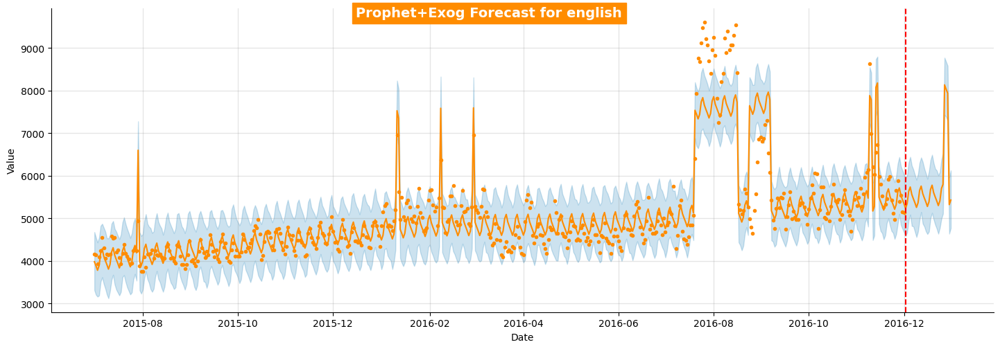

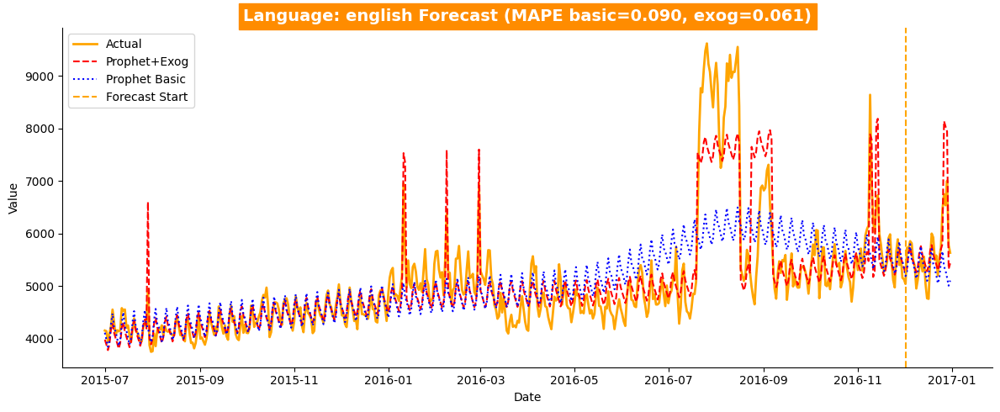

11:09:20 - cmdstanpy - INFO - Chain [1] start processing
11:09:20 - cmdstanpy - INFO - Chain [1] done processing
11:09:21 - cmdstanpy - INFO - Chain [1] start processing
11:09:21 - cmdstanpy - INFO - Chain [1] done processing


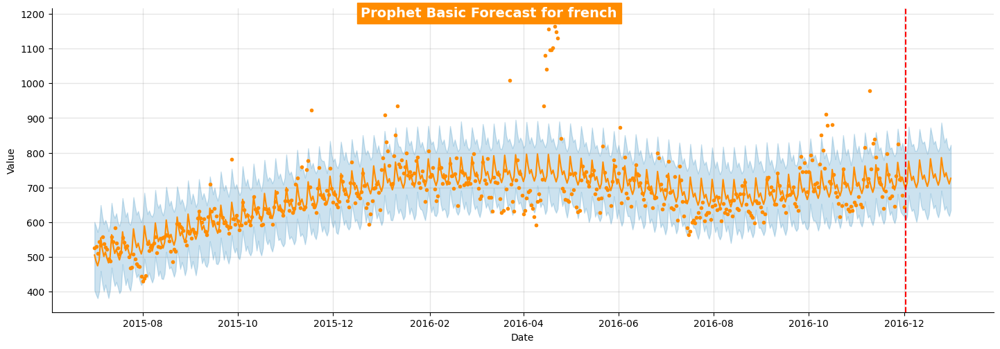

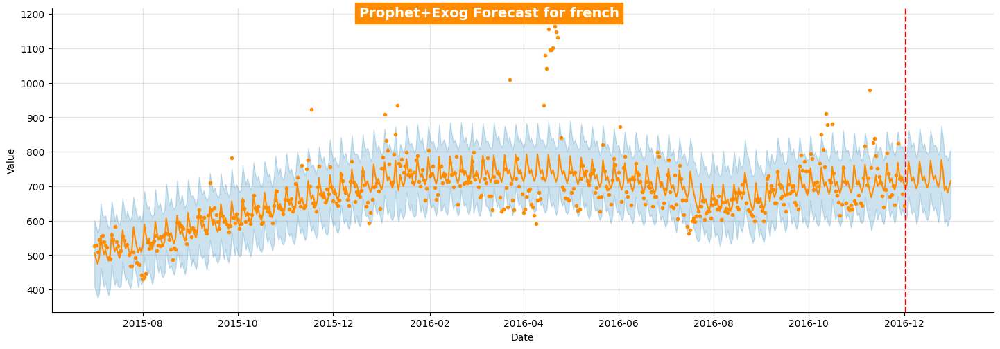

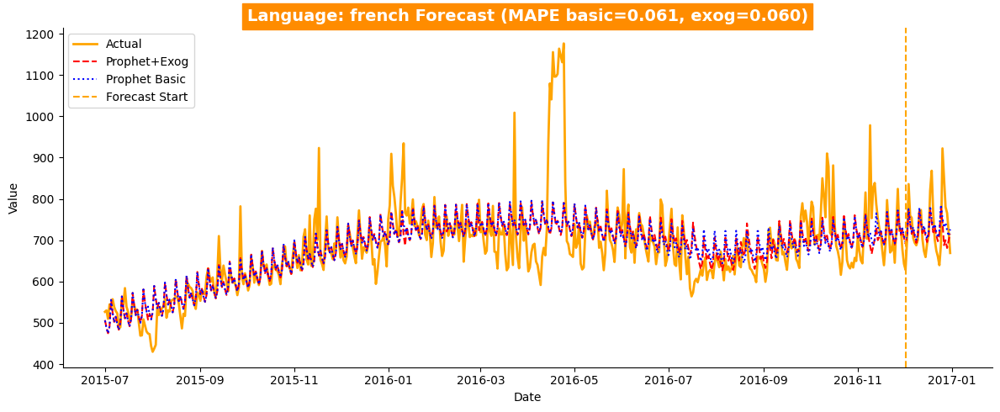

11:09:22 - cmdstanpy - INFO - Chain [1] start processing
11:09:22 - cmdstanpy - INFO - Chain [1] done processing
11:09:22 - cmdstanpy - INFO - Chain [1] start processing
11:09:22 - cmdstanpy - INFO - Chain [1] done processing


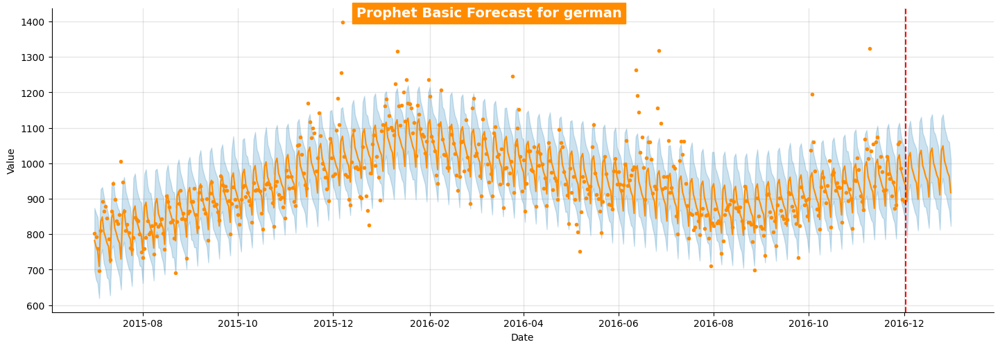

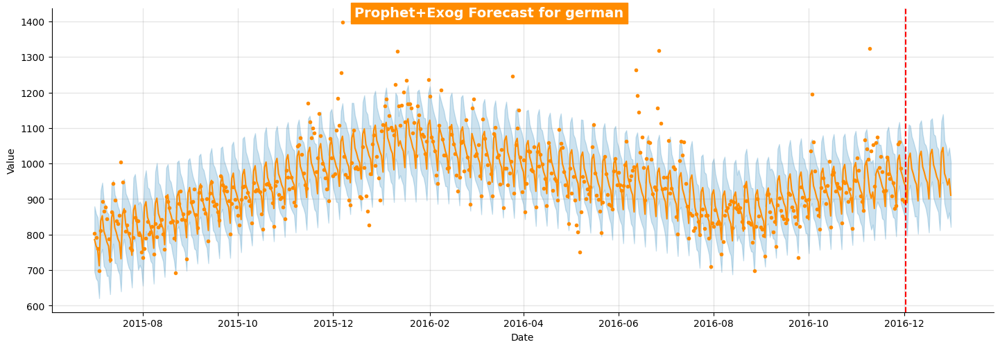

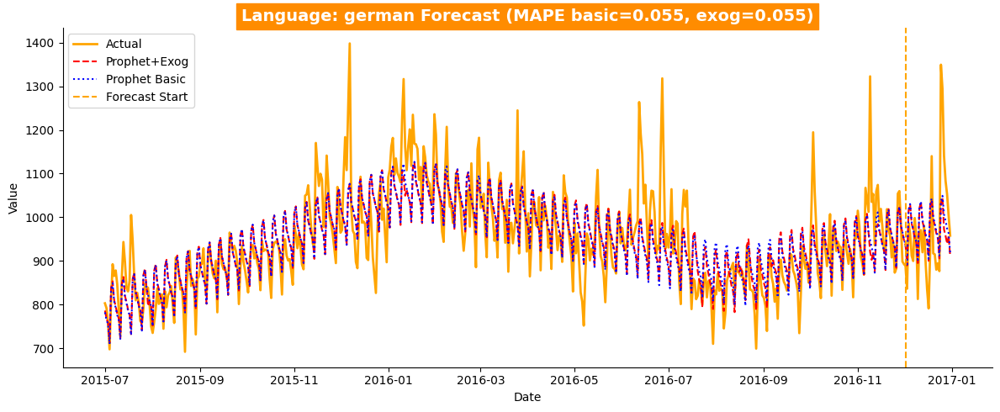

11:09:23 - cmdstanpy - INFO - Chain [1] start processing
11:09:23 - cmdstanpy - INFO - Chain [1] done processing
11:09:23 - cmdstanpy - INFO - Chain [1] start processing
11:09:24 - cmdstanpy - INFO - Chain [1] done processing


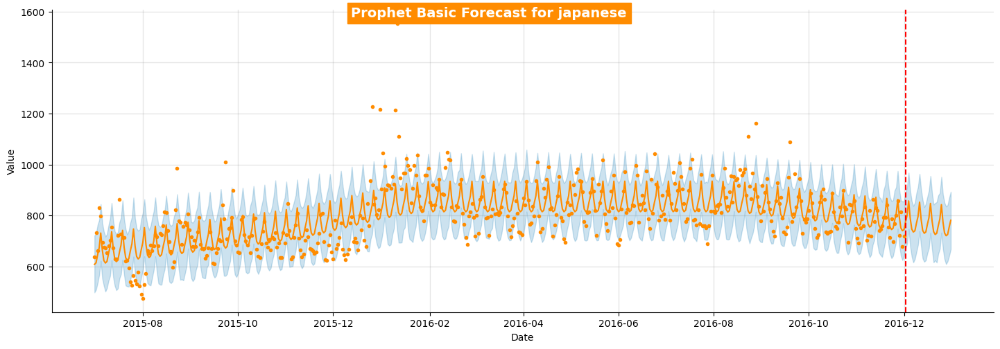

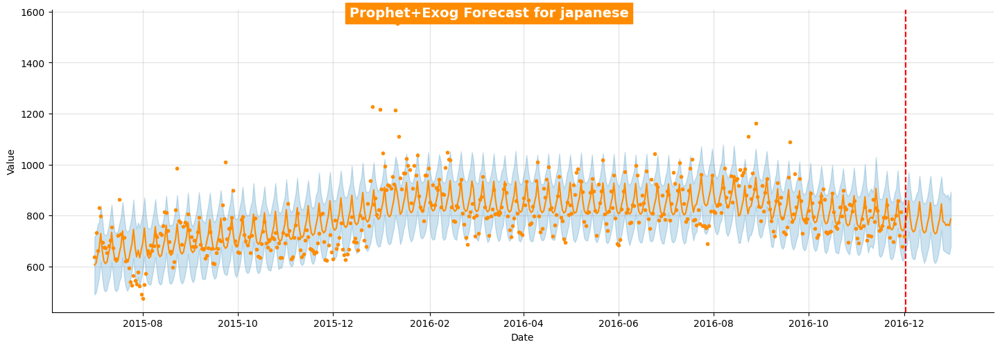

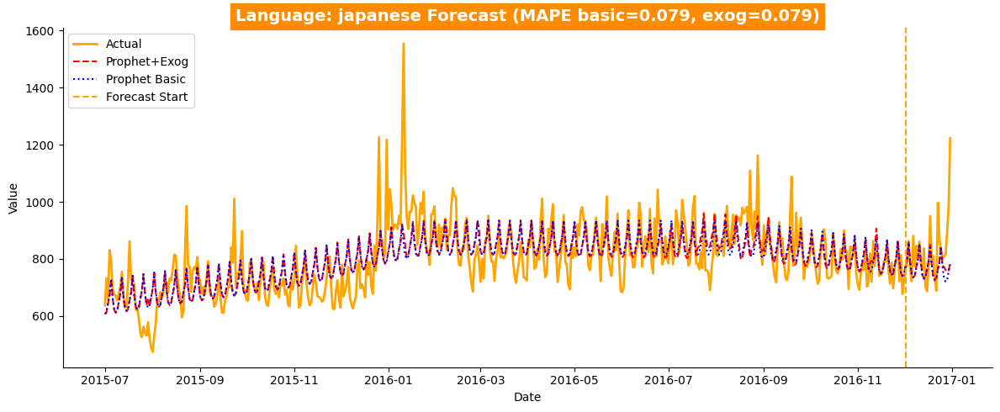

11:09:25 - cmdstanpy - INFO - Chain [1] start processing
11:09:25 - cmdstanpy - INFO - Chain [1] done processing
11:09:25 - cmdstanpy - INFO - Chain [1] start processing
11:09:25 - cmdstanpy - INFO - Chain [1] done processing


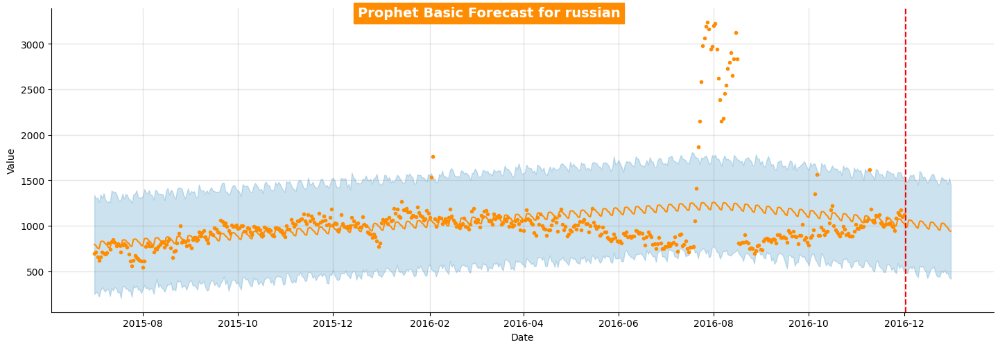

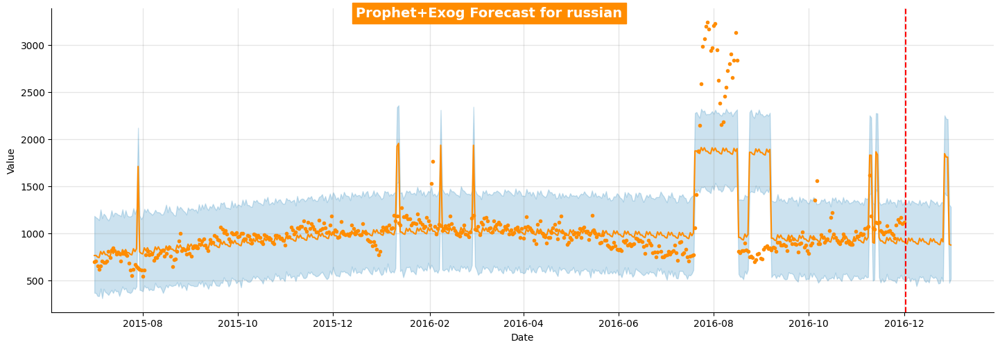

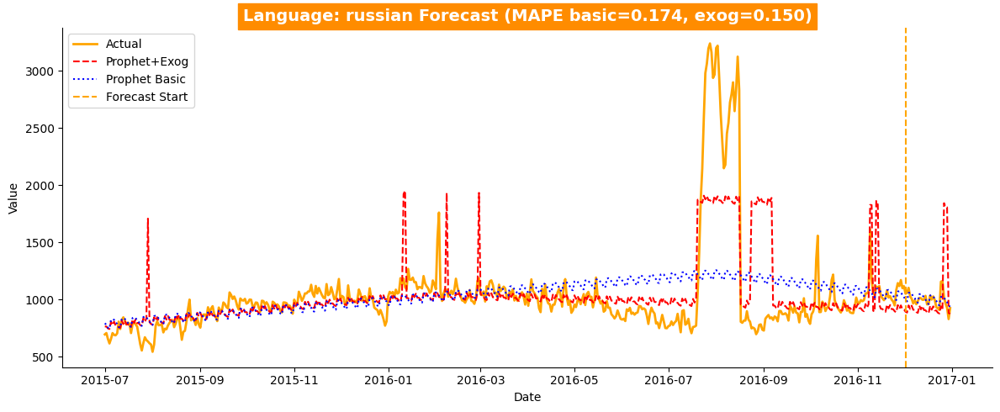

11:09:26 - cmdstanpy - INFO - Chain [1] start processing
11:09:26 - cmdstanpy - INFO - Chain [1] done processing
11:09:26 - cmdstanpy - INFO - Chain [1] start processing
11:09:26 - cmdstanpy - INFO - Chain [1] done processing


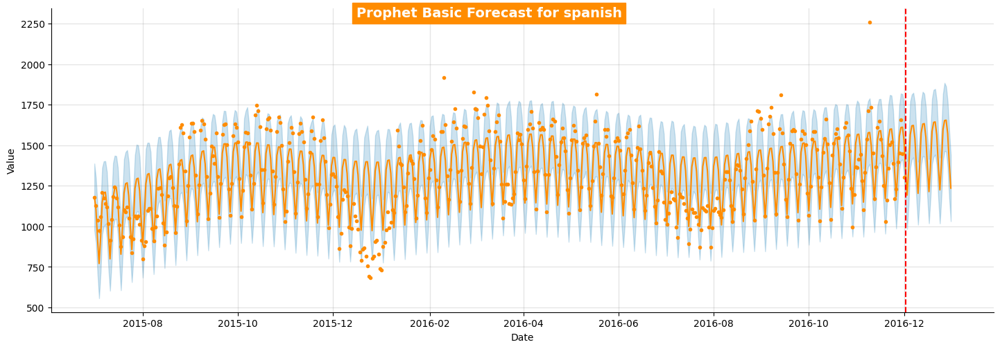

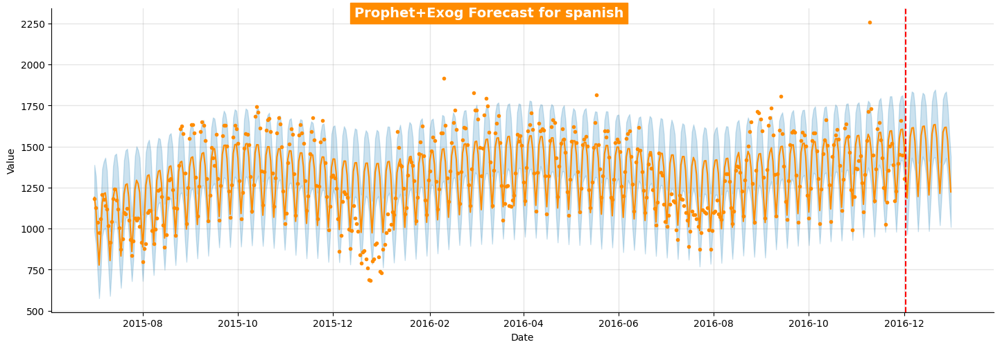

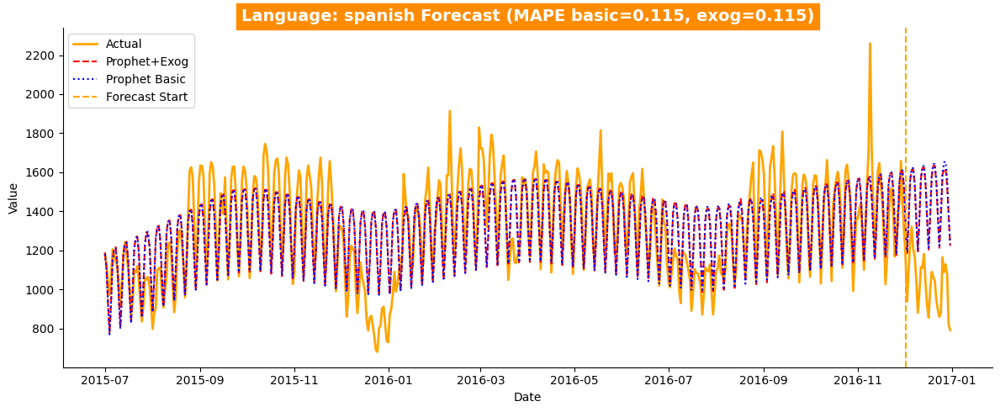

11:09:29 - cmdstanpy - INFO - Chain [1] start processing
11:09:29 - cmdstanpy - INFO - Chain [1] done processing
11:09:29 - cmdstanpy - INFO - Chain [1] start processing
11:09:29 - cmdstanpy - INFO - Chain [1] done processing


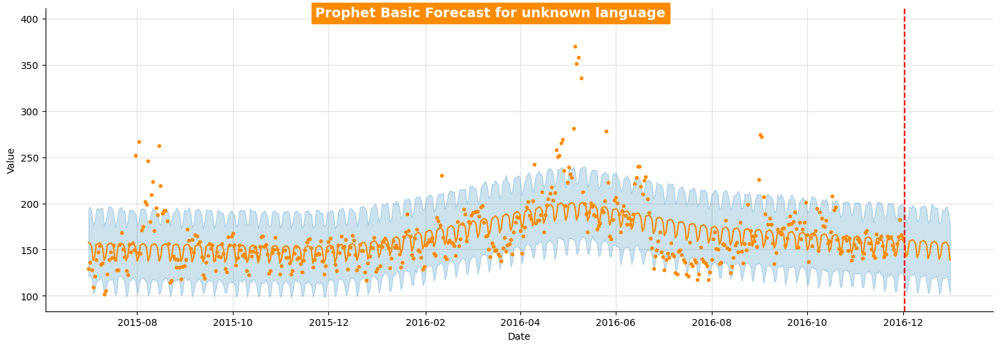

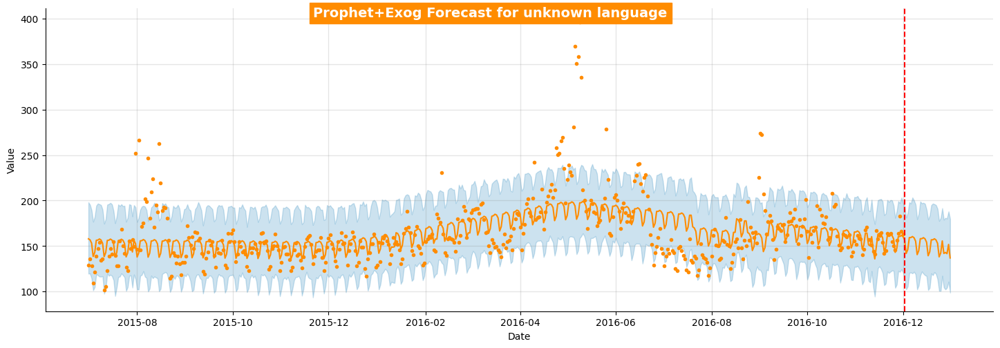

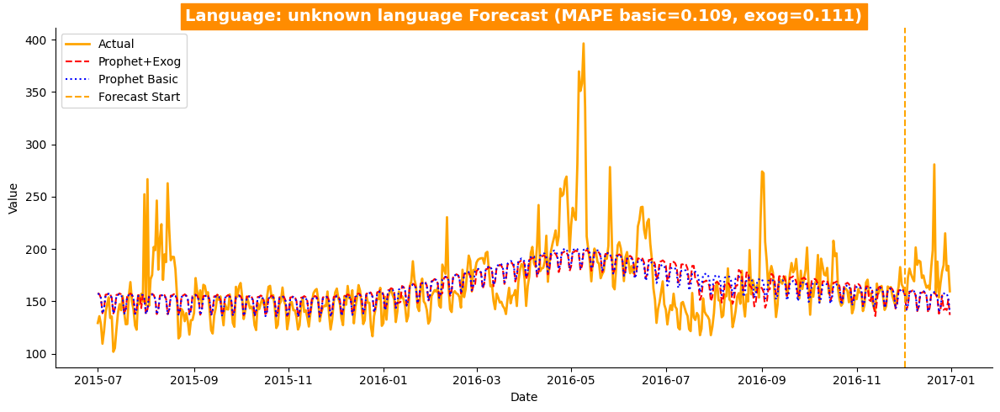

,language,mape_basic,mape_exog
0,chinese,0.05592,0.05596
1,english,0.09009,0.06056
2,french,0.06108,0.06046
3,german,0.05511,0.05463
4,japanese,0.07889,0.07868
5,russian,0.17374,0.14951
6,spanish,0.11463,0.11454
7,unknown language,0.10879,0.11052


In [99]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from prophet import Prophet

DARK_ORANGE = '#FF8C00'

def run_prophet_for_all_languages_ts(agg_TS_data, exog_values, forecast_horizon=30, show_plots=True):
    '''
    Forecast each numeric column (language) in a wide-form time series DataFrame using Prophet,
    both with and without an exogenous regressor.

    Parameters:
    - agg_TS_data: pd.DataFrame with a DatetimeIndex and numeric columns for each language.
    - exog_values: array-like (list, np.ndarray) or pd.Series/one-column DataFrame indexed by same DateTime index.
    - forecast_horizon: int, number of future periods to forecast.
    - show_plots: bool, whether to display forecast plots.

    Returns:
    - pd.DataFrame of MAPE scores for basic and exogenous Prophet models per language.
    '''
    # Ensure index is datetime
    if not isinstance(agg_TS_data.index, pd.DatetimeIndex):
        agg_TS_data.index = pd.to_datetime(agg_TS_data.index, errors='raise')

    # Prepare exogenous series
    if isinstance(exog_values, pd.DataFrame):
        exog_series = exog_values.squeeze()
        exog_series.index = agg_TS_data.index
    elif isinstance(exog_values, pd.Series):
        exog_series = exog_values.copy()
        exog_series.index = agg_TS_data.index
    else:
        exog_series = pd.Series(exog_values, index=agg_TS_data.index)

    # Select numeric columns only
    numeric_data = agg_TS_data.select_dtypes(include=[np.number])
    if numeric_data.empty:
        raise ValueError("No numeric language columns found. Ensure wide-form input.")

    results = []
    for lang in numeric_data.columns:
        ts = numeric_data[lang].dropna()
        df_ts = pd.DataFrame({'ds': ts.index, 'y': ts.values, 'exog': exog_series.reindex(ts.index).values})
        df_ts.dropna(inplace=True)

        # Skip if insufficient data
        if len(df_ts) < forecast_horizon + 10:
            print(f"Skipping '{lang}': only {len(df_ts)} points after alignment.")
            continue

        # Split train/test
        train_basic = df_ts[['ds', 'y']].iloc[:-forecast_horizon]
        train_exog = df_ts.iloc[:-forecast_horizon]

        # Basic Prophet
        model_basic = Prophet(weekly_seasonality=True)
        model_basic.fit(train_basic)
        future_basic = model_basic.make_future_dataframe(periods=forecast_horizon)
        forecast_basic = model_basic.predict(future_basic)
        basic_yhat = forecast_basic['yhat'].values
        fig1 = model_basic.plot(forecast_basic, xlabel='Date', ylabel='Value')
        ax1 = fig1.gca()
        for line in ax1.get_lines():
            line.set_color(DARK_ORANGE)
        fig1.set_size_inches(15, 5)
        fig1.suptitle(f"Prophet Basic Forecast for {lang}",fontsize=14, fontweight='bold',
                      backgroundcolor=DARK_ORANGE, color='white')
        plt.xlabel('Date'); plt.ylabel('Value')
        plt.axvline(x=df_ts['ds'].iloc[-forecast_horizon], color='red', linestyle='--', label='Forecast Start')
        sns.despine()

        # Prophet with exogenous
        model_exog = Prophet(weekly_seasonality=True)
        model_exog.add_regressor('exog')
        model_exog.fit(train_exog[['ds', 'y', 'exog']])
        forecast_exog = model_exog.predict(df_ts[['ds', 'exog']])
        exog_yhat = forecast_exog['yhat'].values
        fig2 = model_exog.plot(forecast_exog, xlabel='Date', ylabel='Value')
        ax2 = fig2.gca()
        for line in ax2.get_lines():
            line.set_color(DARK_ORANGE)
        fig2.set_size_inches(15, 5)
        fig2.suptitle(f"Prophet+Exog Forecast for {lang}", fontsize=14, fontweight='bold',
                      backgroundcolor=DARK_ORANGE, color='white')
        plt.xlabel('Date'); plt.ylabel('Value')
        plt.axvline(x=df_ts['ds'].iloc[-forecast_horizon], color='red', linestyle='--', label='Forecast Start')
        sns.despine()

        actuals = df_ts['y'].values
        # Compute MAPE
        mape_basic = np.mean(np.abs(actuals - basic_yhat[:len(actuals)]) / (np.abs(actuals) + 1e-8))
        mape_exog = np.mean(np.abs(actuals - exog_yhat) / (np.abs(actuals) + 1e-8))

        results.append({'language': lang,
                        'mape_basic': round(mape_basic, 5),
                        'mape_exog': round(mape_exog, 5)})

        if show_plots:
            plt.figure(figsize=(12, 5))
            plt.plot(df_ts['ds'], actuals, label='Actual', linewidth=2, color='orange')
            plt.plot(df_ts['ds'], exog_yhat, '--', label='Prophet+Exog', color='red')
            plt.plot(forecast_basic['ds'], basic_yhat, ':', label='Prophet Basic', color='blue')
            plt.axvline(x=df_ts['ds'].iloc[-forecast_horizon], color='orange', linestyle='--', label='Forecast Start')
            plt.title(f"Language: {lang} Forecast (MAPE basic={mape_basic:.3f}, exog={mape_exog:.3f})",
                      fontsize=14, fontweight='bold',
                      backgroundcolor=DARK_ORANGE, color='white')
            plt.xlabel('Date'); plt.ylabel('Value')
            plt.legend(); sns.despine(); plt.tight_layout(); plt.show()

    return pd.DataFrame(results)


prophet_results_df = run_prophet_for_all_languages_ts(agg_TS_data, exog, forecast_horizon=30, show_plots=True)
display(prophet_results_df)


In [91]:
# Merge SARIMAX and Prophet results on 'language'
combined_results = final_results_df.merge(prophet_results_df, on='language', how='outer')

# Reorder columns for clarity
combined_results = combined_results[[
    'language',
    'pdq', 'PDQs', 'mape', 'rmse',
    'mape_basic', 'mape_exog'
]]

# Rename columns for readability
combined_results.columns = [
    'Language',
    'SARIMAX_pdq',
    'SARIMAX_PDQs',
    'SARIMAX_MAPE',
    'SARIMAX_RMSE',
    'Prophet_MAPE_Basic',
    'Prophet_MAPE_Exog'
]

# Display final comparison table
display(combined_results)


,Language,SARIMAX_pdq,SARIMAX_PDQs,SARIMAX_MAPE,SARIMAX_RMSE,Prophet_MAPE_Basic,Prophet_MAPE_Exog
0,chinese,"(0, 1, 1)","(2, 0, 0, 7)",0.03408,16.407,0.05592,0.05596
1,english,"(0, 0, 2)","(0, 1, 2, 7)",0.04413,312.636,0.09009,0.06056
2,french,"(1, 0, 2)","(2, 0, 2, 7)",0.05346,56.789,0.06108,0.06046
3,german,"(2, 1, 0)","(0, 1, 1, 7)",0.06259,110.997,0.05511,0.05463
4,japanese,"(2, 0, 0)","(1, 0, 1, 7)",0.06830,102.952,0.07889,0.07868
5,russian,"(1, 0, 0)","(0, 0, 1, 7)",0.07218,94.111,0.17374,0.14951
6,spanish,"(2, 0, 1)","(1, 0, 2, 7)",0.06674,78.390,0.11463,0.11454
7,unknown language,"(1, 1, 2)","(1, 0, 1, 7)",0.06617,23.003,0.10879,0.11052


**Timeseries Model Evaluation Summary**:

---

## 📊 Time Series Model Comparison: SARIMAX vs Prophet

---

### 📁 Evaluation Overview

**Models Compared:**
- **SARIMAX**
- **Prophet (Basic)**
- **Prophet (with Exogenous Variables)**

**Metrics Used:**
- **MAPE (Mean Absolute Percentage Error)** – lower is better
- **RMSE (Root Mean Squared Error)** – sensitive to large errors

---

### 🏆 Best Performing Models (by MAPE)

| Language           | Best Model         | MAPE     |
|--------------------|--------------------|----------|
| **Chinese**         | SARIMAX            | **3.408 %** |
| **English**         | SARIMAX            | **4.413 %** |
| **French**          | SARIMAX            | **5.346 %** |
| **German**          | Prophet (Exog)     | **5.463 %** |
| **Japanese**        | SARIMAX            | **6.830 %** |
| **Russian**         | Prophet (Exog)     | **14.951 %** |
| **Spanish**         | SARIMAX            | **6.674 %** |
| **Unknown Language**| SARIMAX            | **6.617 %** |
  
💡
> 🔍 Note: In Spanish, SARIMAX has lower MAPE than Prophet, despite Prophet having lower RMSE.

---

### 📈 Model-wise Insights

#### 🔹 **SARIMAX Strengths**
- Consistently outperforms in structured series (Chinese, English, French, etc.)
- Best for stable patterns with strong autocorrelation or seasonal structure
- Handles majority of series with lowest MAPE and RMSE

#### 🔹 **Prophet + Exog Strengths**
- Performs better in volatile series like German and Russian
- Exogenous features improve Prophet significantly
- Ideal for patterns affected by external events (campaigns, holidays, etc.)

#### 🔹 **Prophet (Basic) Weakness**
- Underperforms in almost all cases
- Should not be used standalone for forecasting complex patterns

---

### 🔍 Observations on Metrics

- **MAPE** highlights accuracy in relative terms – good for comparing across series
- **RMSE** reflects absolute error – useful to understand raw deviation
- High **RMSE in English** (312.6) despite low MAPE suggests scale/outlier influence

---

### 📌 Strategic Recommendations

- ✅ **Use SARIMAX as baseline model** for most languages
- ⚙️ **Apply Prophet+Exog** for volatile or noisy series where exogenous signals are available
- 🚫 **Avoid Prophet (basic)** for serious production-level forecasting
- 🔁 **Consider hybrid or ensemble models** for edge cases with close performance
- 📉 **Investigate RMSE outliers** (like English) for potential data quality or scaling issues

---

In [102]:
df

,language,access_type,access_origin,title,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
1970-01-01 00:00:00.000000000,chinese,all-access,spider,2NE1,18.0,11.0,5.0,13.0,14.0,9.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1970-01-01 00:00:00.000000001,chinese,all-access,spider,2PM,11.0,14.0,15.0,18.0,11.0,13.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
1970-01-01 00:00:00.000000002,chinese,all-access,spider,3C,1.0,0.0,1.0,1.0,0.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
1970-01-01 00:00:00.000000003,chinese,all-access,spider,4minute,35.0,13.0,10.0,94.0,4.0,26.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
1970-01-01 00:00:00.000000004,chinese,all-access,spider,5566,12.0,7.0,4.0,5.0,20.0,8.0,...,16.0,27.0,8.0,17.0,32.0,19.0,23.0,17.0,17.0,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1970-01-01 00:00:00.000122991,spanish,all-access,spider,Gran_Hermano_VIP_(España),4.0,25.0,7.0,11.0,6.0,6.0,...,12.0,299.0,46.0,5.0,11.0,77.0,523.0,110.0,171.0,43.0
1970-01-01 00:00:00.000122992,spanish,all-access,spider,Modelo_atómico_de_Thomson,0.0,2.0,6.0,6.0,7.0,5.0,...,13.0,1.0,5.0,11.0,9.0,11.0,6.0,7.0,9.0,4.0
1970-01-01 00:00:00.000122993,spanish,all-access,spider,Copa_América_2019,3.0,10.0,41.0,17.0,16.0,14.0,...,8.0,8.0,5.0,7.0,2.0,3.0,30.0,5.0,4.0,8.0
1970-01-01 00:00:00.000122994,spanish,all-access,spider,Categoría:Países_en_los_Juegos_Olímpicos_de_Rí...,0.0,0.0,0.0,1.0,2.0,0.0,...,6.0,5.0,4.0,3.0,3.0,3.0,3.0,0.0,1.0,0.0


In [103]:
agg_TS_data

language,chinese,english,french,german,japanese,russian,spanish,unknown language
2015-07-01,306.7,4153.2,526.7,802.8,637.7,696.6,1180.0,129.3
2015-07-02,307.1,4141.2,530.0,791.9,732.2,708.6,1127.7,135.8
2015-07-03,305.1,3930.5,509.7,760.0,661.3,656.7,1037.1,128.3
2015-07-04,307.9,4099.9,544.6,697.4,830.8,617.7,973.7,109.5
2015-07-05,328.5,4236.1,534.7,810.8,797.0,657.5,1058.9,121.4
...,...,...,...,...,...,...,...,...
2016-12-27,365.7,6746.8,853.1,1141.0,811.9,1023.9,1089.7,184.6
2016-12-28,370.9,6535.6,780.6,1083.7,813.4,965.6,1129.2,215.0
2016-12-29,341.8,7003.1,765.8,1052.6,891.1,929.3,1081.4,179.5
2016-12-30,343.7,5778.8,721.8,1003.6,984.5,830.6,821.7,183.9


<span style="font-size: larger;">==========================<br>Hypothesis testing<br>==========================</span>

In [104]:
import pandas as pd
import numpy as np
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Create mean views column
df['mean_page_views'] = df.loc[:, df.columns[4:]].mean(axis=1)

# Function for ANOVA test
def anova_lm_test(data, col, target):
    formula = f'{col} ~ C({target})'
    model = smf.ols(formula, data=data).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    
    print(anova_table)
    p_value = anova_table["PR(>F)"][0]
    if p_value < 0.05:
        print(f'\n✅ Statistically significant difference in {col} across {target} groups.\n')
        return 1
    else:
        print(f'\n❌ No significant difference in {col} across {target} groups.\n')
        return 0

# Function for chi-square test
def cat_chi2test(data, col, target):
    contingency_table = pd.crosstab(data[target], data[col])
    print(contingency_table)

    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
    print(f'\nChi2 = {chi2:.4f}, p = {p:.4f}')
    
    if p < 0.05:
        print(f'\n✅ Significant association between {col} and {target}.\n')
        return 1
    else:
        print(f'\n❌ No significant association between {col} and {target}.\n')
        return 0

# Run chi-square tests for all categorical pairs
cat_cols = ['language', 'access_type', 'access_origin']
for i in range(len(cat_cols)):
    for j in range(i+1, len(cat_cols)):
        print(f"\n=========== Chi-Square Test: {cat_cols[i]} vs {cat_cols[j]} ===========\n")
        cat_chi2test(df, cat_cols[i], cat_cols[j])

# Run ANOVA tests for numeric vs categorical
numeric_col = 'mean_page_views'
for target in cat_cols:
    print(f"\n=========== ANOVA Test: {numeric_col} vs {target} ===========\n")
    print(df.groupby(target)[numeric_col].describe())
    anova_lm_test(df, numeric_col, target)



=========== Chi-Square Test: language vs access_type ===========

language     chinese  english  french  german  japanese  russian  spanish  \
access_type                                                                 
all-access      6744    11875    8108    8218      9304     6750     6502   
desktop         3319     4276    3622    3897      4766     3399     3015   
mobile-web      3447     4183    4335    4402      4528     3420     3426   

language     unknown language  
access_type                    
all-access               2809  
desktop                  1625  
mobile-web               7026  

Chi2 = 7386.3106, p = 0.0000

✅ Significant association between language and access_type.


=========== Chi-Square Test: language vs access_origin ===========

language       chinese  english  french  german  japanese  russian  spanish  \
access_origin                                                                 
all-agents       10138    16061   12011   12408     13946    10194  

### 📊 Key Insights Summary from hypothesis testing

### ✅ 1. Language has a Strong Impact
- Mean page views vary **significantly across languages**.
- **English** has the highest average, followed by Spanish and Russian.
- ANOVA confirms this difference is **statistically significant** (`p < 0.0001`).

### ✅ 2. Language is Associated with Access Type & Origin
- Chi-square tests show **strong association** between:
  - `language` and `access_type`
  - `language` and `access_origin`
- This suggests different language audiences use **different devices** or are accessed more by **bots vs humans**.

### ❌ 3. Access Type Doesn't Affect Views
- No significant difference in `mean_page_views` across `desktop`, `mobile`, and `all-access`.
- Users seem to engage similarly across device types.

### ✅ 4. Access Origin Affects Views
- Pages accessed by **real users (all-agents)** get **much higher views** than those by **spiders (bots)**.
- This is statistically significant (`p = 0.0012`).

---


In [110]:
# Compute average total views per day-of-week
dow_avg = agg_TS_data.sum(axis=1) \
    .to_frame(name='total_views') \
    .assign(day=lambda df: df.index.day_name()) \
    .groupby('day')['total_views'] \
    .mean() \
    .sort_values(ascending=False)

best_day = dow_avg.idxmax()
print(dow_avg)
print(f"\n▶️ Best day to post ads: **{best_day}**")

day
Monday       10951.792308
Sunday       10626.480769
Tuesday      10609.525641
Wednesday    10474.586076
Thursday     10213.534177
Friday        9844.986076
Saturday      9806.897468
Name: total_views, dtype: float64

▶️ Best day to post ads: **Monday**


In [113]:
import pandas as pd

# 1. Compute min, avg, max views per language
summary_stats = (
    agg_TS_data
    .agg(['min', 'mean', 'max'])
    .T
    .rename(columns={'min': 'Min Views', 'mean': 'Avg Views', 'max': 'Max Views'})
)

# 2. Compute best posting day per language
best_days = []
for lang in agg_TS_data.columns:
    df_lang = agg_TS_data[[lang]].copy()
    df_lang.columns = ['Views']
    df_lang['Day'] = df_lang.index.day_name()
    avg_by_day = df_lang.groupby('Day')['Views'].mean()
    best_day = avg_by_day.idxmax()
    best_days.append({'Language': lang, 'Best Day to Post': best_day})

best_days_df = pd.DataFrame(best_days).set_index('Language')

# 3. Combine into one table for all languages
result = summary_stats.join(best_days_df)

# 4. Sort by 'Max Views' in descending order
result_sorted = result.sort_values('Max Views', ascending=False)

# 5. Apply color coding
styled_result = result_sorted.style.applymap(lambda x: 'background-color: #FF8C00' if isinstance(x, (int, float)) else '',
                                            subset=['Max Views']).applymap(lambda x: 'background-color: #D3D3D3' if isinstance(x, (int, float)) else '', 
                                                                          subset=['Min Views', 'Avg Views']).set_table_styles([
    {'selector': 'thead th', 'props': [('background-color', '#FF8C00'), ('color', 'white'), ('font-weight', 'bold')]},
    {'selector': 'tbody td', 'props': [('background-color', '#f9f9f9'), ('color', 'black')]},
    {'selector': 'table', 'props': [('border-collapse', 'collapse'), ('width', '100%')]},
    {'selector': 'th, td', 'props': [('border', '1px solid #ddd'), ('padding', '10px'), ('text-align', 'center')]},
])

# Display the styled table
styled_result


,Min Views,Avg Views,Max Views,Best Day to Post
language,,,,
english,3749.300000,5066.092909,9613.600000,Monday
russian,544.700000,1038.823455,3240.500000,Monday
spanish,682.100000,1298.976545,2259.500000,Tuesday
japanese,475.000000,801.990727,1554.400000,Sunday
german,691.700000,946.238182,1398.300000,Monday
french,429.800000,681.134000,1176.600000,Sunday
chinese,224.600000,360.492909,718.800000,Sunday
unknown language,101.800000,165.357818,396.400000,Wednesday


# 📊 Language‑Wise Traffic & Ad‑Posting Strategy

| **Language**         | **Min Views** | **Avg Views** | **Max Views**  | **Peak Day** |
|----------------------|--------------:|--------------:|---------------:|--------------|
| **English**          |      3,749.30 |     5,066.09  | **9,613.60**   | Monday       |
| **Russian**          |        544.70 |     1,038.82  | **3,240.50**   | Monday       |
| **Spanish**          |        682.10 |     1,298.98  | **2,259.50**   | Tuesday      |
| **Japanese**         |        475.00 |       801.99  | **1,554.40**   | Sunday       |
| **German**           |        691.70 |       946.24  | **1,398.30**   | Monday       |
| **French**           |        429.80 |       681.13  | **1,176.60**   | Sunday       |
| **Chinese**          |        224.60 |       360.49  | **  718.80**   | Sunday       |
| **Unknown Language** |        101.80 |       165.36  | **  396.40**   | Wednesday    |

---

## 🔶🔶Insights & Recommendations:
### 🎯 Key Takeaways & Ad‑Posting Recommendations

1. **Maximize CPC (Cost‑Per‑Click)**  
   - **High‑Value Languages**:  
     - **English & Russian** see their highest spikes on **Monday**—prime time for CPC campaigns.  
     - **Spanish** peaks on **Tuesday**—schedule CPC bids then.  
   - **Secondary Opportunities**:  
     - **Japanese, French, Chinese** all peak on **Sunday**—consider weekend CPC pushes for these markets.

2. **Optimize CPM (Cost‑Per‑Mille)**  
   - **Broad Reach**:  
     - **English** (Max 9.6K) and **Russian** (Max 3.2K) deliver the largest audiences—ideal for CPM buys on **Monday**.  
     - **Spanish** (Max 2.3K) on **Tuesday** offers strong mid‑week exposure.  
   - **Cost Efficiency**:  
     - **German** (Max 1.4K) on **Monday** and **French** (Max 1.2K) on **Sunday** can yield high CPM at a moderate price point.  
     - **Chinese** and **Unknown** segments are smaller—use low‑cost CPM promos on **Sunday** and **Wednesday**.

---

> **Action Plan:**  
> - **Mondays**: Allocate your biggest CPC & CPM budget to **English**, **Russian**, **German**.  
> - **Tuesdays**: Boost **Spanish** ads for mid‑week engagement.  
> - **Sundays**: Target **Japanese**, **French**, **Chinese** for weekend uplift.  
> - **Wednesdays**: Test low‑cost CPM on **Unknown Language** to capture niche audiences.
> - **Peak Day**: Schedule your ad campaigns to run on the peak day 'MONDAY' for each language to maximize reach and engagement.

## 💰 Budget Allocation Strategy

**“Allocate budget”** means dividing your total ad spend across languages and days to maximize ROI (CPC) and reach (CPM).

### 1. High‑Priority Segments (Higher Budget)
- **English & Russian (Monday peaks)**  
  - Combined traffic is highest → **40%** of total budget  
- **Spanish (Tuesday peak)**  
  - Strong mid‑week engagement → **25%** of total budget  

### 2. Secondary Segments (Moderate Budget)
- **Japanese, French & Chinese (Sunday peaks)**  
  - Solid weekend traffic → **25%** of total budget  
- **German (Monday peak)**  
  - Add to Monday mix → included in the 40% above  

### 3. Niche Segment (Lower Budget)
- **Unknown Language (Wednesday peak)**  
  - Smaller audience → **10%** of total budget 

---

**“Allocate budget”** refers to the process of determining how much money to spend on advertising for each language, depending on their potential for return on investment (ROI), reach, and performance.

In the context of your ad‑posting strategy, allocating budget means distributing your total advertising budget across different languages and time slots (based on peak views) to maximize **Cost‑Per‑Click (CPC)** and **Cost‑Per‑Mille (CPM)** efficiency. This ensures you're targeting the right audiences at the best times to get the most value for your ad spend.

---

#### 1. **High-Priority Languages & Time Slots (Higher Budget)**
   - **English & Russian** peak on **Monday**. These languages have the highest max views, so you'd allocate a larger portion of your budget to them, especially on Mondays when traffic spikes.
   - **Spanish** also sees a notable peak on **Tuesday**, so you would allocate a good portion of your budget here as well.

#### 2. **Secondary Languages & Time Slots (Moderate Budget)**
   - **Japanese**, **French**, and **Chinese** peak on **Sunday**. While their max views are lower compared to English or Russian, they still represent valuable segments. A moderate portion of your budget should be directed here on Sundays.
   - **German** also peaks on **Monday**, so some budget should be directed towards this language on that day.

#### 3. **Low-Priority Languages (Lower Budget)**
   - **Unknown Language** sees its peak on **Wednesday**. This group likely represents a smaller audience, so you would allocate a lower budget here for CPM campaigns, optimizing for a smaller but still relevant reach.

---

##### sample Budget Allocation:
If you have a total budget of $10,000 for the month, you might allocate it like this:

- **Monday (English, Russian, German)**: 40% of the total budget ($4,000)
- **Tuesday (Spanish)**: 25% of the total budget ($2,500)
- **Sunday (Japanese, French, Chinese)**: 25% of the total budget ($2,500)
- **Wednesday (Unknown)**: 10% of the total budget ($1,000)

---

#### 🥅The goal is to spend more on days when you expect the highest engagement and views, ensuring that your ad spend is effective and reaches the right people at the best times.


----
----
----
----
----


## ❓Questions:

---

> 1️⃣ Defining the problem statements and where can this and modifications of this be used?

**Defining the Problem Statements and Where Can This and Modifications Be Used?**

- Forecast the number of views for various Wikipedia pages to optimize ad placement.
- The dataset includes daily view counts of 145,000 Wikipedia pages, providing insights for different regions and languages.
- Accurate forecasting allows optimized marketing spend, predicting high-traffic days for strategic ad placement.

**Potential Uses and Modifications:**

- **Ad Placement Optimization**: Helps identify the best pages and times for ad placements, maximizing exposure.
- **Targeted Marketing Campaigns**: Tailors marketing strategies for high-view regions and languages.
- **Seasonal Campaigns**: Uses weekly seasonality to run ads during peak view periods.
- **Expanding to Other Platforms**: Can be extended to news websites and social media for optimizing ad placements.
- **Dynamic Pricing Models**: Enables dynamic pricing for ad placements based on peak traffic times.

---

> 2️⃣ Write 3 inferences you made from the data visualizations?

**Inferences from Data Visualizations**

- **Language-wise Viewership & Forecast Accuracy**  
  - English, Russian, and Spanish pages get the highest views, especially on Mondays and Tuesdays, indicating strategic days for ad placement.  
  - Chinese has the best SARIMAX performance (lowest MAPE and RMSE), showing that niche languages with steady patterns are easier to forecast.

- **Model Performance Insights**  
  - SARIMAX consistently outperforms Prophet in terms of MAPE across most languages, making it the more accurate forecasting model overall.  
  - Prophet with exogenous variables (like campaign or holiday indicators) shows slight improvements over the basic Prophet model but still lags behind SARIMAX.

- **Impactful External Factors**  
  - ANOVA confirms that external variables like campaign days significantly influence traffic patterns.  
  - This supports using exogenous features in forecasting models to improve accuracy and better align ad strategies with real-world events.

---    
> 3️⃣ What does the decomposition of series do?

**What does the decomposition of series do?**

- Decomposition is the process of **breaking down a time series** into multiple components  
- Extracts core patterns like **seasonality**, **trend**, and **noise**  
- **Level** represents the average value over time  
- **Trend** captures the **long-term upward or downward movement** in the series  
- **Seasonality** reflects **repeating short-term cycles** like weekly or monthly spikes  
- **Noise** or **residuals** are the **random fluctuations** or irregular patterns  
- This task helps in understanding **underlying behavior** and **preparing the data** for accurate forecasting

---
> 4️⃣ What level of differencing gave you a stationary series?

- **First-order differencing** made most languages (like English, German, French, Japanese, Russian, Chinese) stationary  
- **Spanish and other less common languages** were already stationary without differencing  
- **Seasonal differencing** was used in cases where patterns repeated weekly (period = 7)  
- Stationarity was confirmed using **Dickey-Fuller test**  
- Once stationarity was achieved, no further differencing was applied

---
> 5️⃣ Difference between arima, sarima & sarimax.
**Difference between ARIMA, SARIMA, and SARIMAX**

- **ARIMA**
  - Handles non-seasonal univariate time series
  - Captures trend using autoregressive (AR), differencing (I), and moving average (MA) components
  - Cannot model seasonality or external influences
  - Suitable for univariate series without seasonality.  
  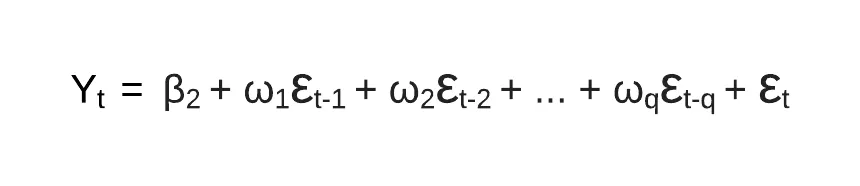  

- **SARIMA**
  - Extension of ARIMA that captures seasonality using seasonal AR and MA terms
  - Suitable for univariate series with fixed seasonal cycles (e.g., weekly, monthly)
  - Does not account for exogenous (external) variables.  
  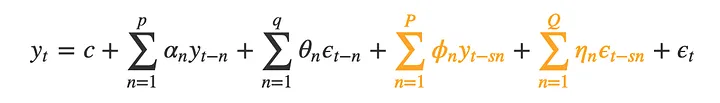  


- **SARIMAX**
  - Further extends SARIMA by incorporating exogenous variables (e.g., holidays, events, campaigns)
  - Captures trend, seasonality, and the effect of external predictors
  - Suitable for univariate series influenced by both internal structure and external drivers
  - Limitation: cannot handle multiple seasonalities.  
  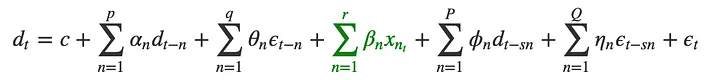  
  
- **Summary**
  - ARIMA: handles trend only  
  - SARIMA: handles trend + seasonality  
  - SARIMAX: handles trend + seasonality + exogenous variables

---

> 6️⃣Compare the number of views in different languages:

  
| **Language**         | **Min Views** | **Avg Views** | **Max Views**  | **Peak Day** |
|----------------------|--------------:|--------------:|---------------:|--------------|
| **English**          |      3,749.30 |     5,066.09  | **9,613.60**   | Monday       |
| **Russian**          |        544.70 |     1,038.82  | **3,240.50**   | Monday       |
| **Spanish**          |        682.10 |     1,298.98  | **2,259.50**   | Tuesday      |
| **Japanese**         |        475.00 |       801.99  | **1,554.40**   | Sunday       |
| **German**           |        691.70 |       946.24  | **1,398.30**   | Monday       |
| **French**           |        429.80 |       681.13  | **1,176.60**   | Sunday       |
| **Chinese**          |        224.60 |       360.49  | **  718.80**   | Sunday       |
| **Unknown Language** |        101.80 |       165.36  | **  396.40**   | Wednesday    |

  
- English has the highest average daily views, followed by Spanish and Russian, indicating its dominant global reach.

- Spanish pages receive more consistent and regular engagement, suggesting a stable audience with high retention.

- Chinese and Unknown languages have the lowest viewership, implying limited reach or lower demand for wiki content in those languages.

----

> 7️⃣ What other methods other than grid search would be suitable to get the model for all languages?  

- **Random Search** can be used as a faster alternative to grid search by sampling random combinations of hyperparameters. It often finds good results with fewer iterations.

- **Bayesian Optimization** leverages probabilistic models (like Gaussian Processes) to intelligently select the next set of hyperparameters based on past performance, improving efficiency over exhaustive grid search.

- **Genetic Algorithms** simulate natural selection processes to evolve the best set of hyperparameters over multiple generations.

- **Hyperband** dynamically allocates resources to promising configurations and eliminates poor performers early, making it efficient for large search spaces.

- **Optuna or Tune Libraries** support pruning, parallelism, and advanced search strategies, ideal for scalable and automated hyperparameter tuning.

- **Automated Machine Learning (AutoML)** platforms can be used to select and tune the best model across languages with minimal manual intervention.

- **Cross-validation based tuning** ensures robust performance across different time-based folds, improving generalization.

<h2 align='center'>Analysed by : <font color='#fa7f22'><b> KASI </b></font></h2>